In [1]:
import numpy as np
from PIL import Image , ImageStat
import glob
import cv2

In [2]:
import os
import time
import tensorflow as tf
import numpy as np
from glob import glob
import datetime
import random
import PIL
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
%matplotlib inline
import urllib
import tarfile
import xml.etree.ElementTree as ET
from imageio import imread, imsave, mimsave
import shutil
import cv2
import glob
from imageio import imread, imsave, mimsave

In [11]:
path1 = glob.glob("/content/drive/MyDrive/DataSets/Dataset/Class 1/*.png")
class1 = []
for img in path1:
    n = cv2.imread(img)
    class1.append(n)
class1 = np.array(class1)

path2 = glob.glob("/content/drive/MyDrive/DataSets/Dataset/Class 2/*.png")
class2 = []
for img in path2:
    n = cv2.imread(img)
    class2.append(n)
class2 = np.array(class2)

path3 = glob.glob("/content/drive/MyDrive/DataSets/Dataset/Class 3/*.png")
class3 = []
for img in path3:
    n = cv2.imread(img)
    class3.append(n)
class3 = np.array(class3)

path4 = glob.glob("/content/drive/MyDrive/DataSets/Dataset/Class 4/*.png")
class4 = []
for img in path4:
    n = cv2.imread(img)
    class4.append(n)
class4 = np.array(class4)

path5 = glob.glob("/content/drive/MyDrive/DataSets/Dataset/Class 5/*.png")
class5 = []
for img in path5:
    n = cv2.imread(img)
    class5.append(n)
class5 = np.array(class5)

In [12]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

In [13]:
imagesIn = np.concatenate((class1, class2 , class3, class4 ,class5), axis=0)

In [14]:
imagesIn.shape

(1005, 32, 32, 3)

In [15]:
np.random.shuffle(imagesIn)

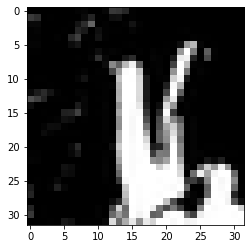

In [16]:
plt.imshow(imagesIn[3, :, :, 0], cmap='gray')

In [17]:
def generator(z, output_channel_dim, training):
    with tf.variable_scope("generator", reuse= not training):
        
        fully_connected = tf.layers.dense(z, 4*4*512)
        fully_connected = tf.reshape(fully_connected, (-1, 4, 4, 512))
        fully_connected = tf.nn.leaky_relu(fully_connected)

        trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                                 filters=256,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv1")
        batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv1")
        trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1,
                                           name="trans_conv1_out")
    
        trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
                                                 filters=128,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv2")
        batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv2")
        trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2,
                                           name="trans_conv2_out")

        trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
                                                 filters=64,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv3")
        batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv3")
        trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3,
                                           name="trans_conv3_out")
        
        logits = tf.layers.conv2d_transpose(inputs=trans_conv3_out,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding="SAME",
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name="logits")
        out = tf.tanh(logits, name="out")
        return out

In [18]:
def discriminator(x, reuse):
    with tf.variable_scope("discriminator", reuse=reuse): 

        conv2 = tf.layers.conv2d(inputs=x,
                                 filters=64,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        

        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")

        
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=512,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 4*4*512))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

In [19]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)
    
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                    labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

In [20]:
def model_optimizers(d_loss, g_loss):
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator')]
    
    with tf.control_dependencies(gen_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1_D).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=LR_G, beta1=BETA1_G).minimize(g_loss, var_list=g_vars)  
    return d_train_opt, g_train_opt

In [21]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate_G = tf.placeholder(tf.float32, name="lr_g")
    learning_rate_D = tf.placeholder(tf.float32, name="lr_d")
    return inputs_real, inputs_z, learning_rate_G, learning_rate_D

In [22]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (IMAGE_SIZE, IMAGE_SIZE))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index].astype('uint8') 
        axis.imshow(image_array)
    plt.show()
    plt.close()

In [23]:
def save_samples(sample_images, name, epoch):
    # save images
    for index,img in enumerate(sample_images):
        image = Image.fromarray(img.astype('uint8') )
        image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 

In [24]:
IMG_DIR = "images"

In [25]:
def test(sess, input_z, out_channel_dim, epoch):
    example_z = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_z.get_shape().as_list()[-1]])
    samples = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, IMG_DIR + "samples", epoch)

In [26]:
def generate (sess, input_z, out_channel_dim):
    # print (">> Generating 1k images ...")
    for i in tqdm(range(10)):
        example_z = np.random.uniform(-1, 1, size=[100, 100]).astype(np.float32)
        imgs = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
        imgs = [((img + 1.0) * 127.5).astype(np.uint8) for img in imgs]
        imsave(os.path.join(IMG_DIR, f'image{i}.png'), imgs[i])

In [27]:
def summarize_epoch(epoch, duration, sess, d_losses, g_losses, input_z, data_shape):
    minibatch_size = int(data_shape[0]//BATCH_SIZE)
    print("Epoch {}/{}".format(epoch, EPOCHS),
          "\nDuration: {:.5f}".format(duration),
          "\nD Loss: {:.5f}".format(np.mean(d_losses[-minibatch_size:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-minibatch_size:])))
    
    fig, ax = plt.subplots()
    plt.plot(d_losses, label='Discriminator', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    #plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    test(sess, input_z, data_shape[3], epoch)

In [28]:
def get_batches(data):
    batches = []
    for i in range(int(data.shape[0]//BATCH_SIZE)):
        batch = data[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
        augmented_images = []
        for img in batch:
            image = Image.fromarray(img.astype('uint8'))
            if random.choice([True, False]):
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            augmented_images.append(np.asarray(image))
        batch = np.asarray(augmented_images)
        normalized_batch = (batch / 127.5) - 1.0
        batches.append(normalized_batch)
    return batches

In [29]:
def train(get_batches, data_shape, LR_G = 2e-4, LR_D = 0.0005):
    input_images, input_z, lr_G, lr_D = model_inputs(data_shape[1:], NOISE_SIZE)
    d_loss, g_loss = model_loss(input_images, input_z, data_shape[3])
    d_opt, g_opt = model_optimizers(d_loss, g_loss)
    generator_epoch_loss = 0
    train_d_losses = []
    train_g_losses = []
    generator_epoch_loss = 999
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        epoch = 0
        iteration = 0
        d_losses = []
        g_losses = []
        
        for epoch in tqdm(range(EPOCHS)):        
            epoch += 1
            start_time = time.time()
                
            for batch_images in get_batches:
                iteration += 1
                batch_z = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_SIZE))
                _ = sess.run(d_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_D: LR_D})
                _ = sess.run(g_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_G: LR_G})
                d_losses.append(d_loss.eval({input_z: batch_z, input_images: batch_images}))
                g_losses.append(g_loss.eval({input_z: batch_z}))

            summarize_epoch(epoch, time.time()-start_time, sess, d_losses, g_losses, input_z, data_shape)
            minibatch_size = int(data_shape[0]//BATCH_SIZE)
            generator_epoch_loss = np.mean(g_losses[-minibatch_size:])
            train_d_losses.append(np.mean(d_losses[-minibatch_size:]))
            train_g_losses.append(np.mean(g_losses[-minibatch_size:]))
            
            if epoch == EPOCHS:
                generate (sess, input_z, out_channel_dim=3)
            
    fig, ax = plt.subplots()
    plt.plot(train_d_losses, label='Discriminator', alpha=0.5)
    plt.plot(train_g_losses, label='Generator', alpha=0.5)
    plt.title("Training Losses")
    plt.legend()
    plt.savefig('train_losses.png')
    plt.show()
    plt.close()
    

In [30]:
%rm -rf <images>

/bin/bash: -c: line 0: syntax error near unexpected token `newline'
/bin/bash: -c: line 0: `rm -rf <images>'


In [31]:
IMAGE_SIZE = 32
NOISE_SIZE = 100
LR_D = 0.0005
LR_G = 2e-4
BATCH_SIZE = 64
EPOCHS = 80
BETA1_G = 0.5
BETA1_D = 0.5
WEIGHT_INIT_STDDEV = 0.02
MOMENTUM = 0.9
EPSILON = 0.0005
SAMPLES_TO_SHOW = 5 # each epoch

<ipython-input-17-b7478f90392c>:4: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  fully_connected = tf.layers.dense(z, 4*4*512)
<ipython-input-17-b7478f90392c>:8: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
<ipython-input-17-b7478f90392c>:15: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
Instructions for updating:
Colocations handled automatically by placer.


>> Start training...


<ipython-input-17-b7478f90392c>:22: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
<ipython-input-17-b7478f90392c>:29: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
<ipython-input-17-b7478f90392c>:36: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
<ipython-input-17-b7478f90392c>:43: UserWarning: `tf.layers.batch_normaliz

  0%|          | 0/80 [00:00<?, ?it/s]

Epoch 1/80 
Duration: 11.90072 
D Loss: 1.86927 
G Loss: 8.21515


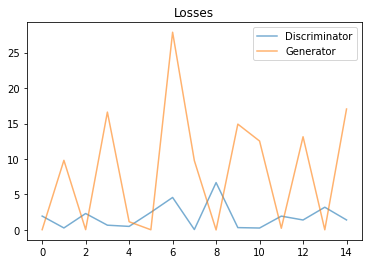

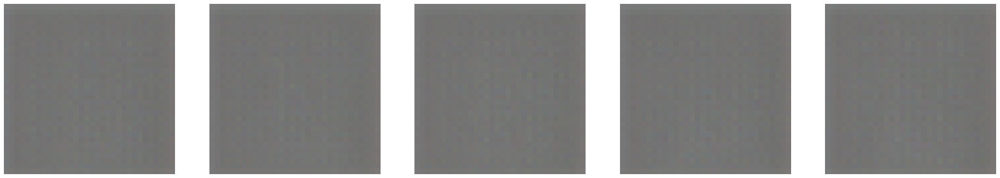

Epoch 2/80 
Duration: 2.86623 
D Loss: 1.45025 
G Loss: 6.00406


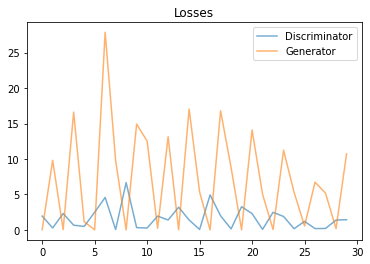

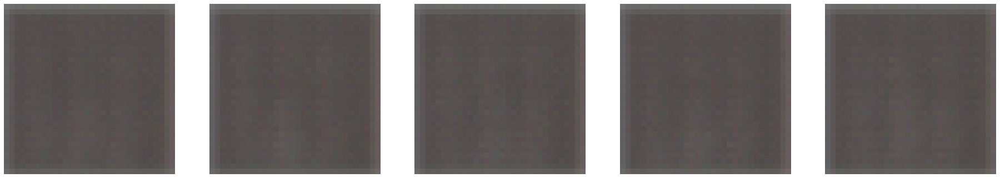

Epoch 3/80 
Duration: 2.88922 
D Loss: 0.57683 
G Loss: 5.26366


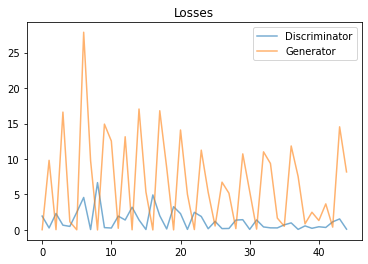

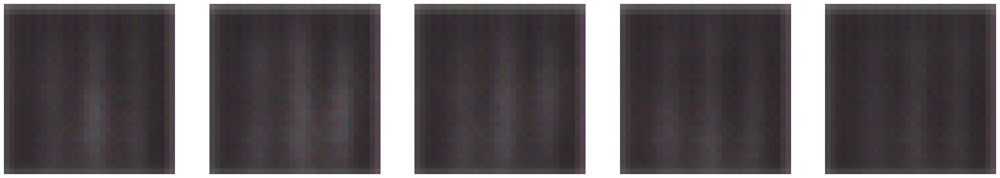

Epoch 4/80 
Duration: 2.89199 
D Loss: 0.47009 
G Loss: 4.47604


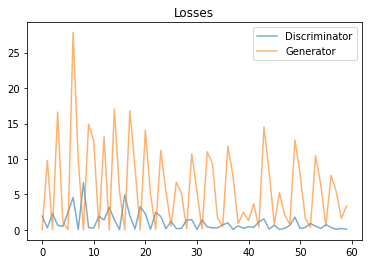

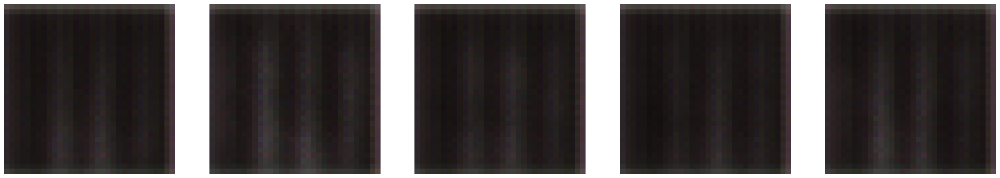

Epoch 5/80 
Duration: 2.92850 
D Loss: 0.08604 
G Loss: 3.32906


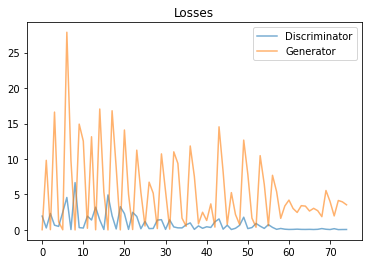

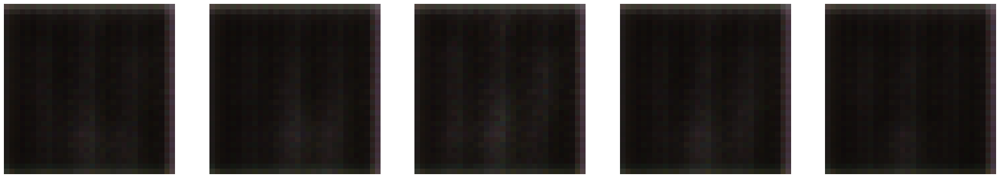

Epoch 6/80 
Duration: 2.92081 
D Loss: 0.10475 
G Loss: 3.51014


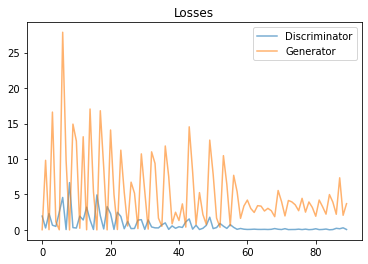

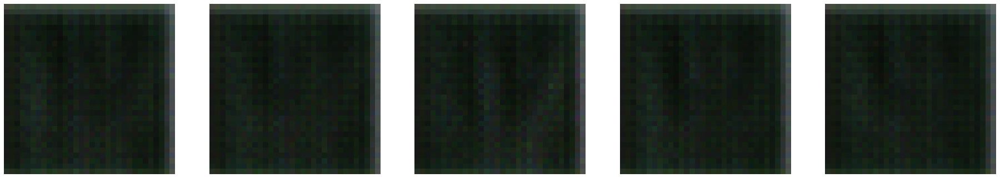

Epoch 7/80 
Duration: 2.92537 
D Loss: 0.40987 
G Loss: 4.73616


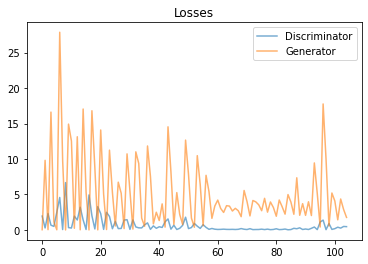

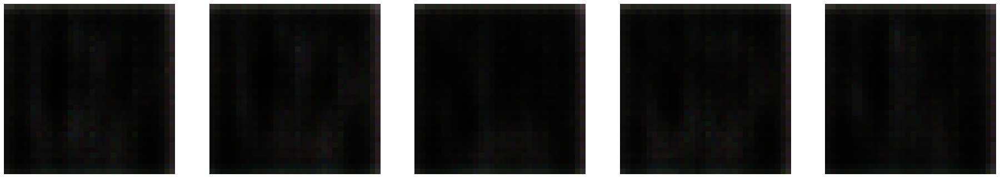

Epoch 8/80 
Duration: 2.95343 
D Loss: 0.47876 
G Loss: 2.91817


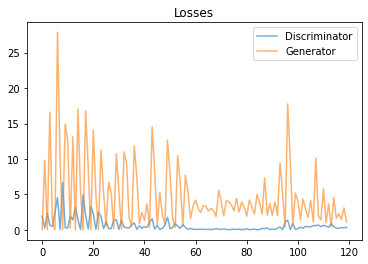

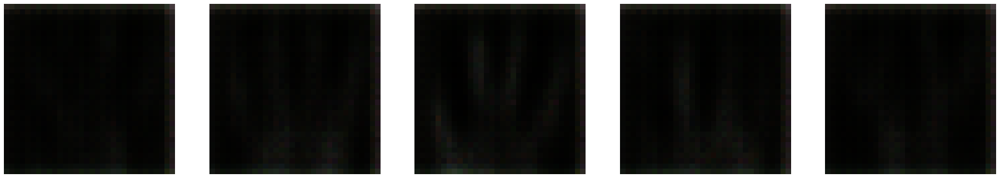

Epoch 9/80 
Duration: 2.96571 
D Loss: 0.45487 
G Loss: 2.45682


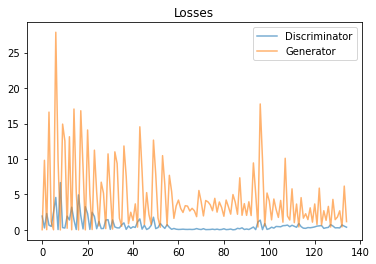

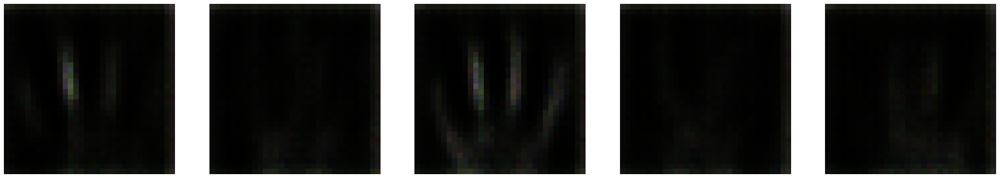

Epoch 10/80 
Duration: 2.97190 
D Loss: 0.31523 
G Loss: 2.35627


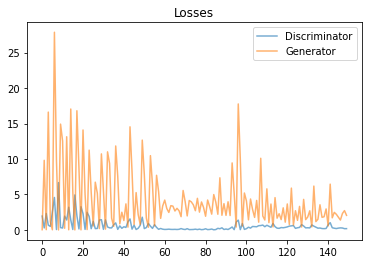

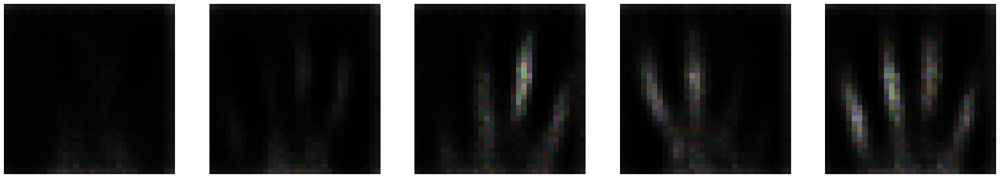

Epoch 11/80 
Duration: 2.99048 
D Loss: 0.22151 
G Loss: 2.36225


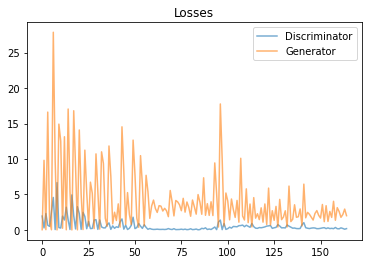

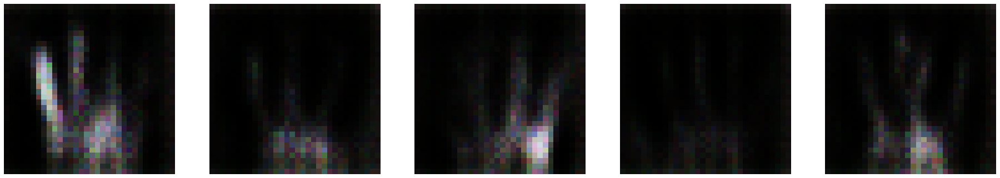

Epoch 12/80 
Duration: 3.00405 
D Loss: 0.65698 
G Loss: 2.76901


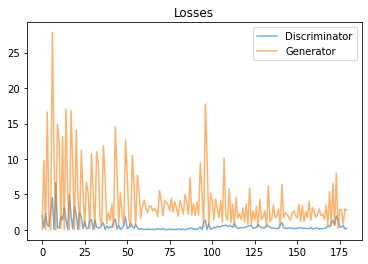

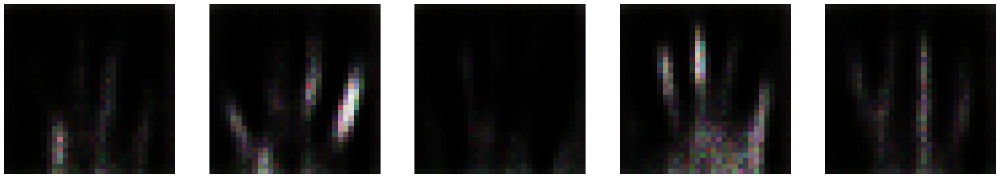

Epoch 13/80 
Duration: 3.00933 
D Loss: 0.20784 
G Loss: 2.10505


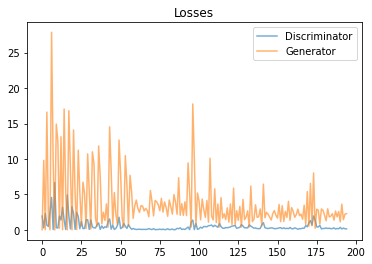

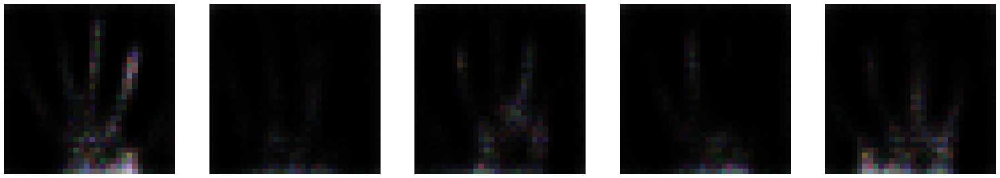

Epoch 14/80 
Duration: 3.01571 
D Loss: 0.44103 
G Loss: 2.38921


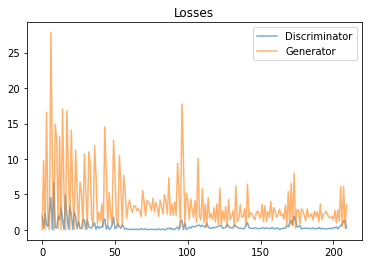

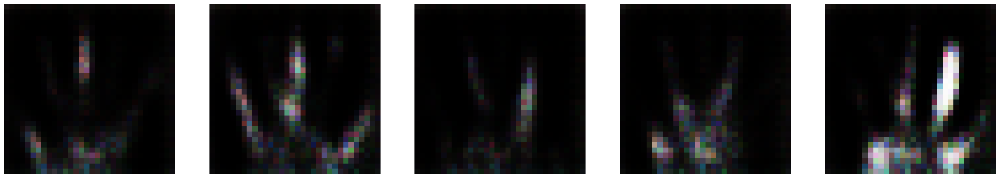

Epoch 15/80 
Duration: 3.03837 
D Loss: 0.24071 
G Loss: 2.17951


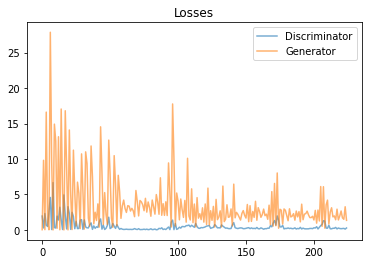

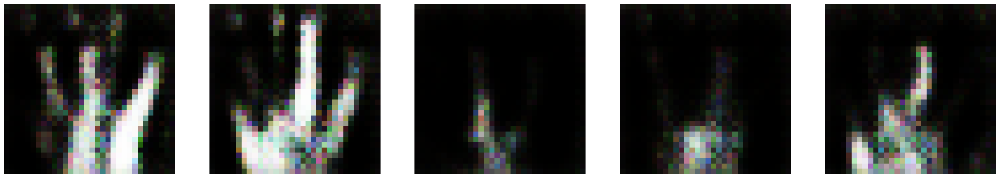

Epoch 16/80 
Duration: 3.11689 
D Loss: 0.19403 
G Loss: 2.23784


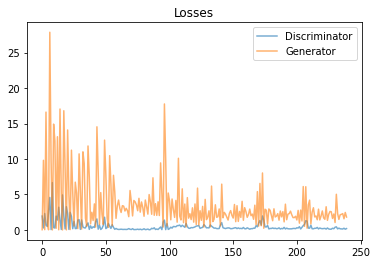

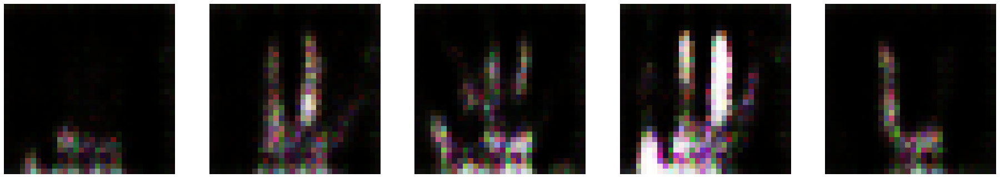

Epoch 17/80 
Duration: 3.06863 
D Loss: 0.23849 
G Loss: 2.17011


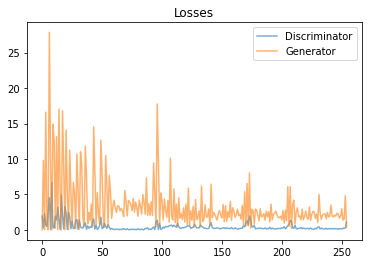

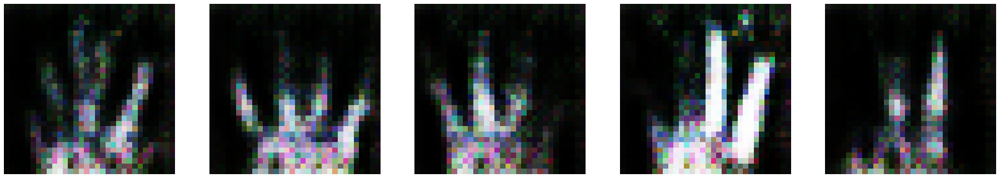

Epoch 18/80 
Duration: 3.07575 
D Loss: 0.81841 
G Loss: 2.98648


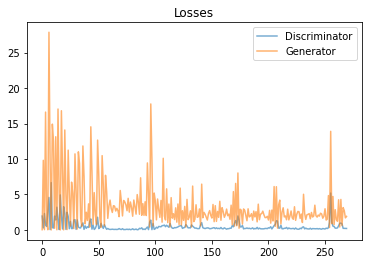

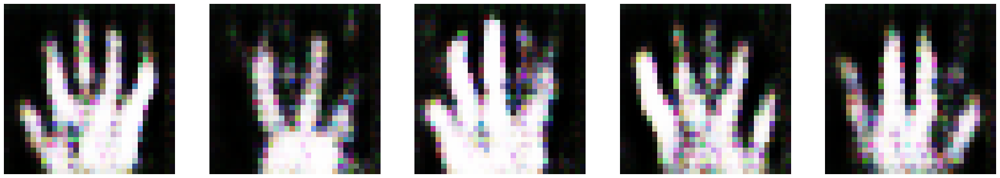

Epoch 19/80 
Duration: 3.06935 
D Loss: 0.29369 
G Loss: 2.07051


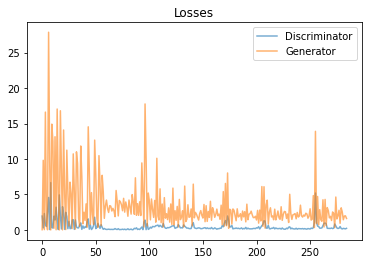

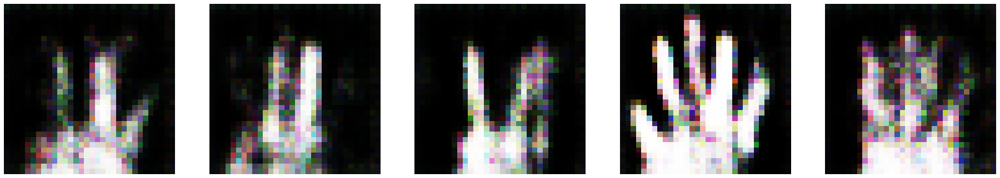

Epoch 20/80 
Duration: 3.08586 
D Loss: 0.18334 
G Loss: 1.99973


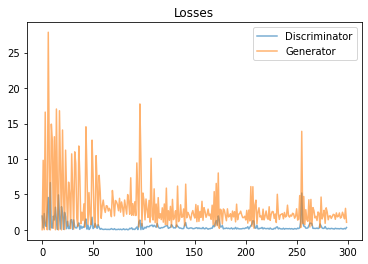

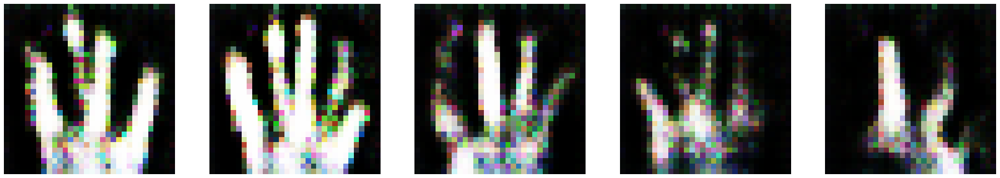

Epoch 21/80 
Duration: 3.08222 
D Loss: 0.18313 
G Loss: 2.06130


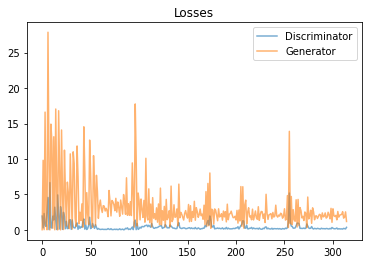

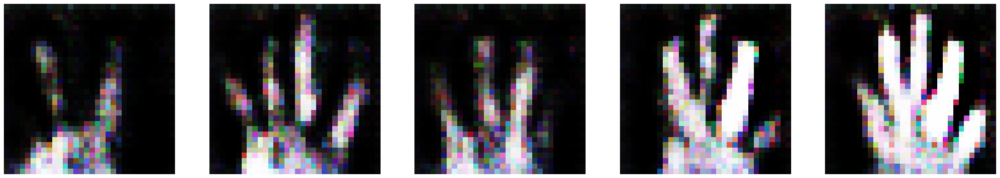

Epoch 22/80 
Duration: 3.08392 
D Loss: 0.82674 
G Loss: 2.64495


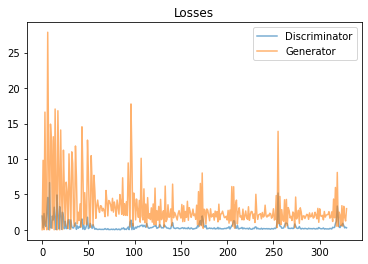

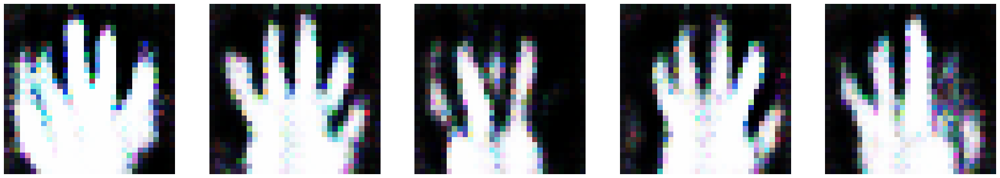

Epoch 23/80 
Duration: 3.07853 
D Loss: 0.23611 
G Loss: 2.11844


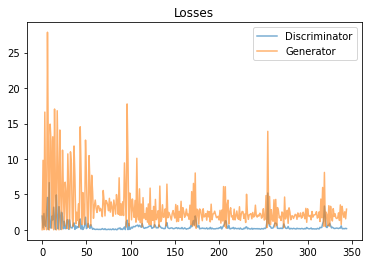

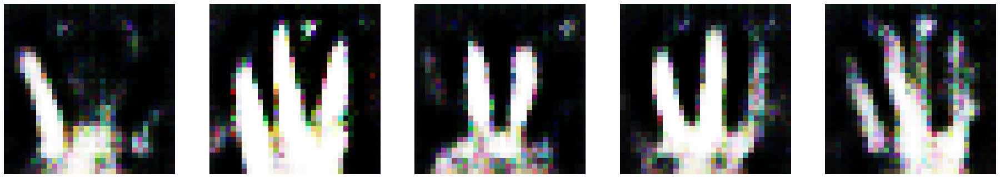

Epoch 24/80 
Duration: 3.05714 
D Loss: 0.25950 
G Loss: 2.25444


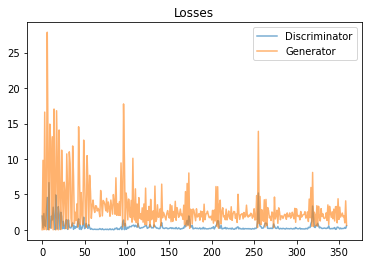

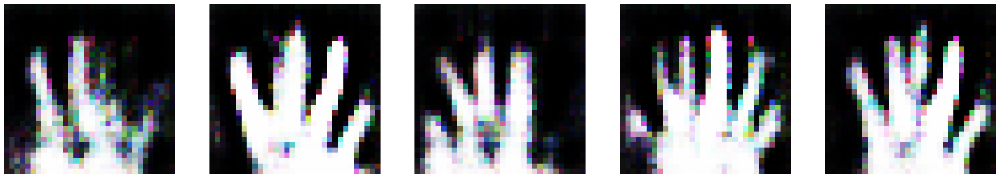

Epoch 25/80 
Duration: 3.07089 
D Loss: 0.14299 
G Loss: 2.48362


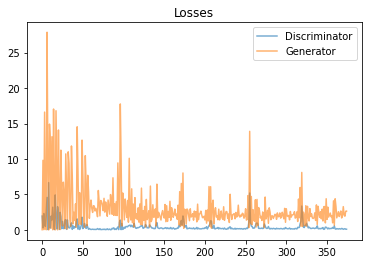

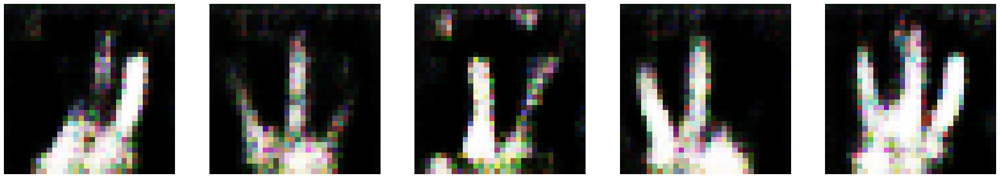

Epoch 26/80 
Duration: 3.03453 
D Loss: 0.52825 
G Loss: 2.62397


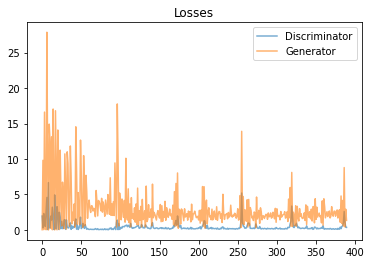

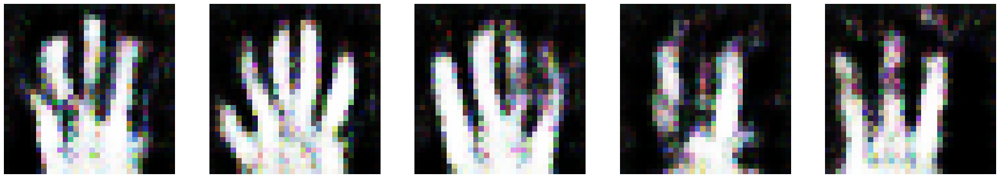

Epoch 27/80 
Duration: 3.03009 
D Loss: 0.26401 
G Loss: 2.09493


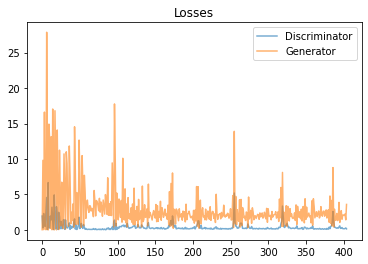

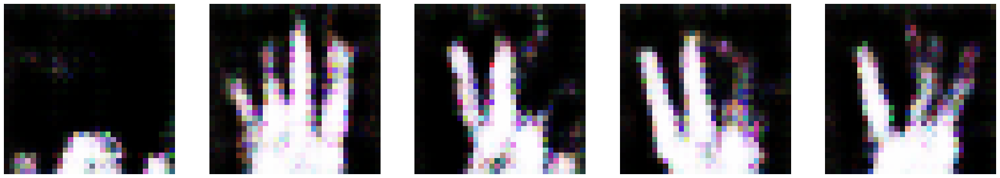

Epoch 28/80 
Duration: 3.02435 
D Loss: 0.19827 
G Loss: 2.37560


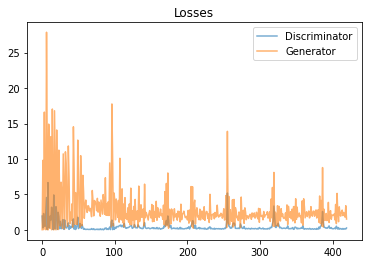

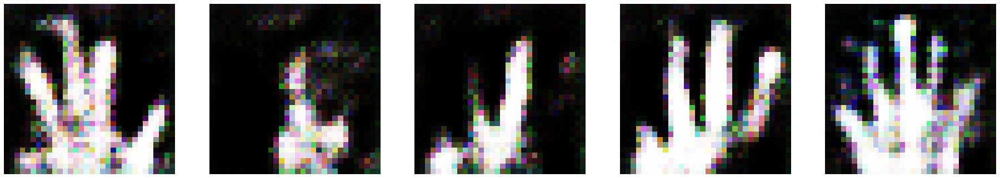

Epoch 29/80 
Duration: 3.01940 
D Loss: 0.14976 
G Loss: 2.40120


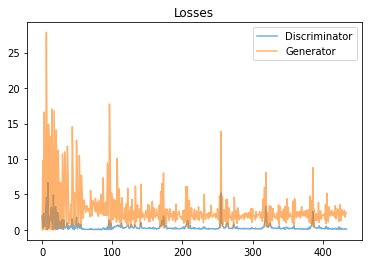

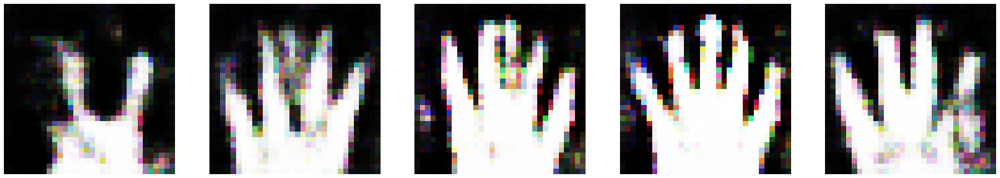

Epoch 30/80 
Duration: 3.01748 
D Loss: 0.11854 
G Loss: 2.63661


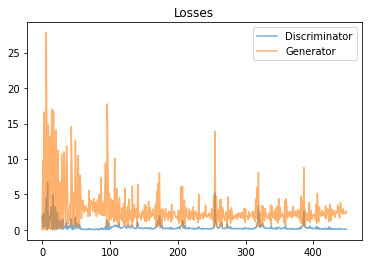

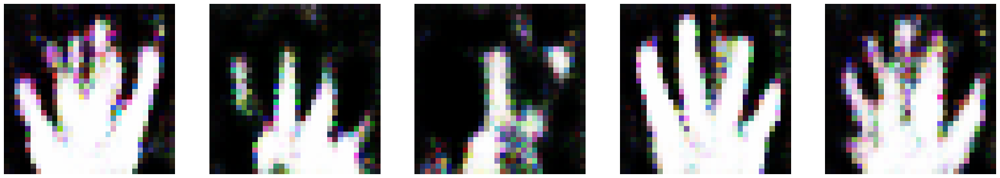

Epoch 31/80 
Duration: 3.01064 
D Loss: 0.11330 
G Loss: 2.67155


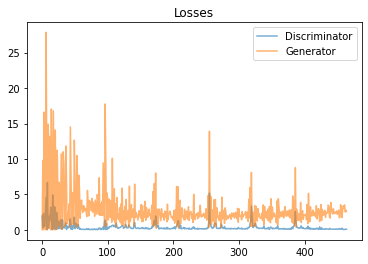

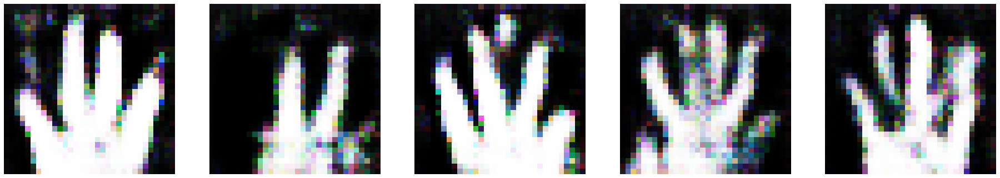

Epoch 32/80 
Duration: 3.01020 
D Loss: 0.52065 
G Loss: 2.83054


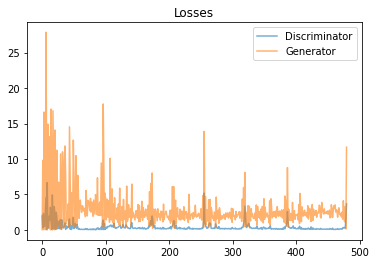

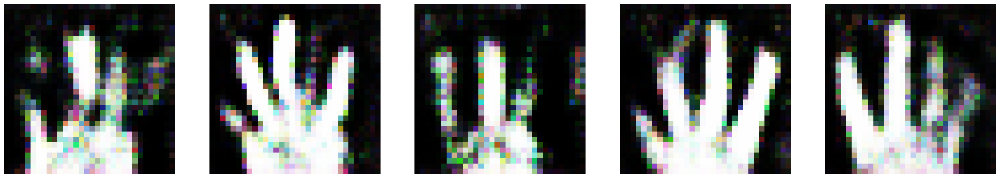

Epoch 33/80 
Duration: 3.01567 
D Loss: 0.60265 
G Loss: 2.16911


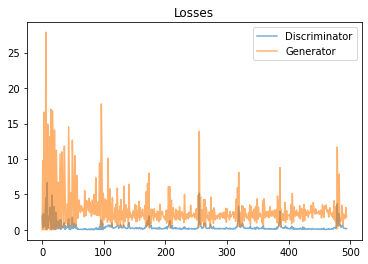

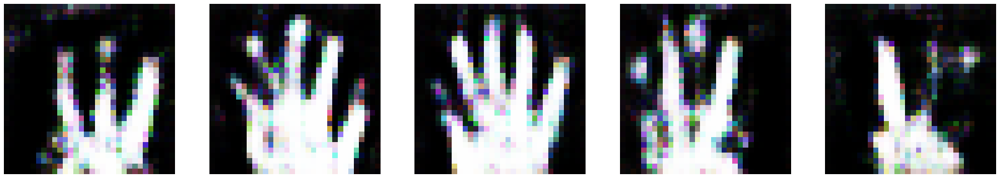

Epoch 34/80 
Duration: 3.01365 
D Loss: 0.15846 
G Loss: 2.14872


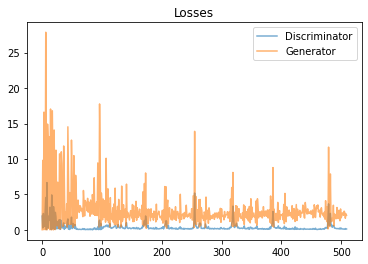

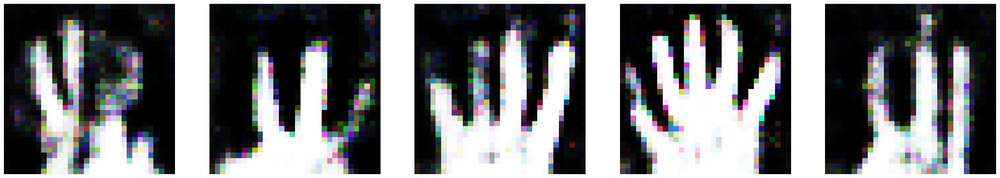

Epoch 35/80 
Duration: 3.01583 
D Loss: 0.41974 
G Loss: 2.38621


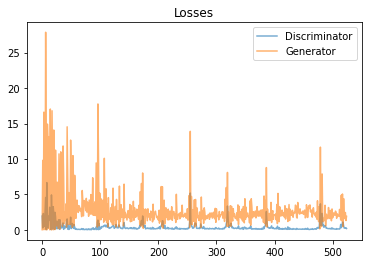

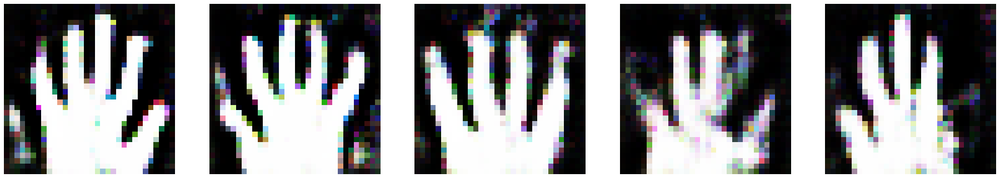

Epoch 36/80 
Duration: 3.03151 
D Loss: 0.16744 
G Loss: 2.17678


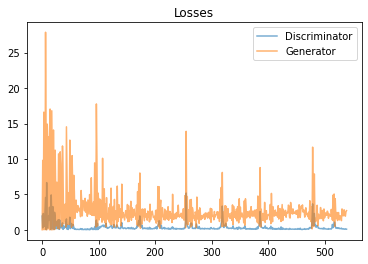

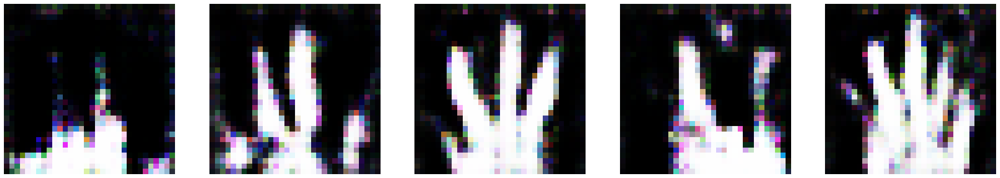

Epoch 37/80 
Duration: 3.04514 
D Loss: 0.13080 
G Loss: 2.31546


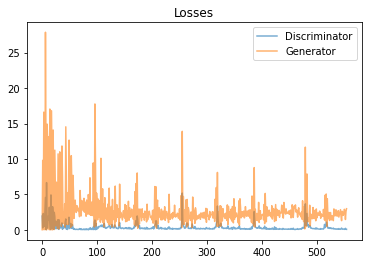

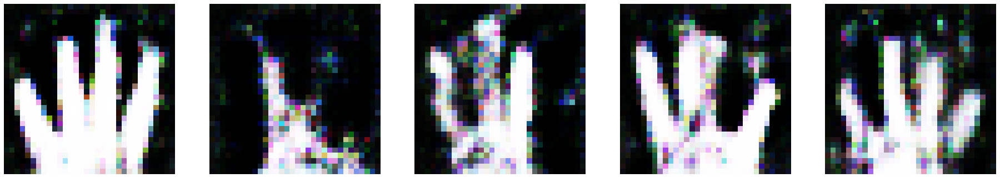

Epoch 38/80 
Duration: 3.02928 
D Loss: 0.12603 
G Loss: 2.43039


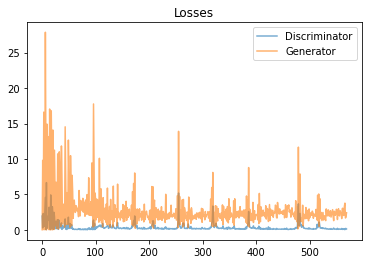

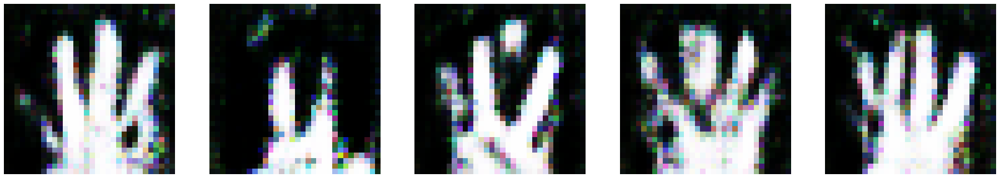

Epoch 39/80 
Duration: 3.04443 
D Loss: 0.11647 
G Loss: 2.31401


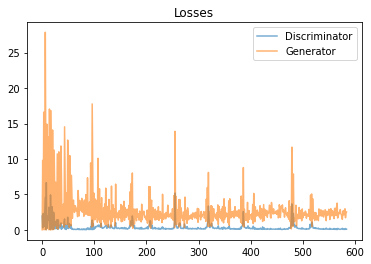

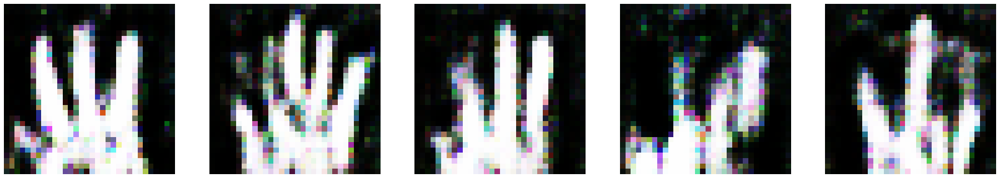

Epoch 40/80 
Duration: 3.05281 
D Loss: 0.19365 
G Loss: 2.33123


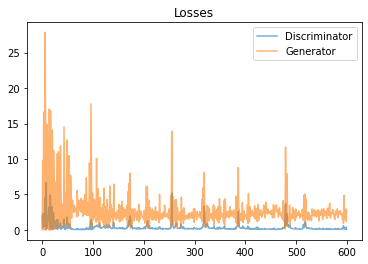

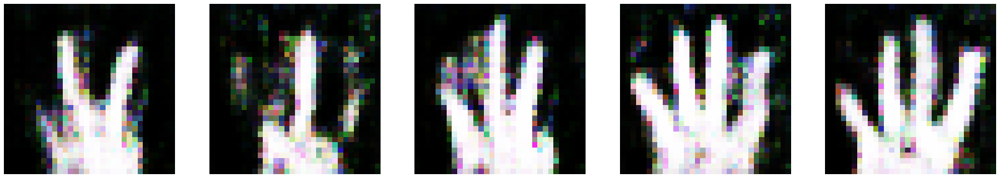

Epoch 41/80 
Duration: 3.03783 
D Loss: 0.17284 
G Loss: 2.48619


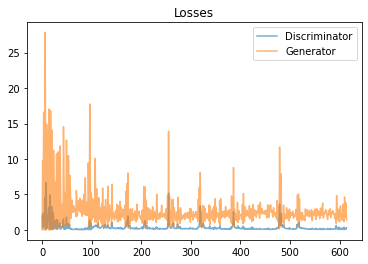

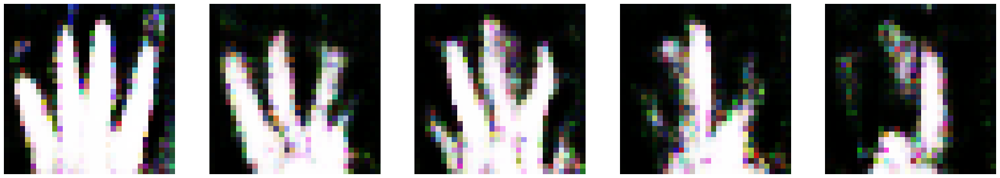

Epoch 42/80 
Duration: 3.02861 
D Loss: 1.03573 
G Loss: 2.56623


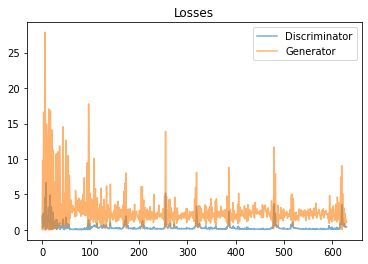

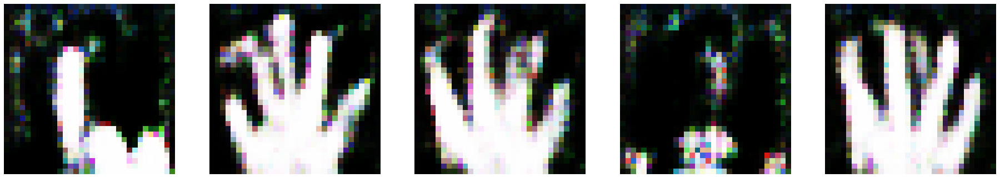

Epoch 43/80 
Duration: 3.05399 
D Loss: 0.29520 
G Loss: 1.75310


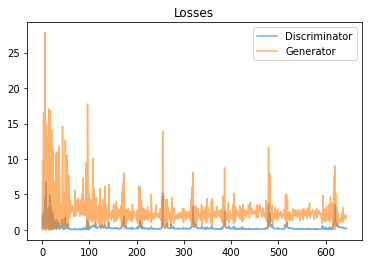

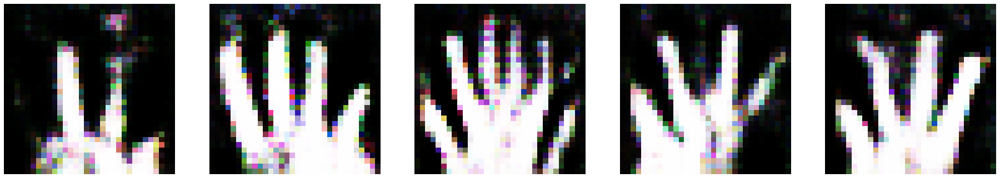

Epoch 44/80 
Duration: 3.06253 
D Loss: 0.26036 
G Loss: 2.20051


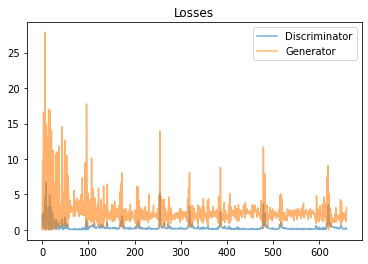

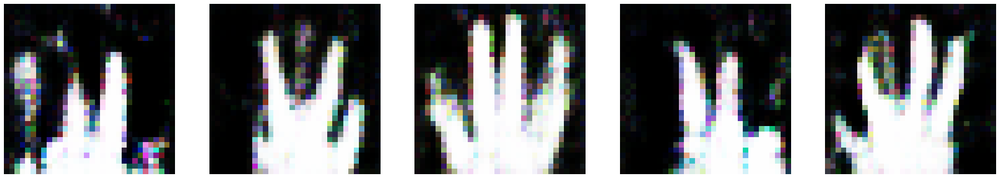

Epoch 45/80 
Duration: 3.03866 
D Loss: 0.22404 
G Loss: 2.32066


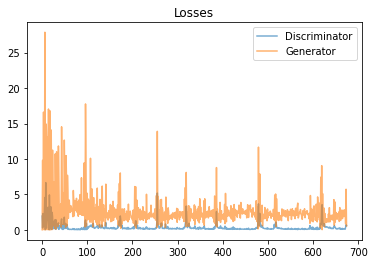

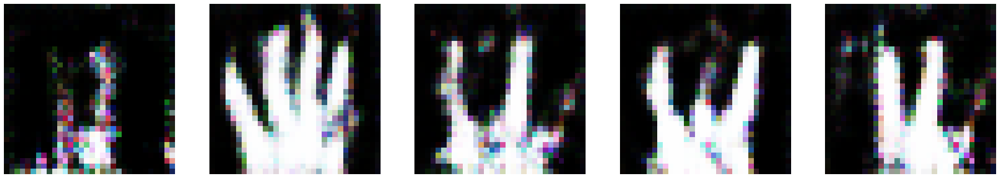

Epoch 46/80 
Duration: 3.04661 
D Loss: 0.39232 
G Loss: 2.27731


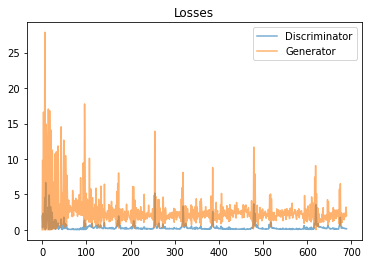

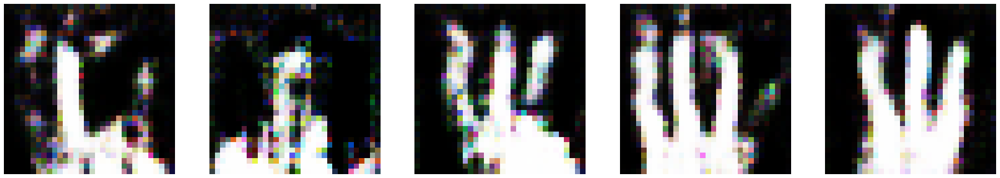

Epoch 47/80 
Duration: 3.02832 
D Loss: 0.13364 
G Loss: 2.18267


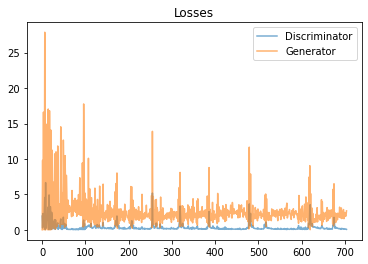

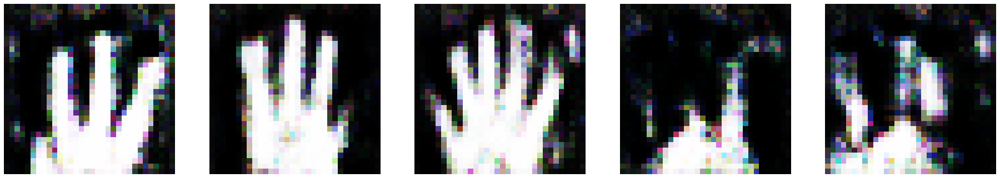

Epoch 48/80 
Duration: 3.03861 
D Loss: 0.13575 
G Loss: 2.29977


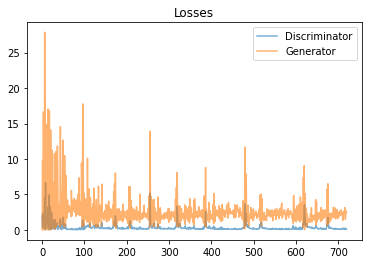

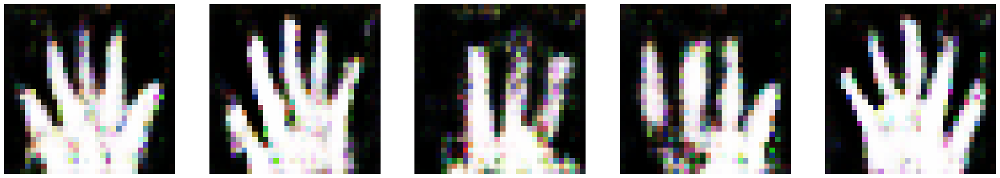

Epoch 49/80 
Duration: 3.03419 
D Loss: 0.11709 
G Loss: 2.32612


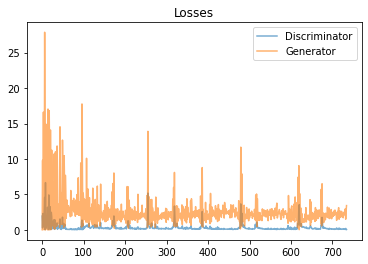

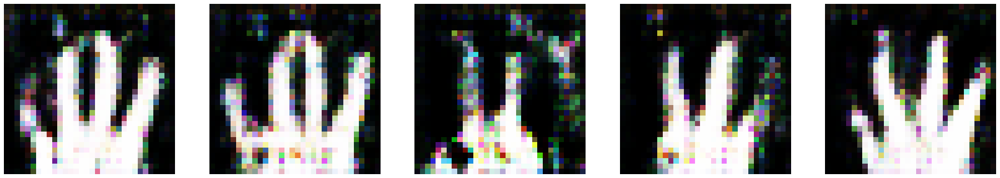

Epoch 50/80 
Duration: 3.02923 
D Loss: 0.11687 
G Loss: 2.33866


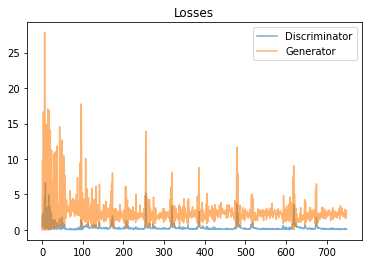

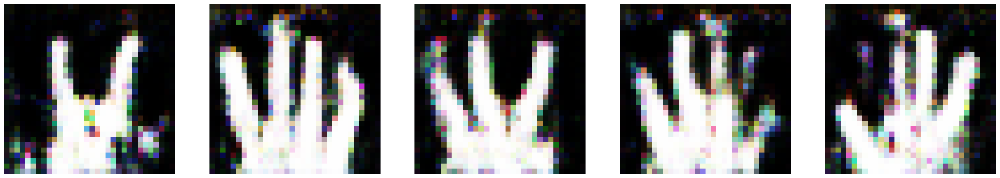

Epoch 51/80 
Duration: 3.03925 
D Loss: 0.53186 
G Loss: 2.77564


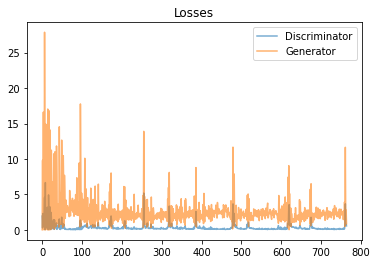

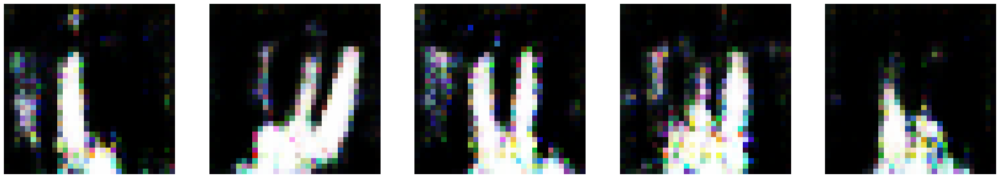

Epoch 52/80 
Duration: 3.02568 
D Loss: 0.43612 
G Loss: 1.92822


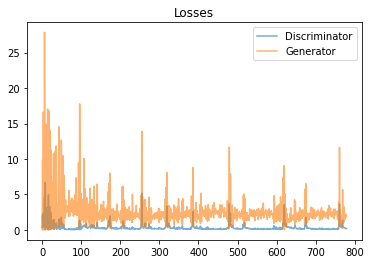

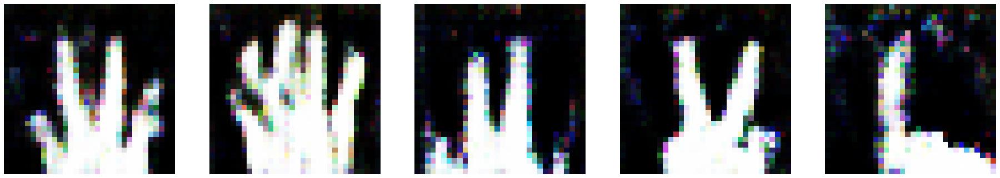

Epoch 53/80 
Duration: 3.03884 
D Loss: 0.21642 
G Loss: 2.27711


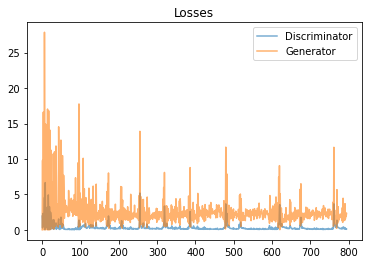

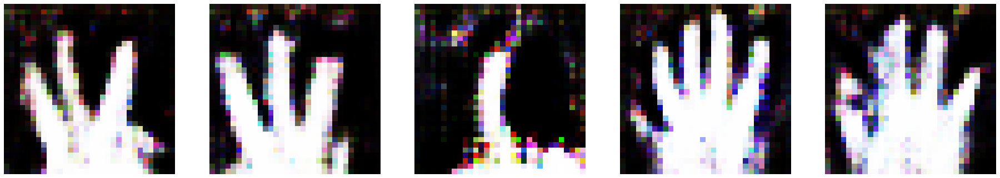

Epoch 54/80 
Duration: 3.03246 
D Loss: 0.12748 
G Loss: 2.32945


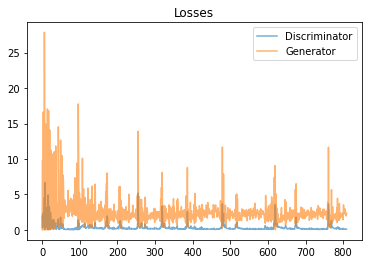

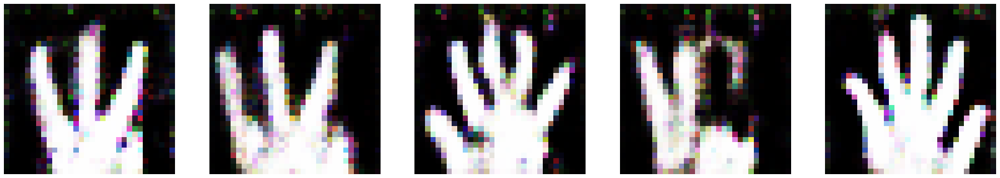

Epoch 55/80 
Duration: 3.02347 
D Loss: 0.09589 
G Loss: 2.46322


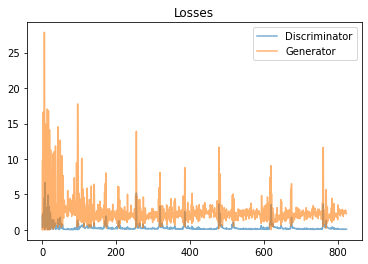

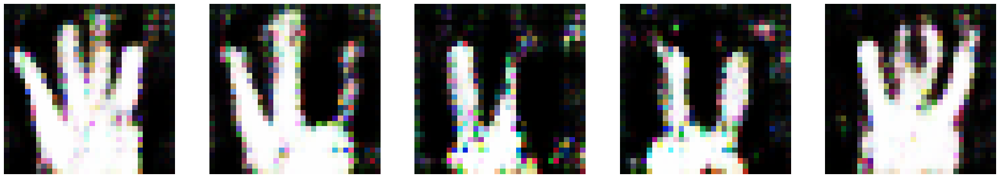

Epoch 56/80 
Duration: 3.02863 
D Loss: 0.10928 
G Loss: 2.41832


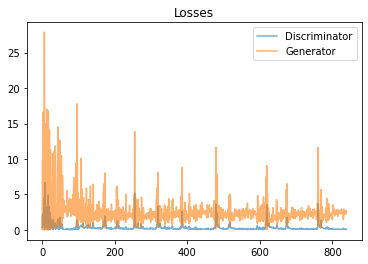

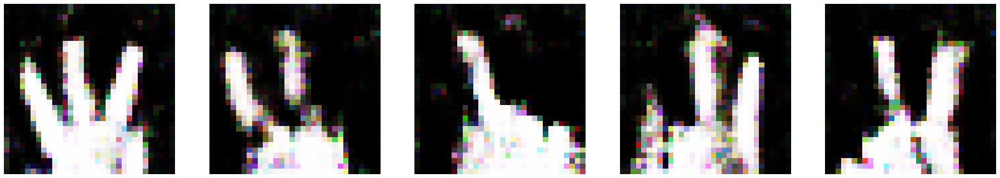

Epoch 57/80 
Duration: 3.04124 
D Loss: 0.10613 
G Loss: 2.38918


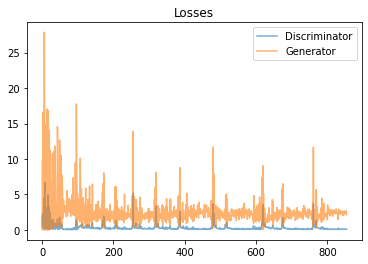

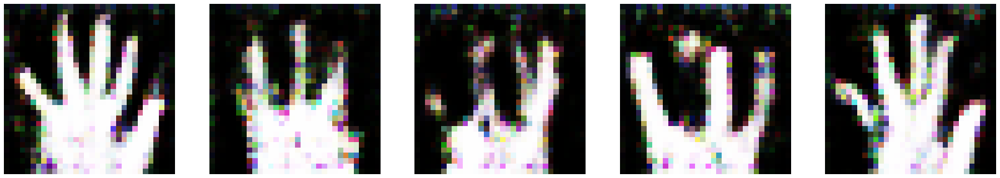

Epoch 58/80 
Duration: 3.03415 
D Loss: 0.10765 
G Loss: 2.44823


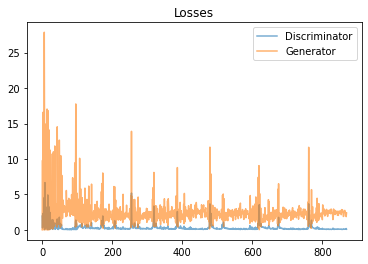

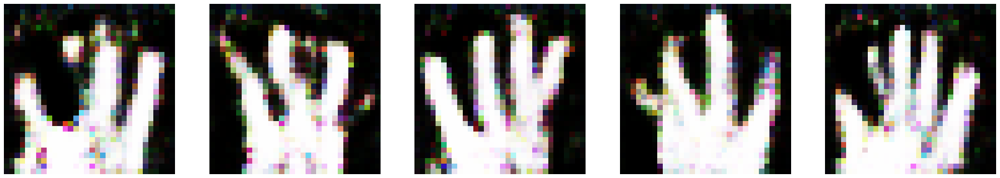

Epoch 59/80 
Duration: 3.02648 
D Loss: 0.08333 
G Loss: 2.95521


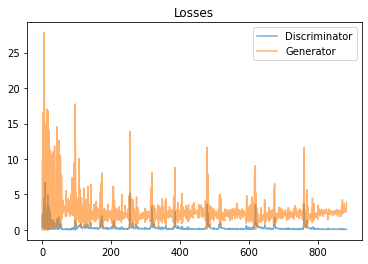

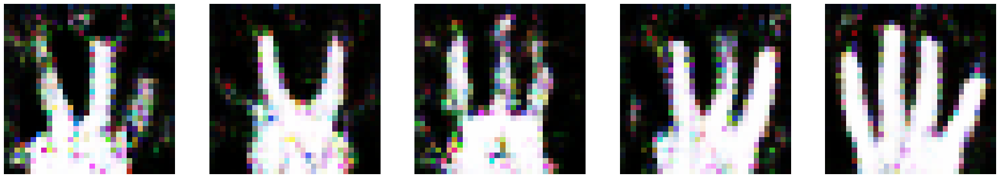

Epoch 60/80 
Duration: 3.04102 
D Loss: 0.54551 
G Loss: 3.08232


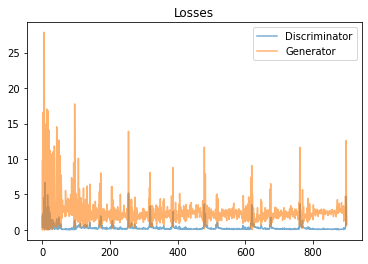

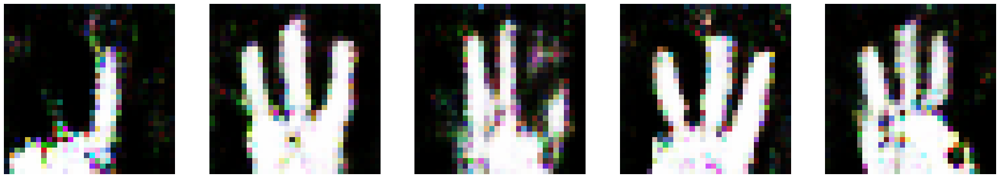

Epoch 61/80 
Duration: 3.03593 
D Loss: 0.39790 
G Loss: 2.21288


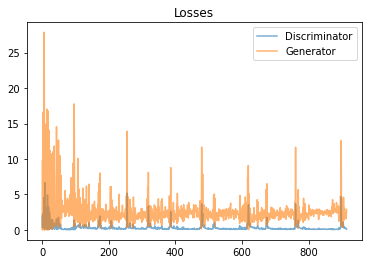

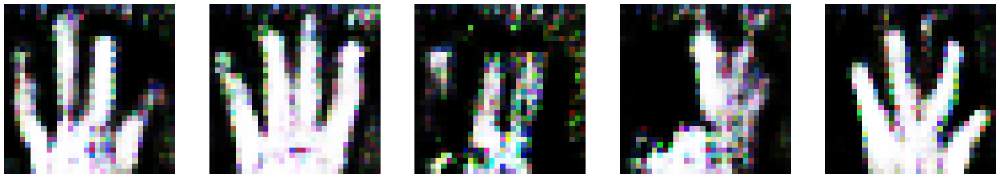

Epoch 62/80 
Duration: 3.03183 
D Loss: 0.49851 
G Loss: 2.66429


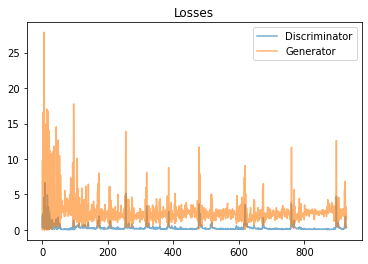

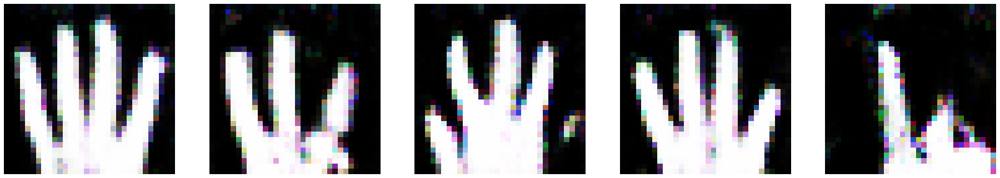

Epoch 63/80 
Duration: 3.04341 
D Loss: 0.31643 
G Loss: 2.17475


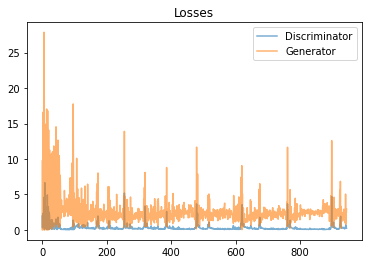

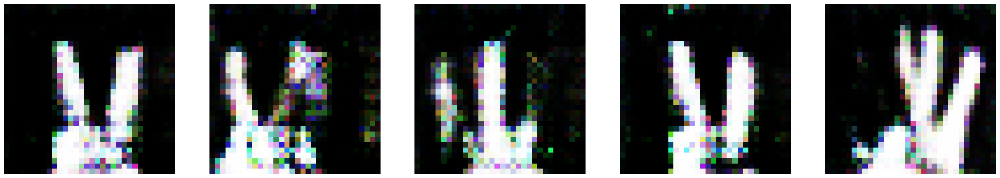

Epoch 64/80 
Duration: 3.04125 
D Loss: 0.18888 
G Loss: 2.24142


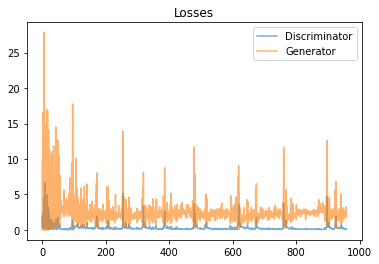

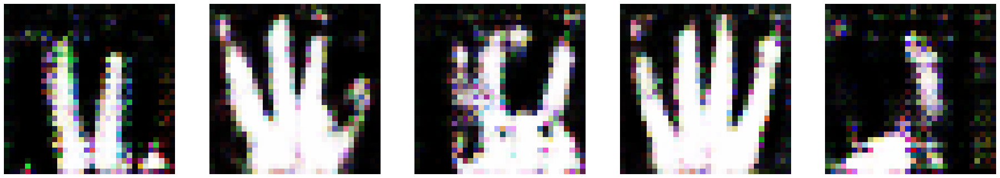

Epoch 65/80 
Duration: 3.03491 
D Loss: 0.12044 
G Loss: 2.36729


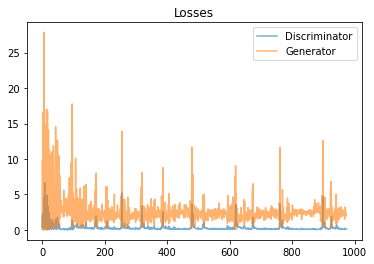

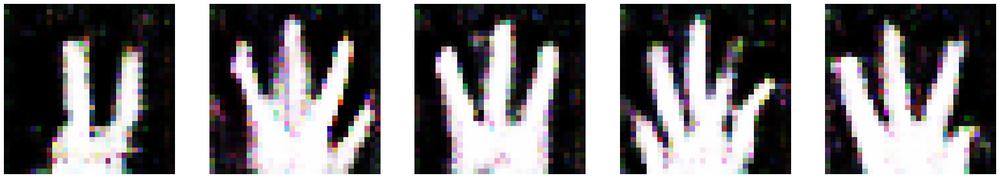

Epoch 66/80 
Duration: 3.05132 
D Loss: 0.12480 
G Loss: 2.45584


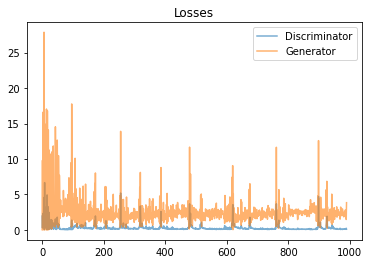

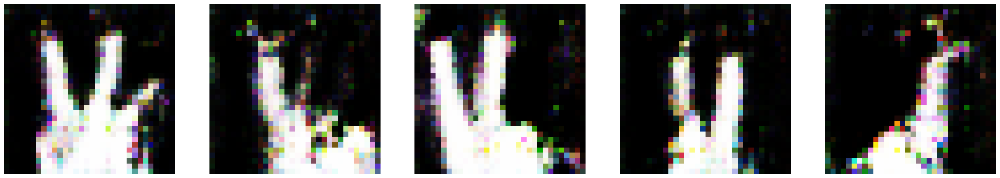

Epoch 67/80 
Duration: 3.04512 
D Loss: 0.13500 
G Loss: 2.49224


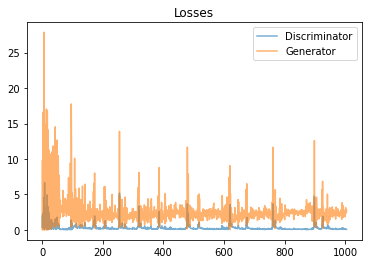

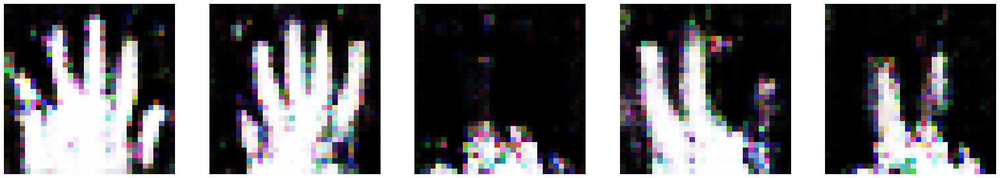

Epoch 68/80 
Duration: 3.04045 
D Loss: 0.09186 
G Loss: 2.83779


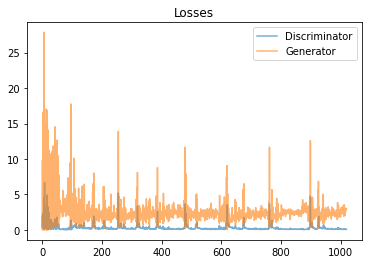

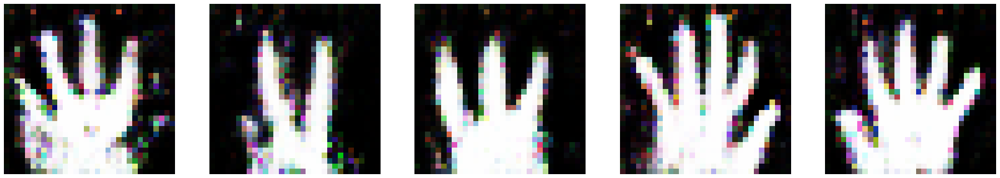

Epoch 69/80 
Duration: 3.04601 
D Loss: 0.09347 
G Loss: 2.80140


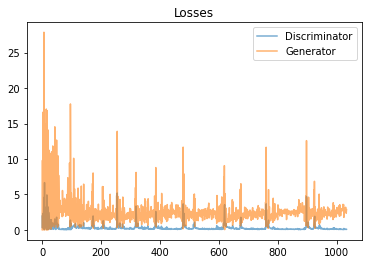

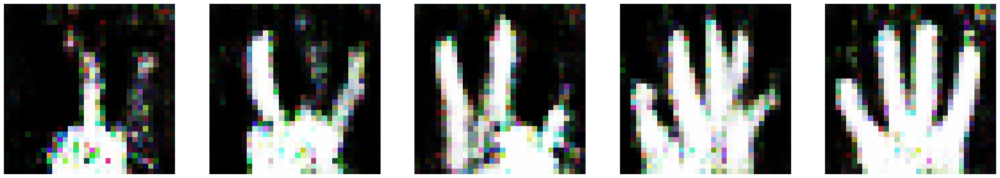

Epoch 70/80 
Duration: 3.03830 
D Loss: 0.09035 
G Loss: 2.81565


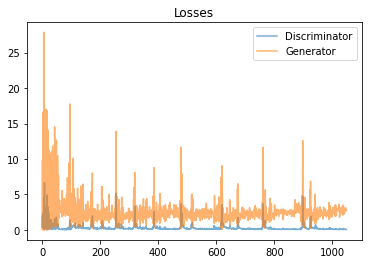

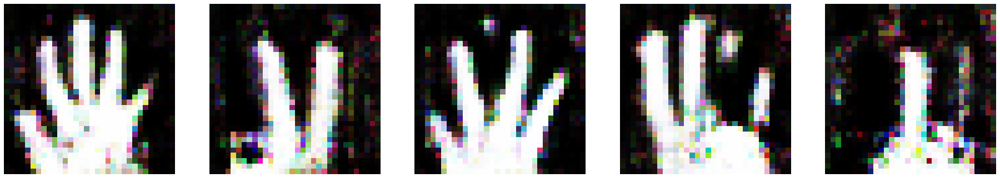

Epoch 71/80 
Duration: 3.05280 
D Loss: 0.07395 
G Loss: 3.06449


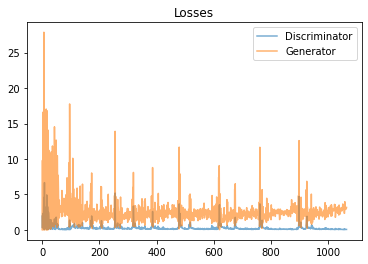

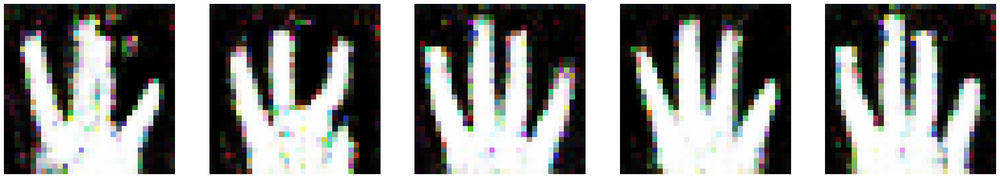

Epoch 72/80 
Duration: 3.04026 
D Loss: 0.07317 
G Loss: 3.09338


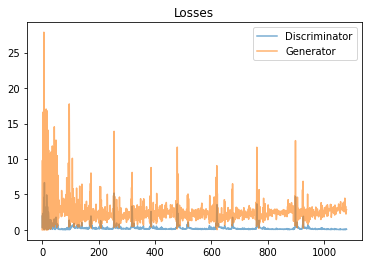

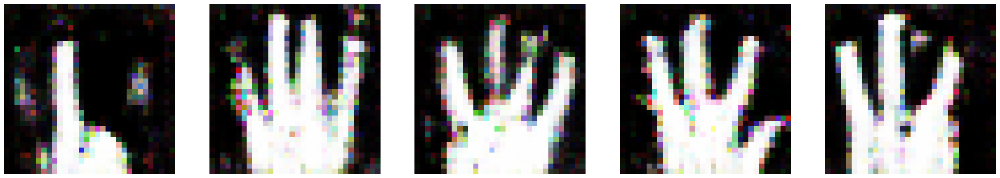

Epoch 73/80 
Duration: 3.03542 
D Loss: 0.07841 
G Loss: 3.05435


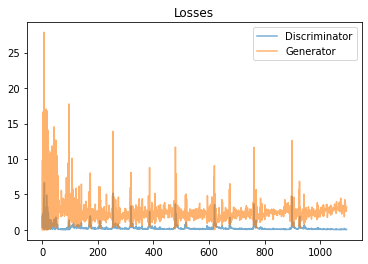

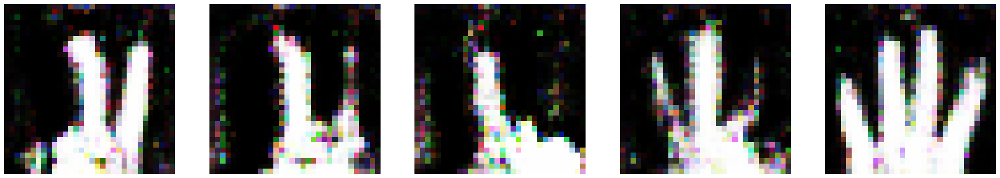

Epoch 74/80 
Duration: 3.03549 
D Loss: 0.64007 
G Loss: 3.54373


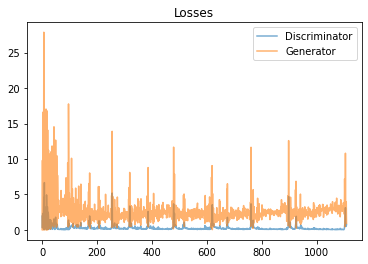

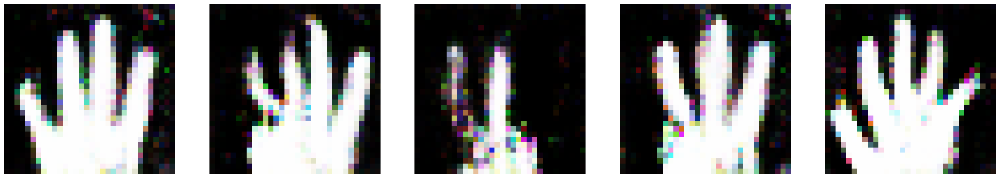

Epoch 75/80 
Duration: 3.03292 
D Loss: 0.28049 
G Loss: 2.31903


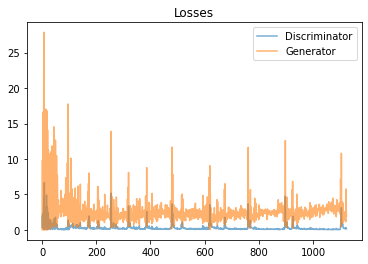

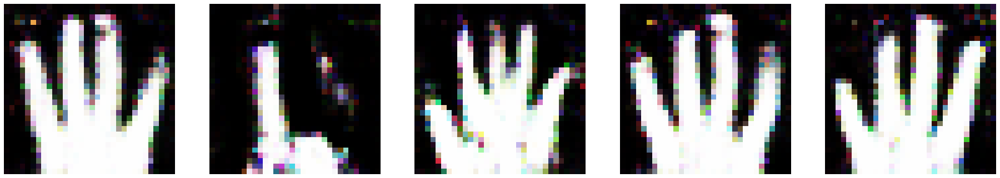

Epoch 76/80 
Duration: 3.03609 
D Loss: 0.13365 
G Loss: 2.57081


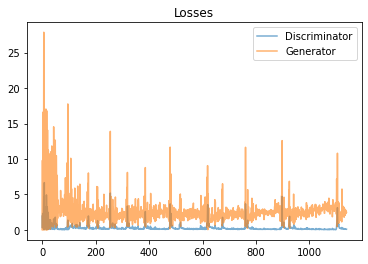

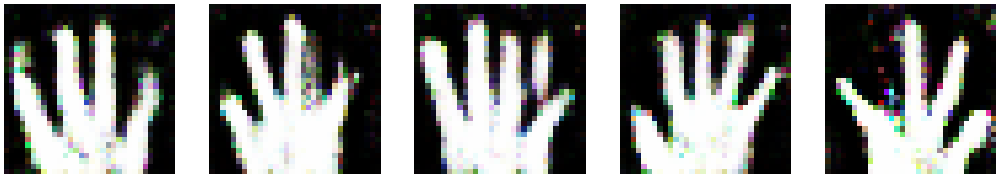

Epoch 77/80 
Duration: 3.02627 
D Loss: 0.18329 
G Loss: 2.70287


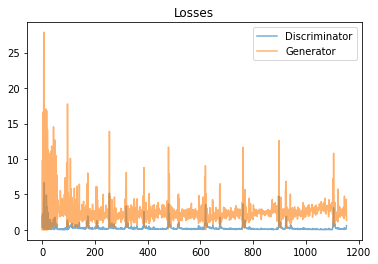

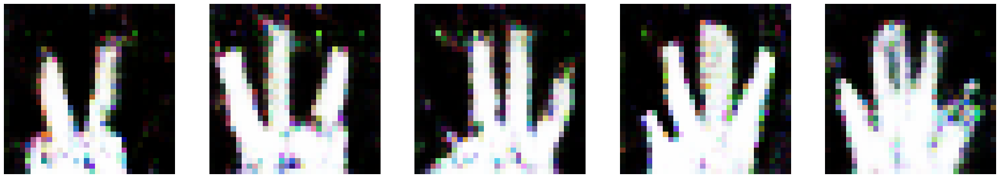

Epoch 78/80 
Duration: 3.03934 
D Loss: 0.65687 
G Loss: 2.51113


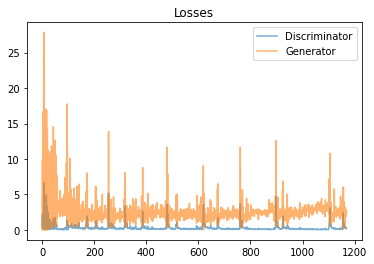

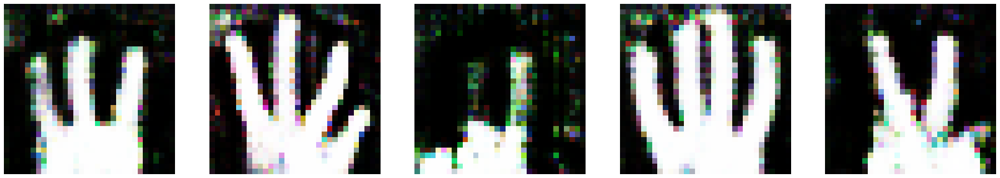

Epoch 79/80 
Duration: 3.04213 
D Loss: 0.38504 
G Loss: 2.67337


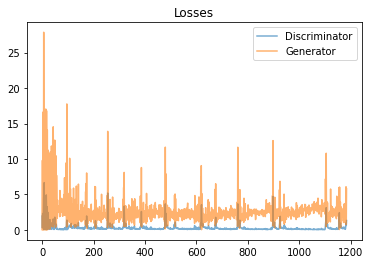

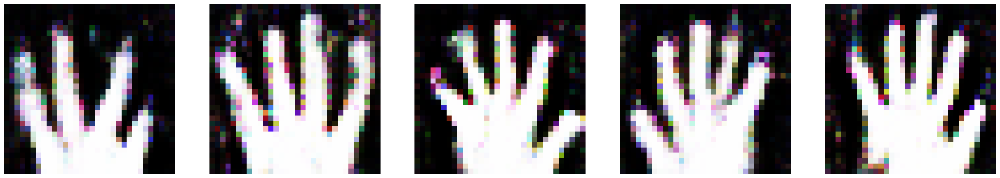

Epoch 80/80 
Duration: 3.04073 
D Loss: 0.41474 
G Loss: 1.79893


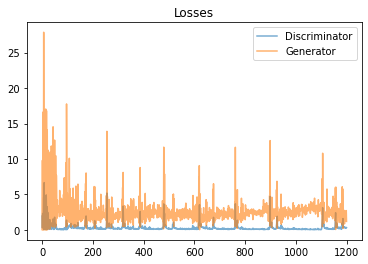

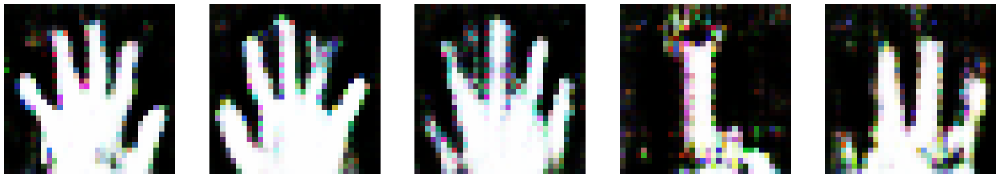

<ipython-input-26-603456c01da7>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(10)):


  0%|          | 0/10 [00:00<?, ?it/s]

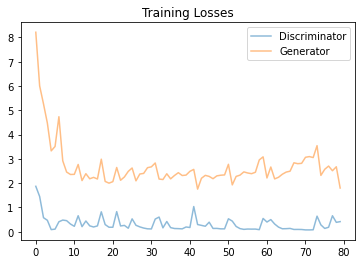

>> train time =  307.00337839126587


In [32]:
start = time.time()

print(">> Start training...")
with tf.Graph().as_default():
    train(get_batches(imagesIn), imagesIn.shape)
    
print(">> train time = ",time.time() - start)

In [33]:
!zip -r /content/images.zip /content/images

from google.colab import files
files.download('/content/images.zip')

  adding: content/images/ (stored 0%)
  adding: content/images/image8.png (stored 0%)
  adding: content/images/image4.png (stored 0%)
  adding: content/images/image0.png (stored 0%)
  adding: content/images/image5.png (stored 0%)
  adding: content/images/image3.png (stored 0%)
  adding: content/images/image1.png (stored 0%)
  adding: content/images/image7.png (stored 0%)
  adding: content/images/image2.png (stored 0%)
  adding: content/images/image9.png (stored 0%)
  adding: content/images/image6.png (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# One side label smoothing

In [34]:
IMG_DIR = "images_One_side_label_smoothing"

In [35]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)

    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)*random.uniform(0.9, 1.0)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                    labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

>> Start training...


<ipython-input-17-b7478f90392c>:4: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  fully_connected = tf.layers.dense(z, 4*4*512)
<ipython-input-17-b7478f90392c>:8: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
<ipython-input-17-b7478f90392c>:15: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
<ipython-input-17-b7478f90392c>:22: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a

  0%|          | 0/80 [00:00<?, ?it/s]

Epoch 1/80 
Duration: 3.48421 
D Loss: 1.99875 
G Loss: 8.98264


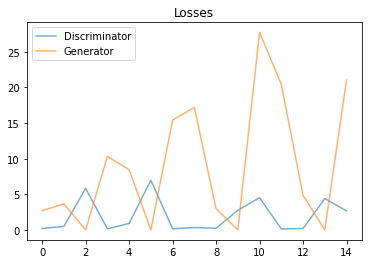

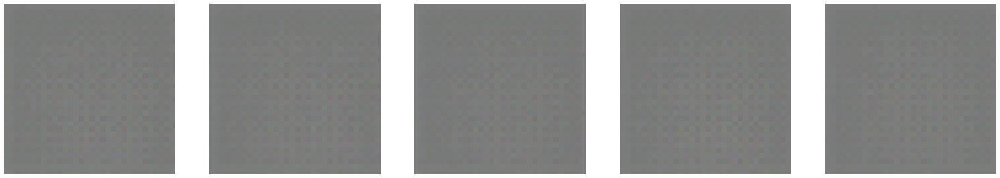

Epoch 2/80 
Duration: 3.02147 
D Loss: 1.32908 
G Loss: 7.37257


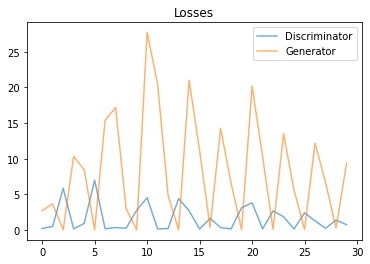

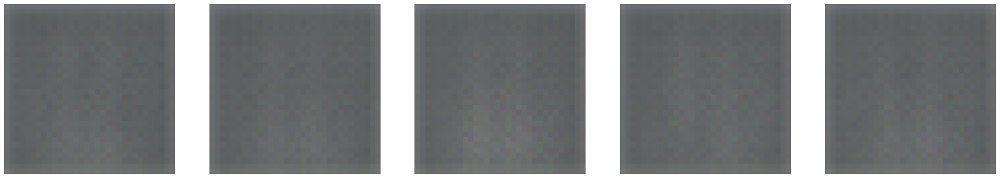

Epoch 3/80 
Duration: 3.03922 
D Loss: 0.79056 
G Loss: 4.61438


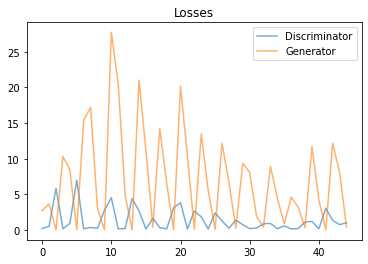

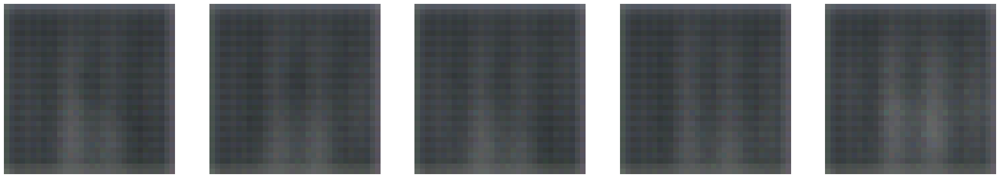

Epoch 4/80 
Duration: 3.04751 
D Loss: 0.45966 
G Loss: 3.78409


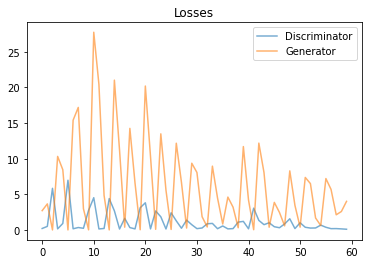

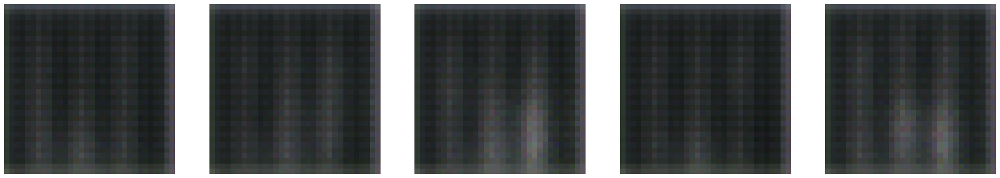

Epoch 5/80 
Duration: 3.05881 
D Loss: 0.24079 
G Loss: 3.82089


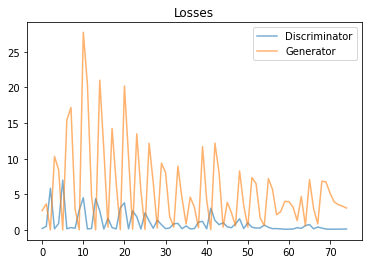

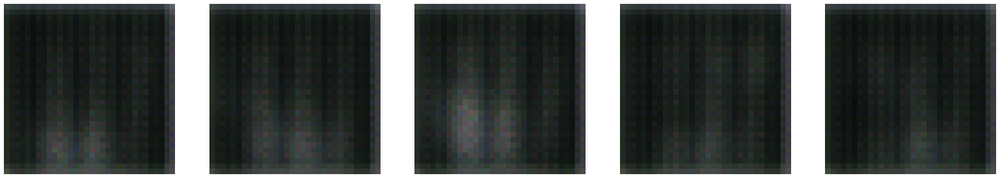

Epoch 6/80 
Duration: 3.05814 
D Loss: 0.13501 
G Loss: 3.54842


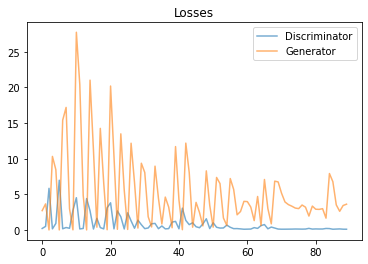

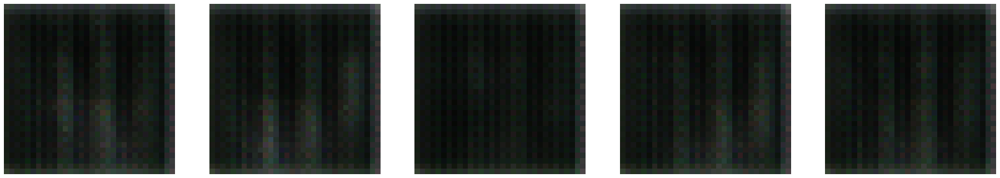

Epoch 7/80 
Duration: 3.07246 
D Loss: 0.25410 
G Loss: 2.96296


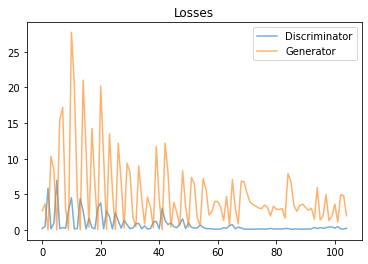

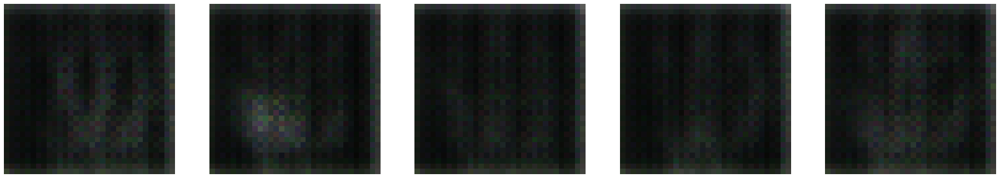

Epoch 8/80 
Duration: 3.07692 
D Loss: 0.34626 
G Loss: 3.30273


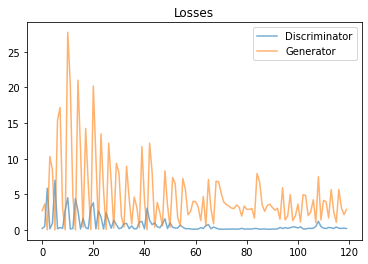

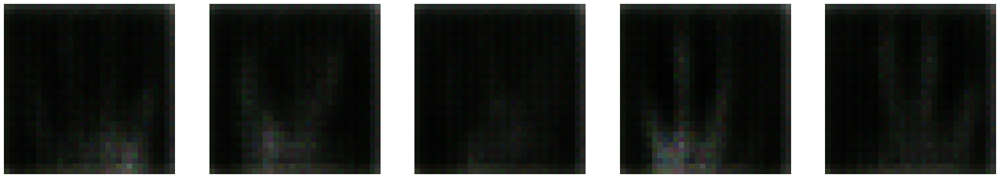

Epoch 9/80 
Duration: 3.06069 
D Loss: 0.62188 
G Loss: 2.54476


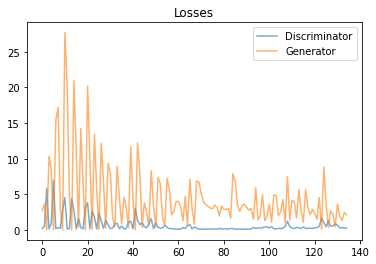

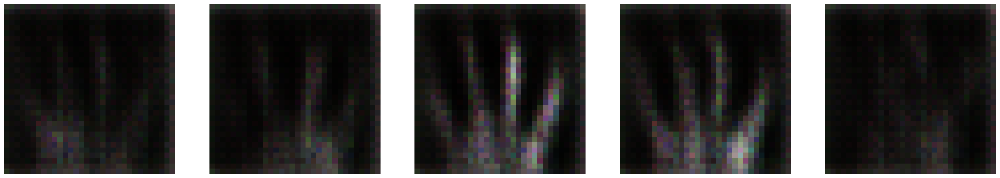

Epoch 10/80 
Duration: 3.04724 
D Loss: 0.47310 
G Loss: 1.81385


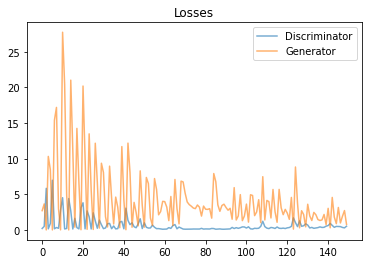

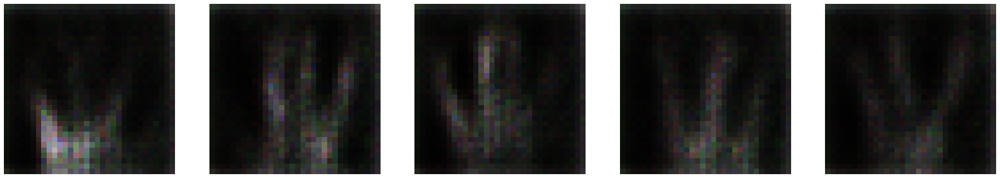

Epoch 11/80 
Duration: 3.04390 
D Loss: 0.38285 
G Loss: 2.03920


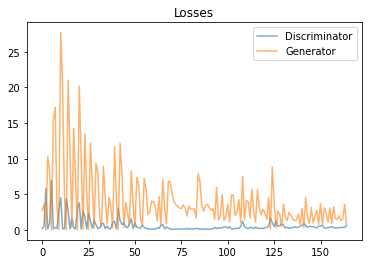

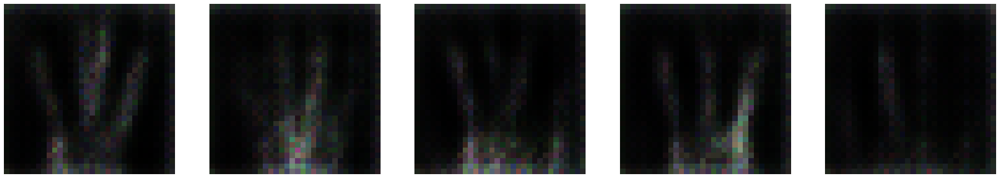

Epoch 12/80 
Duration: 3.04482 
D Loss: 0.44670 
G Loss: 2.20787


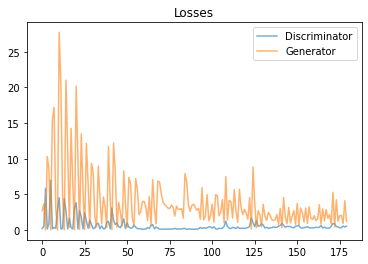

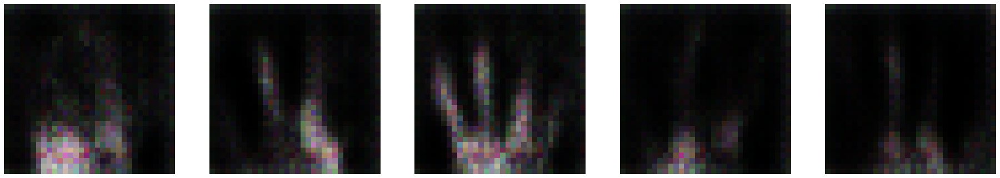

Epoch 13/80 
Duration: 3.03106 
D Loss: 0.42508 
G Loss: 2.24687


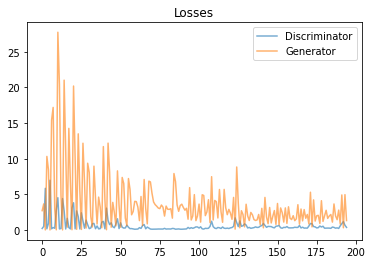

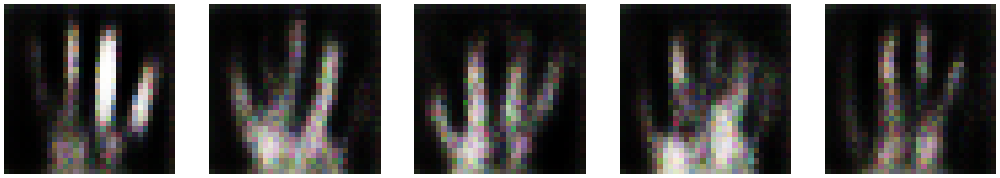

Epoch 14/80 
Duration: 3.03428 
D Loss: 0.29540 
G Loss: 2.10864


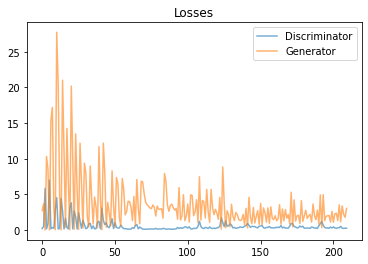

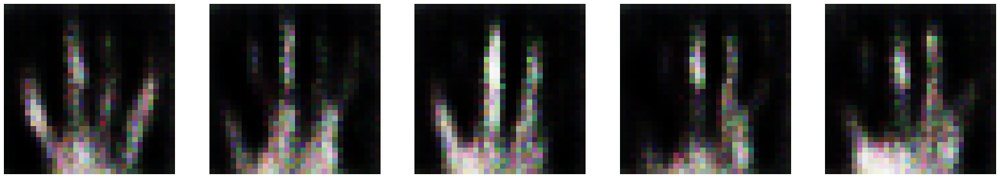

Epoch 15/80 
Duration: 3.02535 
D Loss: 0.32955 
G Loss: 2.29698


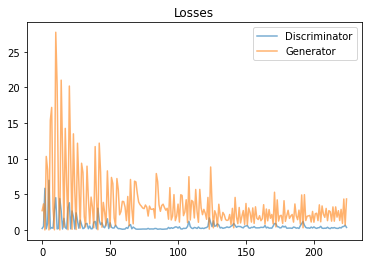

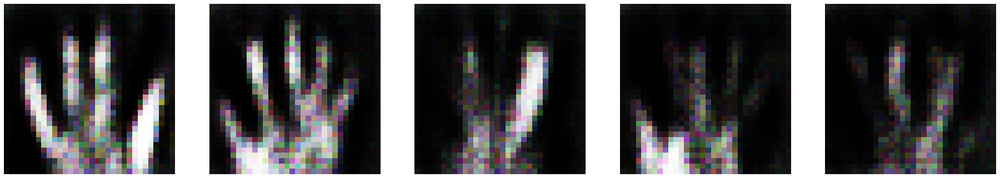

Epoch 16/80 
Duration: 3.02622 
D Loss: 0.34984 
G Loss: 2.04521


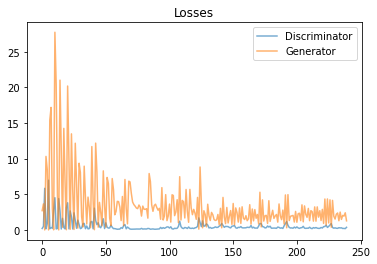

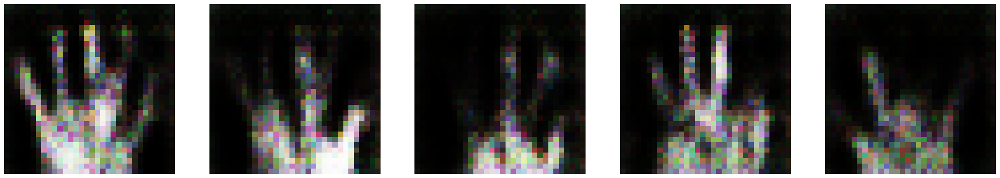

Epoch 17/80 
Duration: 3.02442 
D Loss: 0.24735 
G Loss: 2.38059


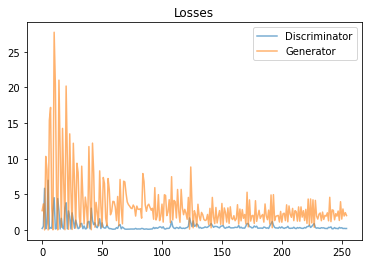

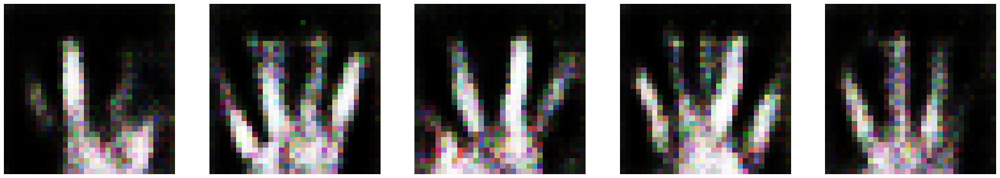

Epoch 18/80 
Duration: 3.02396 
D Loss: 0.61627 
G Loss: 2.49289


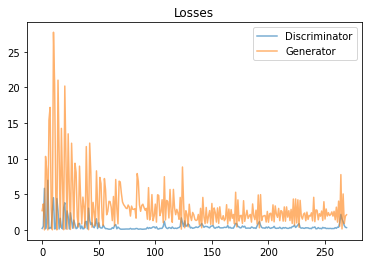

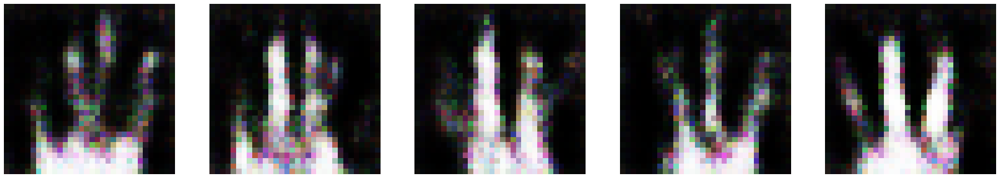

Epoch 19/80 
Duration: 3.01339 
D Loss: 0.26734 
G Loss: 1.89247


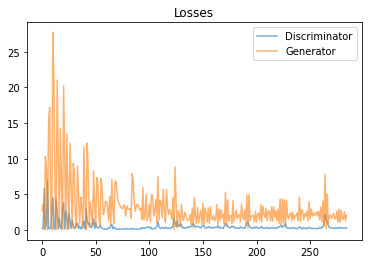

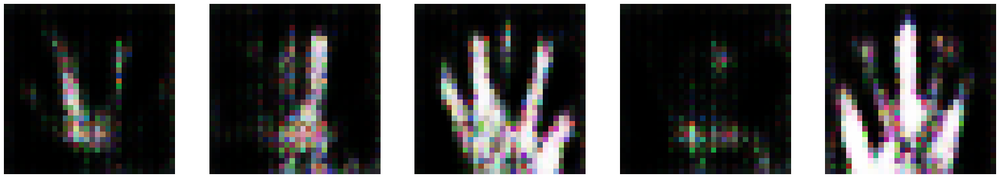

Epoch 20/80 
Duration: 3.02541 
D Loss: 0.42974 
G Loss: 2.14493


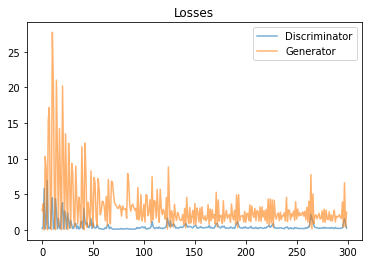

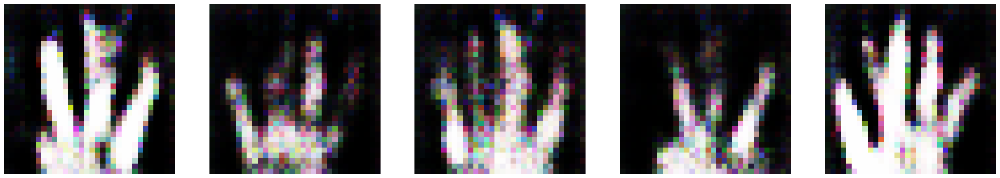

Epoch 21/80 
Duration: 3.02326 
D Loss: 0.29336 
G Loss: 1.94837


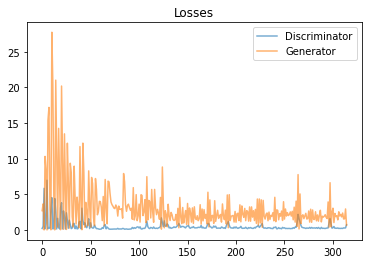

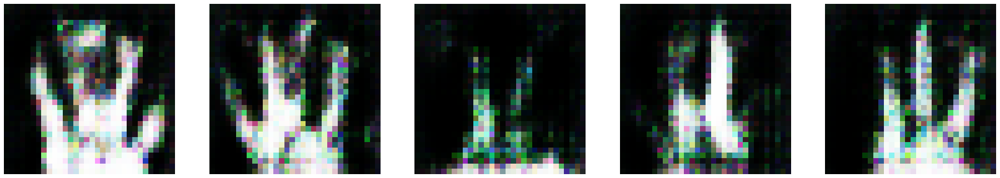

Epoch 22/80 
Duration: 3.03200 
D Loss: 0.29687 
G Loss: 2.29658


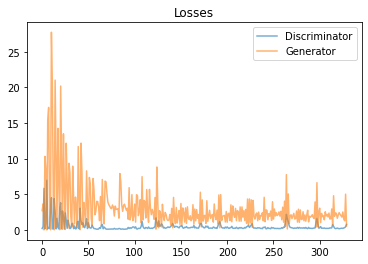

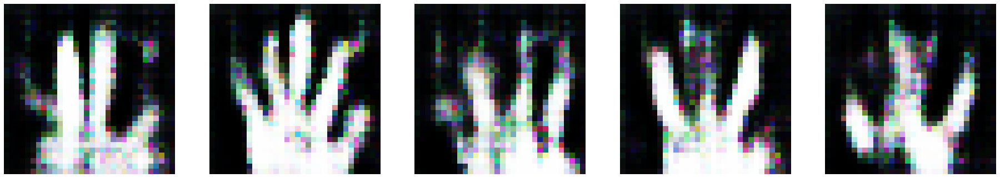

Epoch 23/80 
Duration: 3.04081 
D Loss: 0.23322 
G Loss: 2.23146


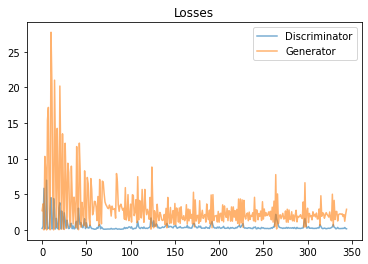

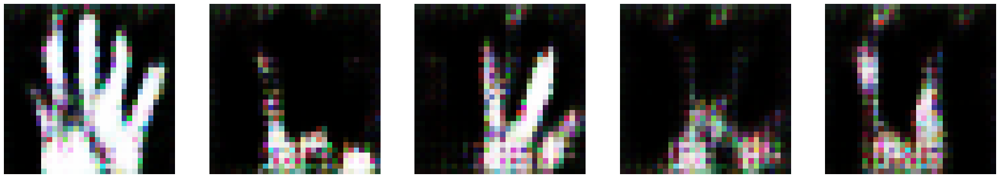

Epoch 24/80 
Duration: 3.04597 
D Loss: 0.54748 
G Loss: 2.13587


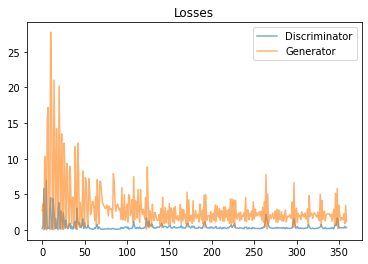

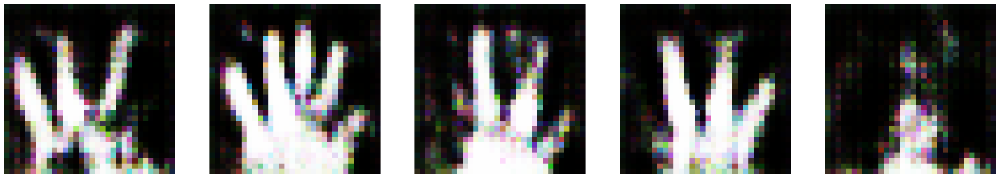

Epoch 25/80 
Duration: 3.04340 
D Loss: 0.28478 
G Loss: 2.11824


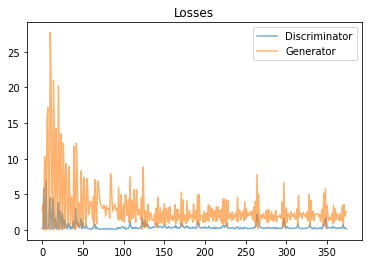

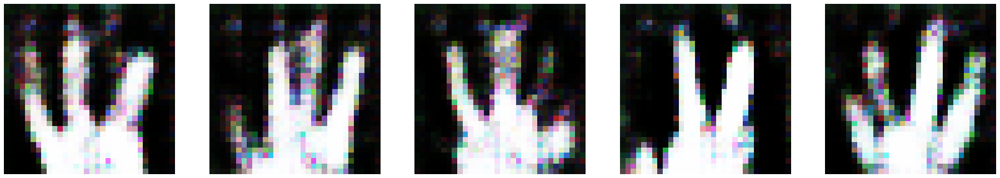

Epoch 26/80 
Duration: 3.03599 
D Loss: 0.20885 
G Loss: 2.11515


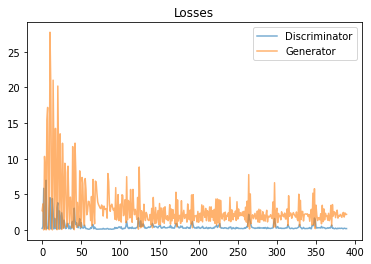

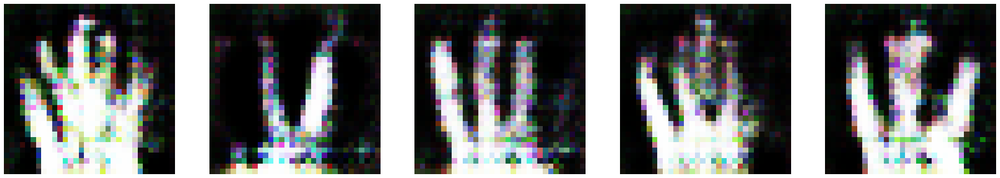

Epoch 27/80 
Duration: 3.03698 
D Loss: 0.79273 
G Loss: 3.02920


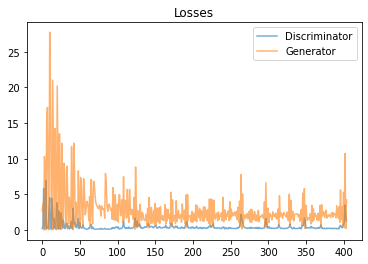

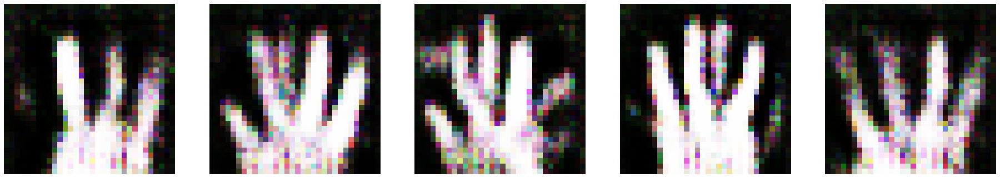

Epoch 28/80 
Duration: 3.05347 
D Loss: 0.32049 
G Loss: 1.71365


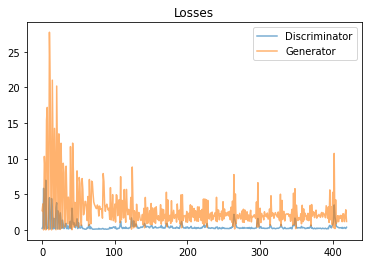

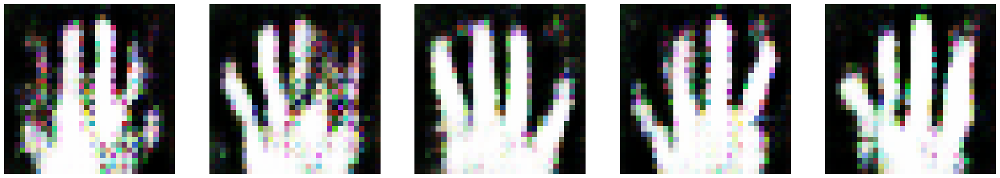

Epoch 29/80 
Duration: 3.05028 
D Loss: 0.23367 
G Loss: 2.08198


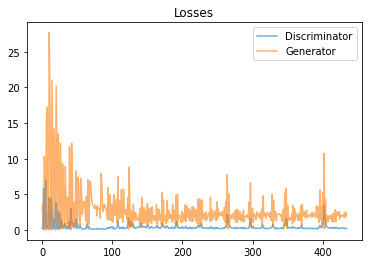

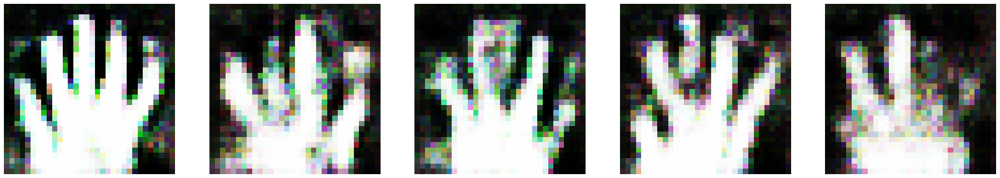

Epoch 30/80 
Duration: 3.04768 
D Loss: 0.19587 
G Loss: 2.20824


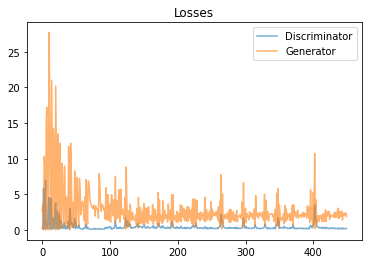

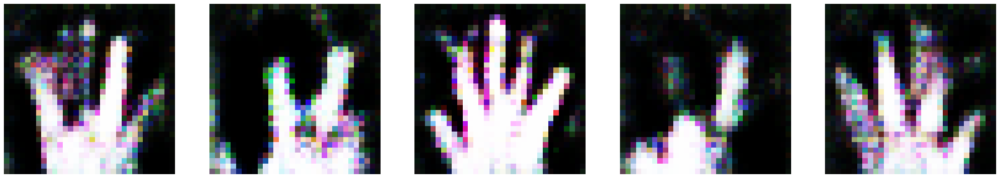

Epoch 31/80 
Duration: 3.03381 
D Loss: 0.23267 
G Loss: 2.36188


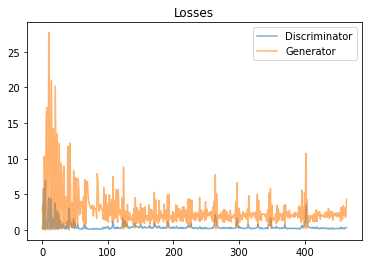

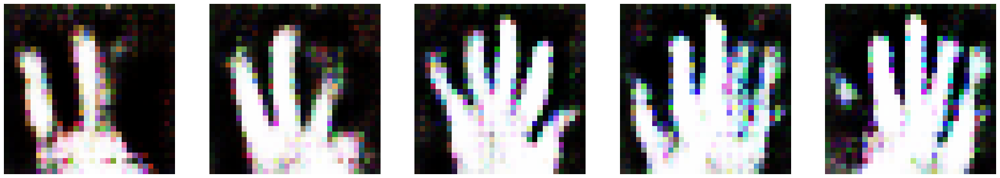

Epoch 32/80 
Duration: 3.03903 
D Loss: 0.62405 
G Loss: 2.08606


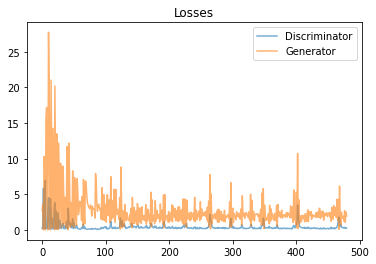

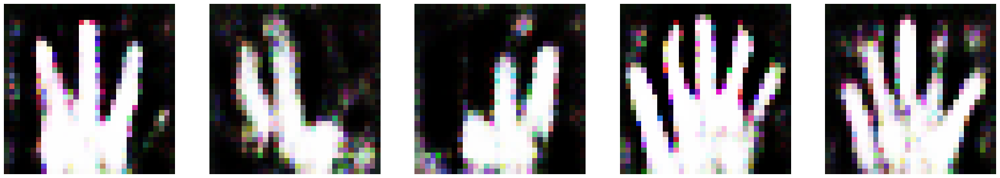

Epoch 33/80 
Duration: 3.03464 
D Loss: 0.26317 
G Loss: 2.16397


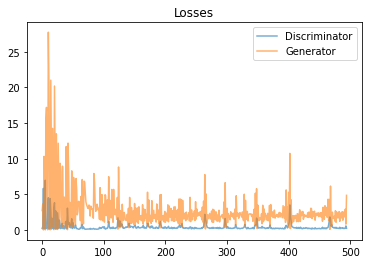

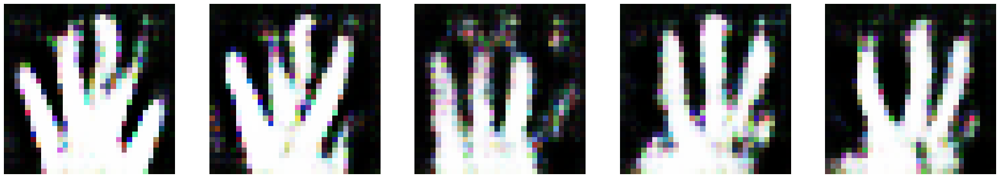

Epoch 34/80 
Duration: 3.04158 
D Loss: 0.20559 
G Loss: 2.18756


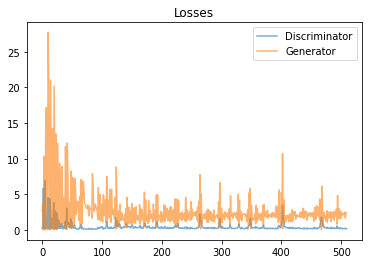

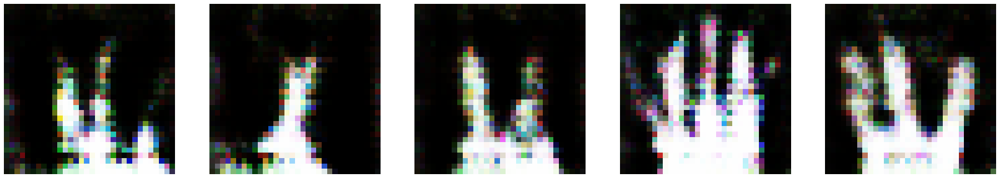

Epoch 35/80 
Duration: 3.04168 
D Loss: 0.19618 
G Loss: 2.31262


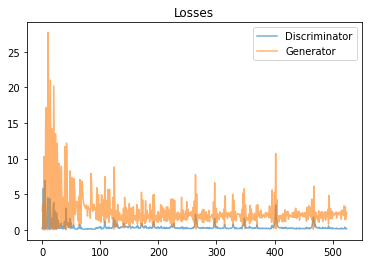

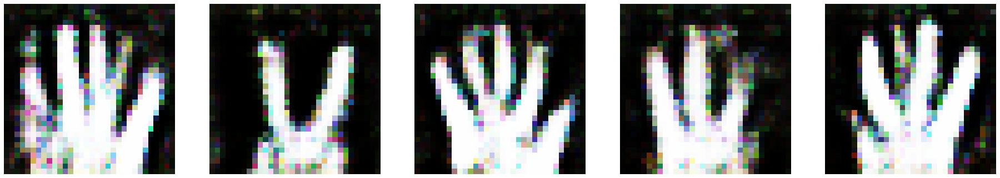

Epoch 36/80 
Duration: 3.03880 
D Loss: 0.16588 
G Loss: 2.45160


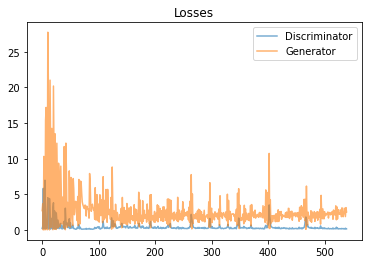

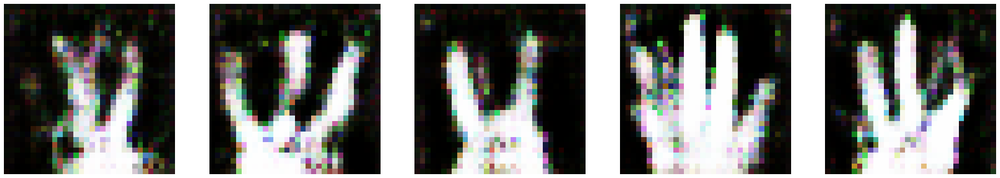

Epoch 37/80 
Duration: 3.03360 
D Loss: 0.18681 
G Loss: 2.36730


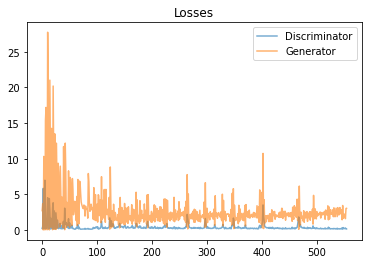

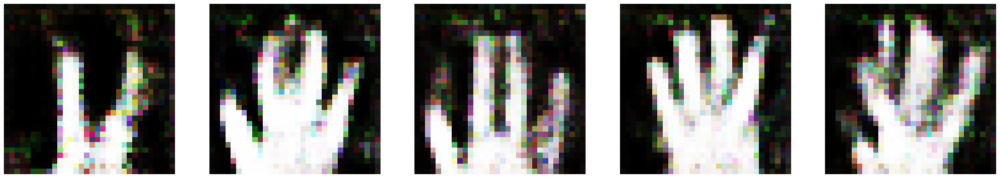

Epoch 38/80 
Duration: 3.04265 
D Loss: 0.89573 
G Loss: 2.46705


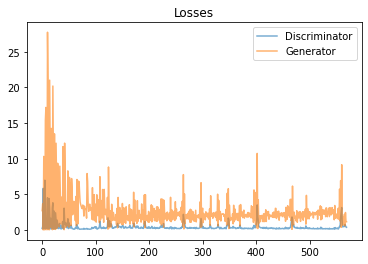

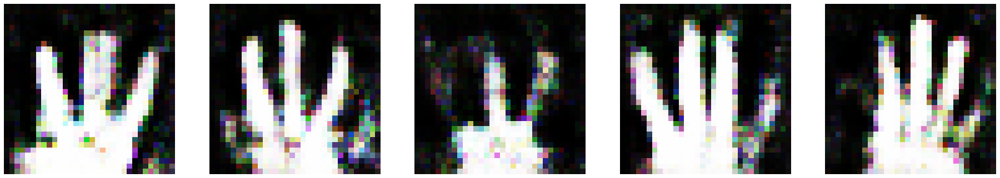

Epoch 39/80 
Duration: 3.04036 
D Loss: 0.40357 
G Loss: 1.89072


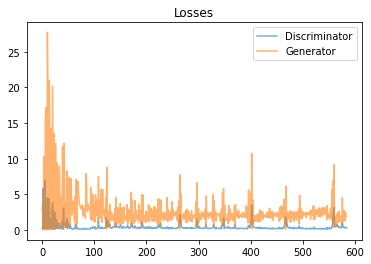

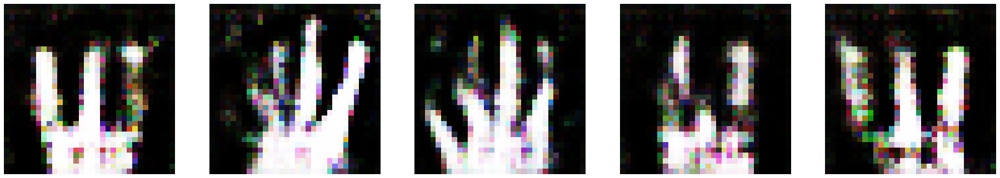

Epoch 40/80 
Duration: 3.03026 
D Loss: 0.31073 
G Loss: 1.95695


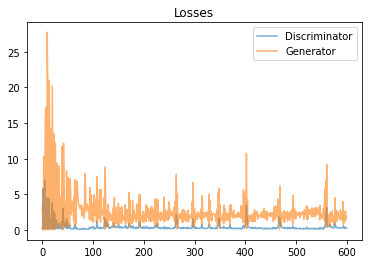

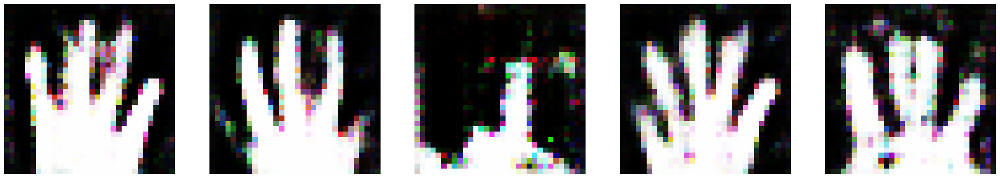

Epoch 41/80 
Duration: 3.03824 
D Loss: 0.26776 
G Loss: 2.19322


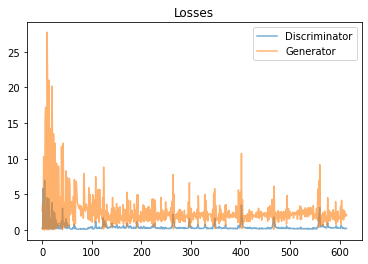

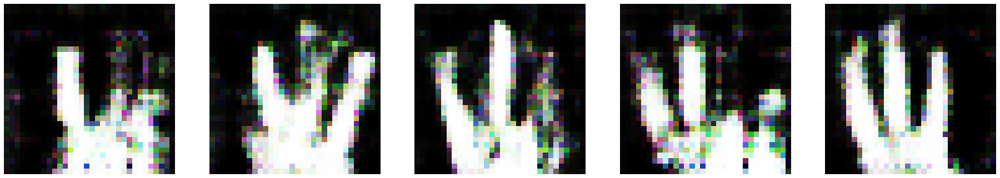

Epoch 42/80 
Duration: 3.04482 
D Loss: 0.17364 
G Loss: 2.32301


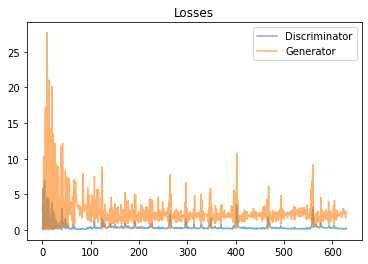

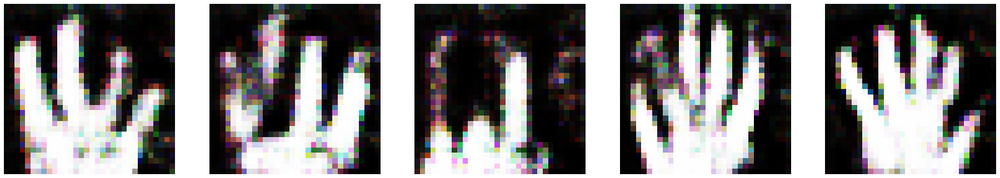

Epoch 43/80 
Duration: 3.03620 
D Loss: 0.31931 
G Loss: 2.54171


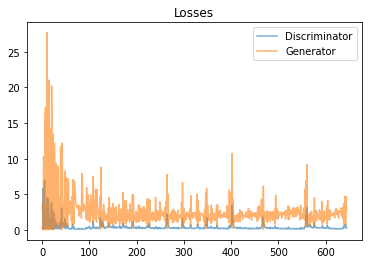

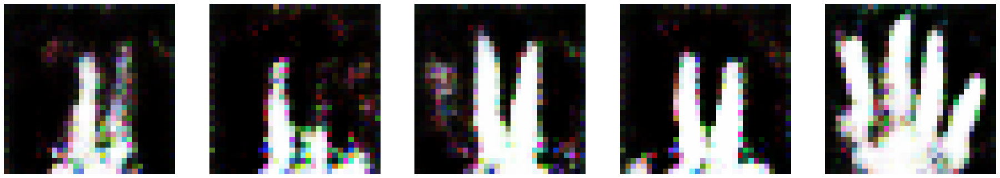

Epoch 44/80 
Duration: 3.03401 
D Loss: 0.18931 
G Loss: 2.22997


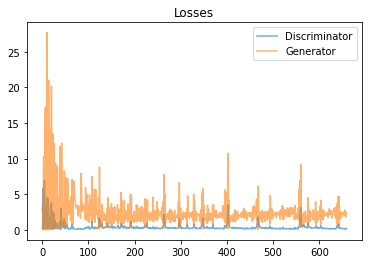

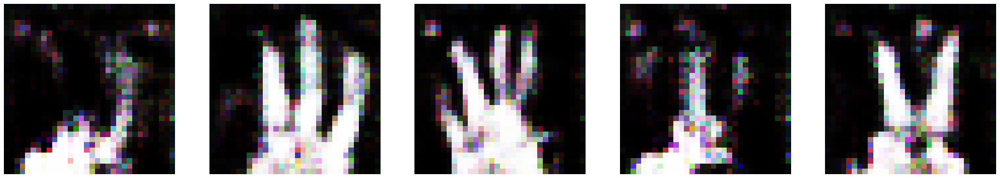

Epoch 45/80 
Duration: 3.03716 
D Loss: 0.15334 
G Loss: 2.58506


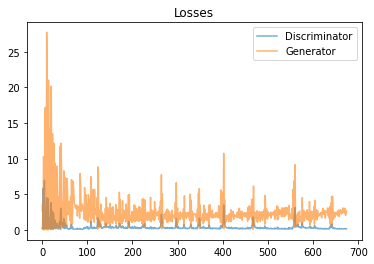

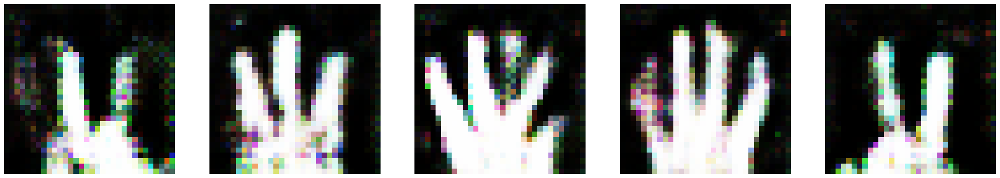

Epoch 46/80 
Duration: 3.03193 
D Loss: 0.15614 
G Loss: 2.55466


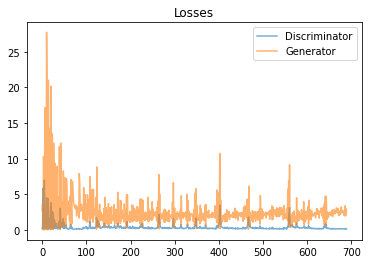

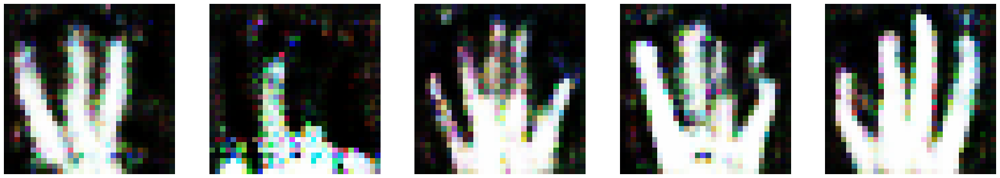

Epoch 47/80 
Duration: 3.03002 
D Loss: 0.15567 
G Loss: 2.58303


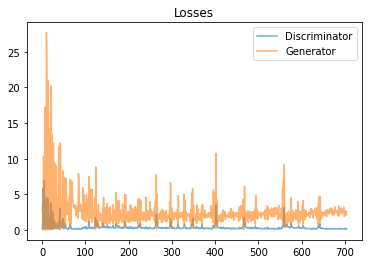

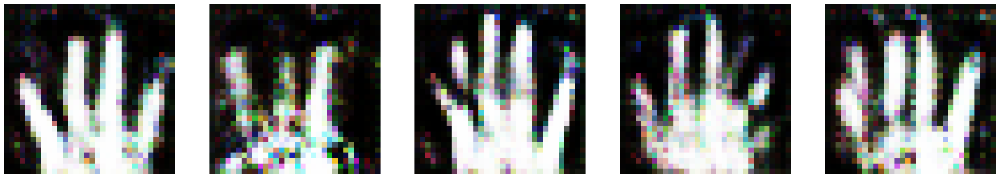

Epoch 48/80 
Duration: 3.05168 
D Loss: 0.16989 
G Loss: 2.61995


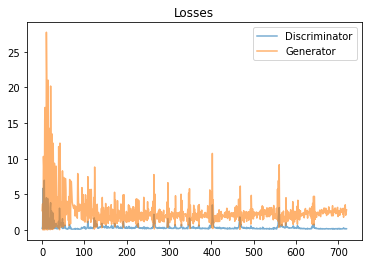

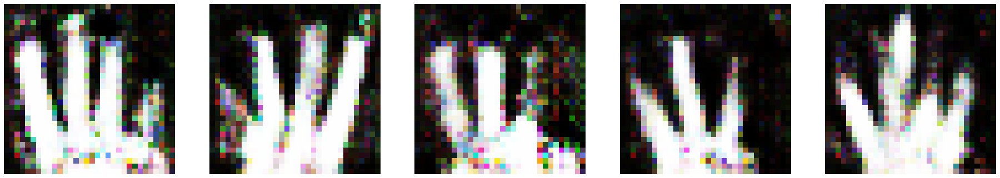

Epoch 49/80 
Duration: 3.02710 
D Loss: 0.16606 
G Loss: 2.63486


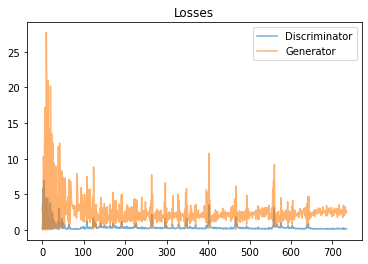

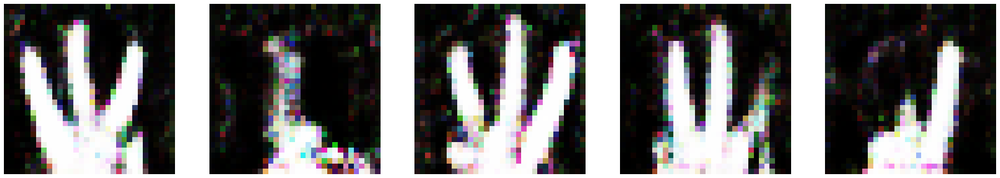

Epoch 50/80 
Duration: 3.04673 
D Loss: 0.14774 
G Loss: 2.67916


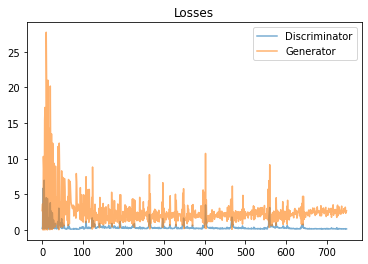

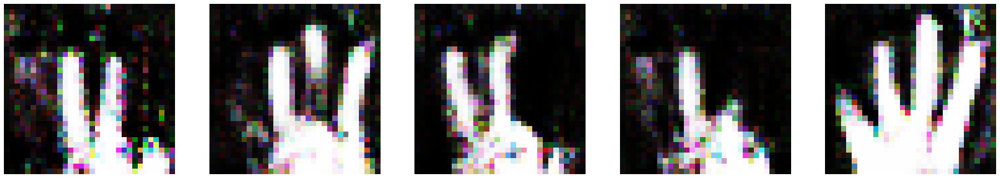

Epoch 51/80 
Duration: 3.03510 
D Loss: 1.00635 
G Loss: 2.87210


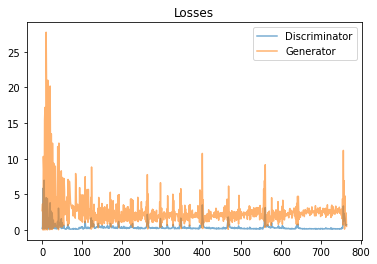

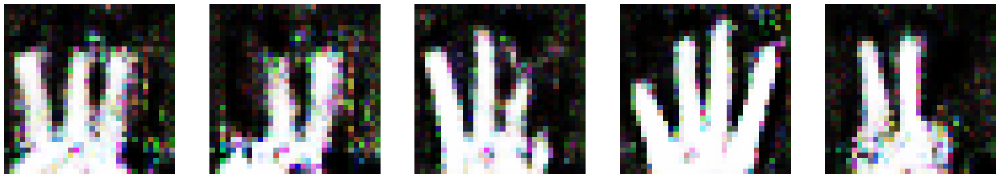

Epoch 52/80 
Duration: 3.03590 
D Loss: 0.48967 
G Loss: 1.61536


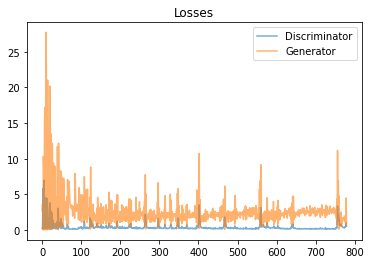

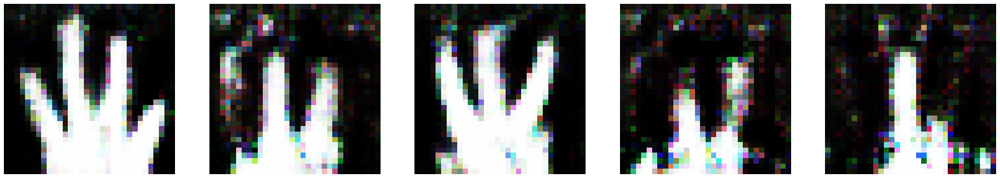

Epoch 53/80 
Duration: 3.02807 
D Loss: 0.35339 
G Loss: 1.83223


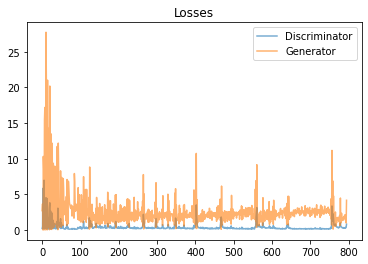

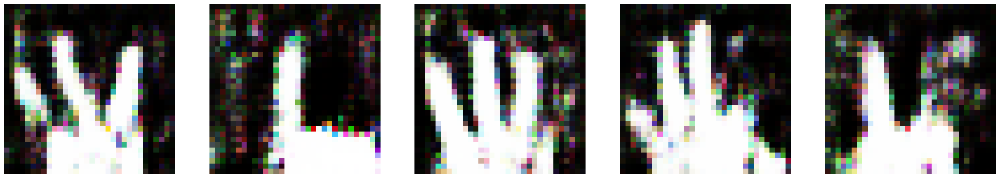

Epoch 54/80 
Duration: 3.03364 
D Loss: 0.35652 
G Loss: 1.80274


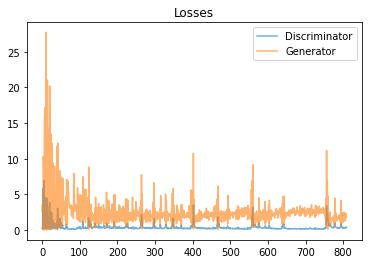

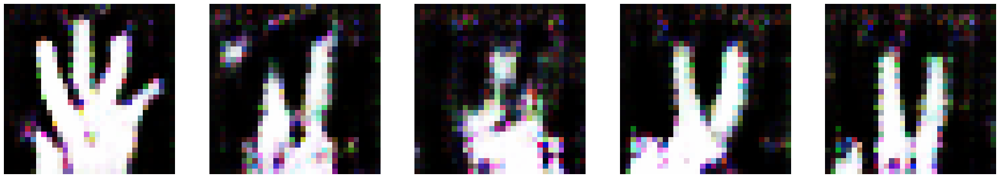

Epoch 55/80 
Duration: 3.03791 
D Loss: 0.33160 
G Loss: 2.23488


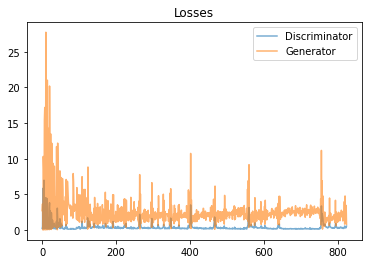

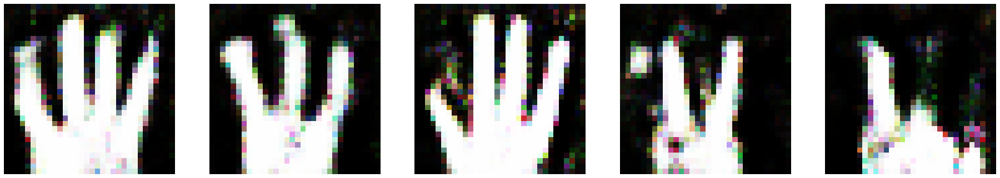

Epoch 56/80 
Duration: 3.03450 
D Loss: 0.42208 
G Loss: 2.28030


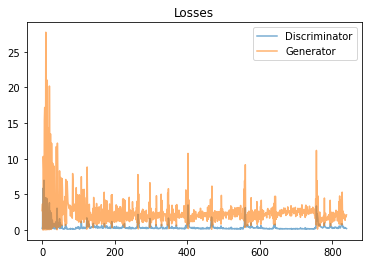

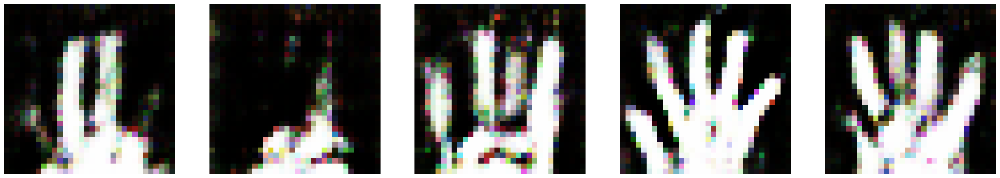

Epoch 57/80 
Duration: 3.03036 
D Loss: 0.18646 
G Loss: 2.18814


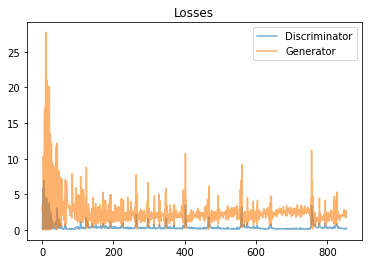

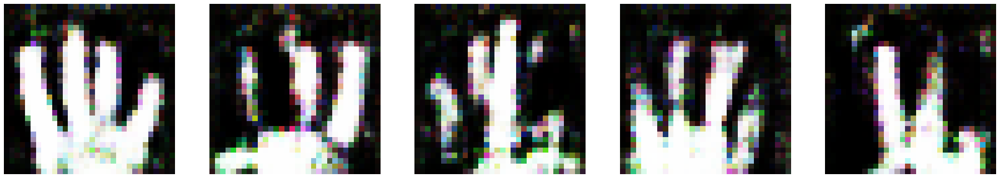

Epoch 58/80 
Duration: 3.03834 
D Loss: 0.17238 
G Loss: 2.25877


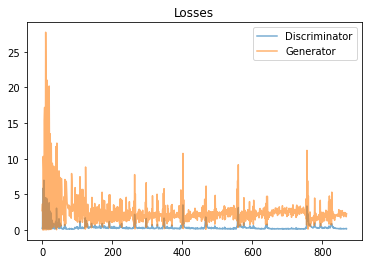

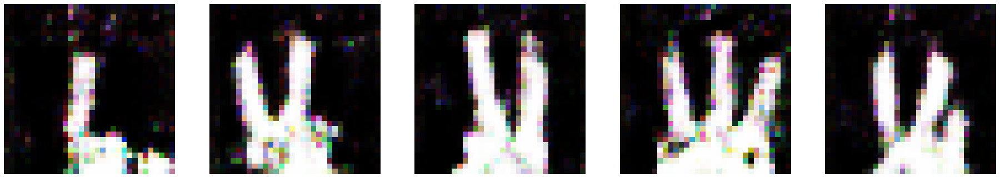

Epoch 59/80 
Duration: 3.03855 
D Loss: 0.49124 
G Loss: 2.43359


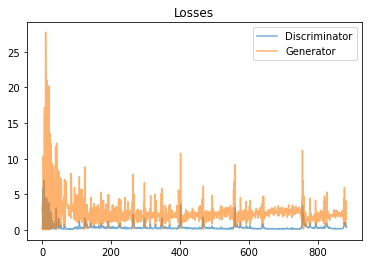

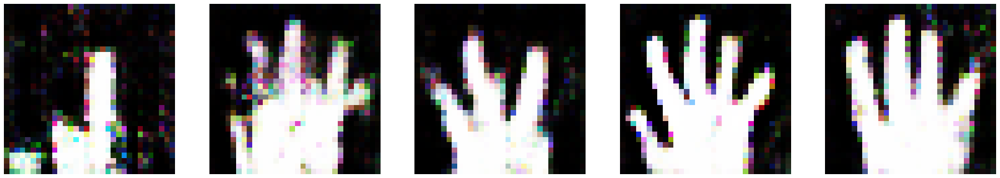

Epoch 60/80 
Duration: 3.03938 
D Loss: 0.22847 
G Loss: 2.19580


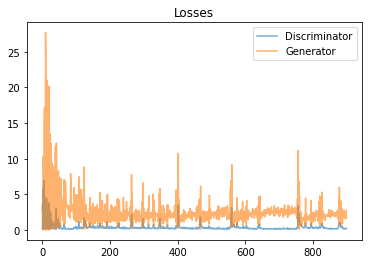

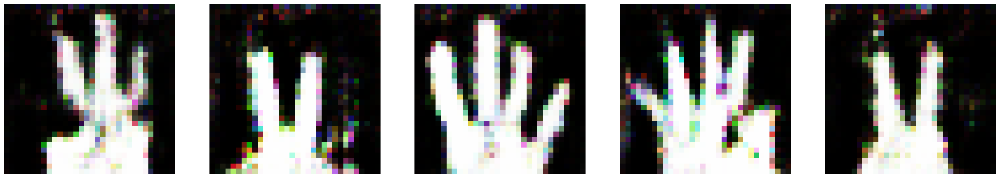

Epoch 61/80 
Duration: 3.04364 
D Loss: 0.22479 
G Loss: 2.34519


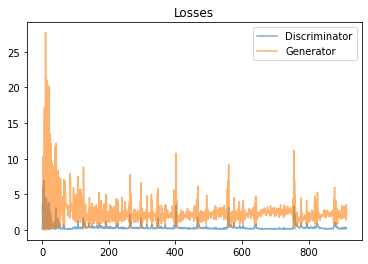

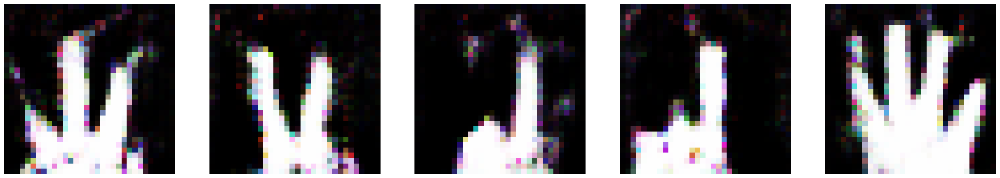

Epoch 62/80 
Duration: 3.03948 
D Loss: 0.15910 
G Loss: 2.53137


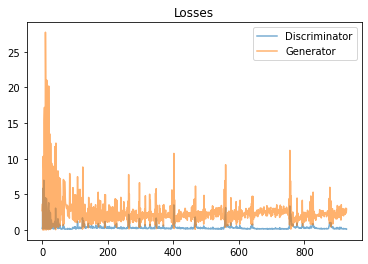

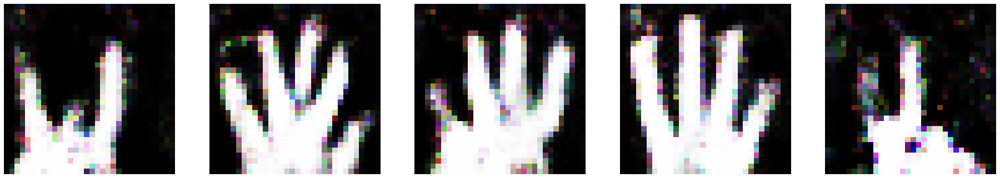

Epoch 63/80 
Duration: 3.04077 
D Loss: 0.13753 
G Loss: 2.71990


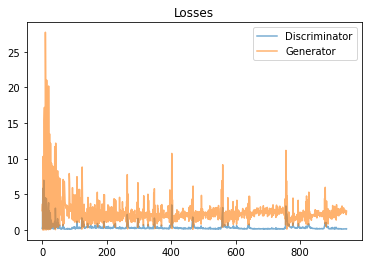

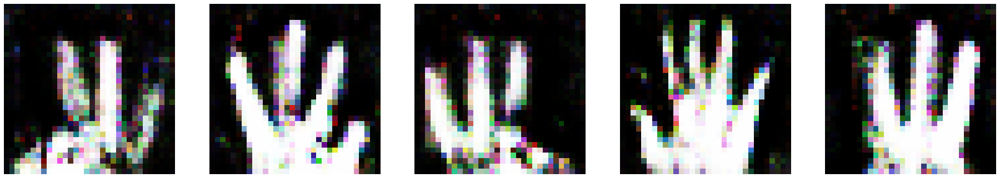

Epoch 64/80 
Duration: 3.04916 
D Loss: 0.13727 
G Loss: 2.71531


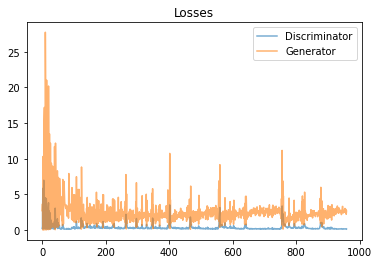

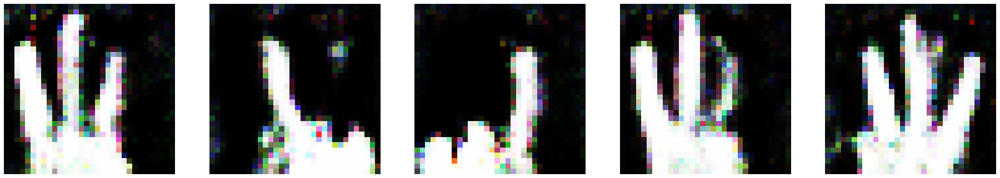

Epoch 65/80 
Duration: 3.03701 
D Loss: 0.13933 
G Loss: 2.78490


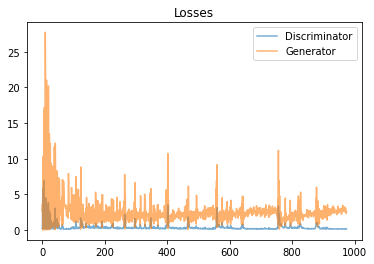

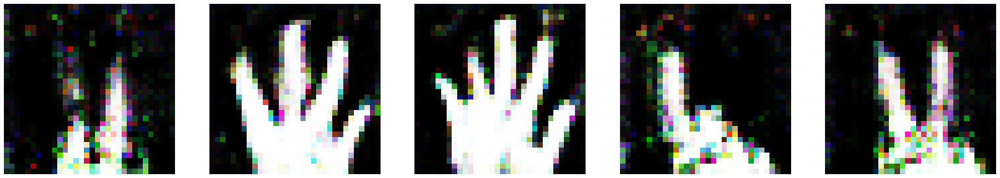

Epoch 66/80 
Duration: 3.03724 
D Loss: 0.67971 
G Loss: 2.82237


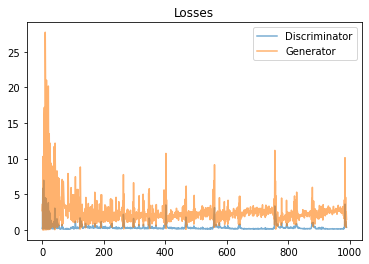

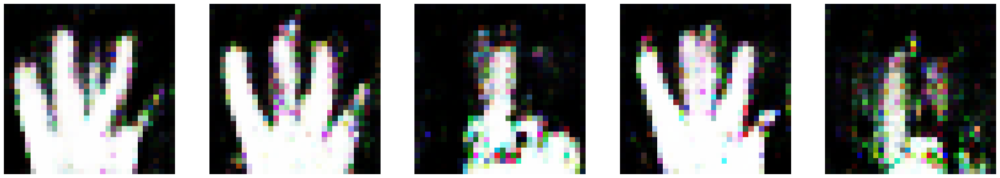

Epoch 67/80 
Duration: 3.03744 
D Loss: 0.36005 
G Loss: 2.12240


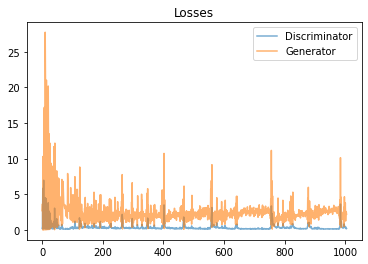

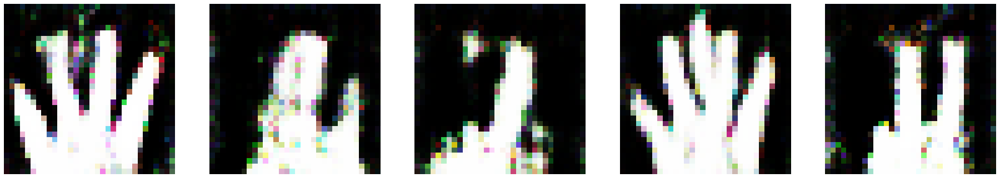

Epoch 68/80 
Duration: 3.03261 
D Loss: 0.29650 
G Loss: 2.41611


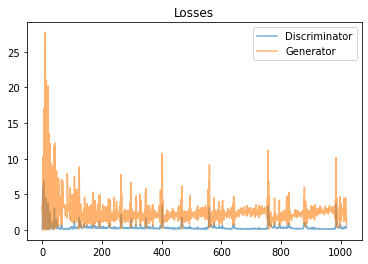

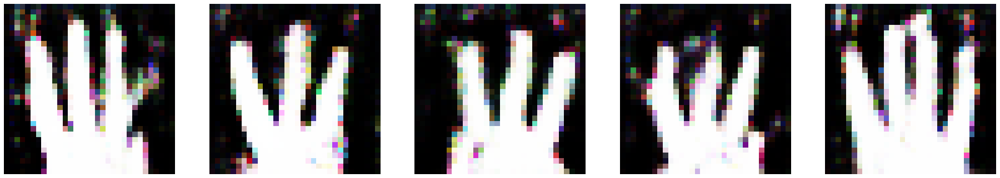

Epoch 69/80 
Duration: 3.04428 
D Loss: 0.32469 
G Loss: 2.43780


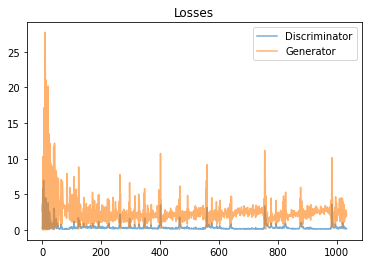

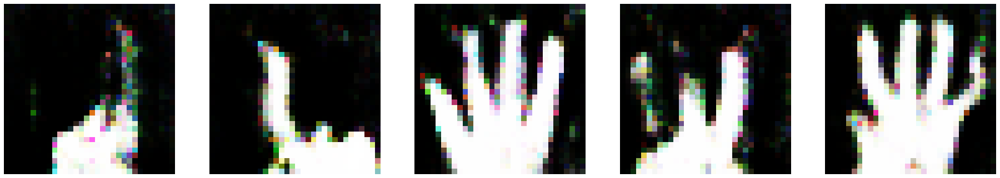

Epoch 70/80 
Duration: 3.05710 
D Loss: 0.17298 
G Loss: 2.36051


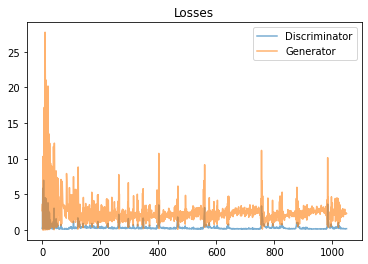

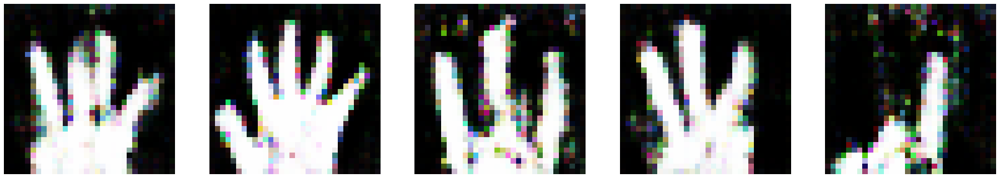

Epoch 71/80 
Duration: 3.05574 
D Loss: 0.14688 
G Loss: 2.57810


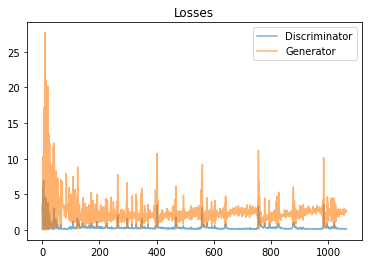

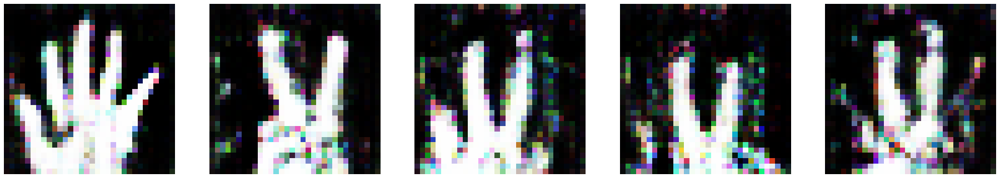

Epoch 72/80 
Duration: 3.04911 
D Loss: 0.13586 
G Loss: 2.78738


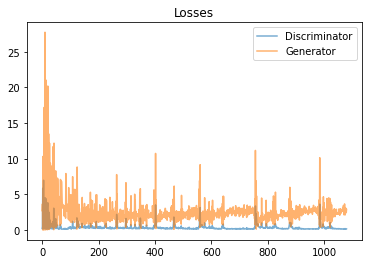

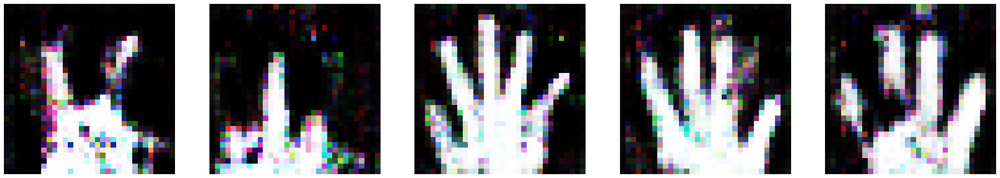

Epoch 73/80 
Duration: 3.05904 
D Loss: 0.14469 
G Loss: 2.71004


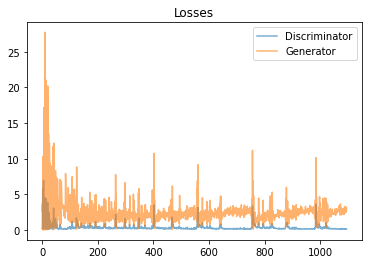

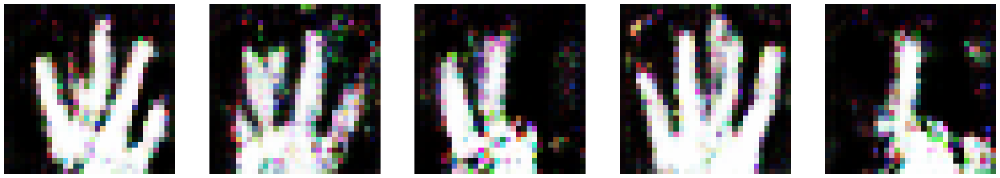

Epoch 74/80 
Duration: 3.05322 
D Loss: 0.11719 
G Loss: 3.19373


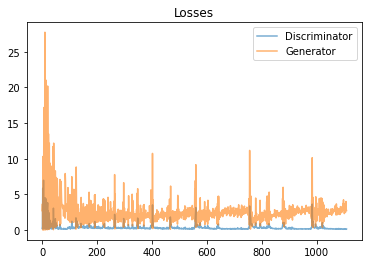

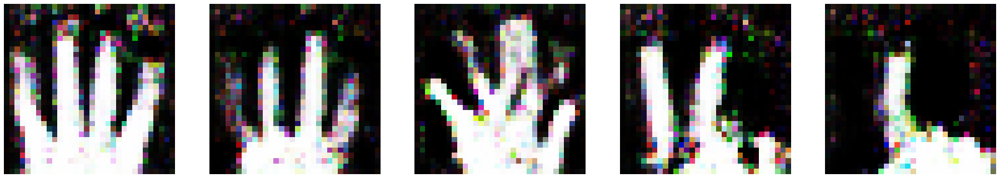

Epoch 75/80 
Duration: 3.04017 
D Loss: 0.13465 
G Loss: 2.93543


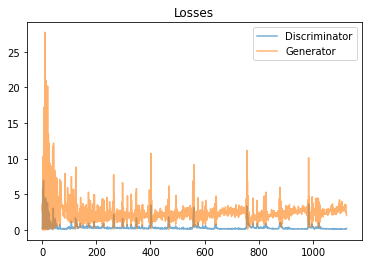

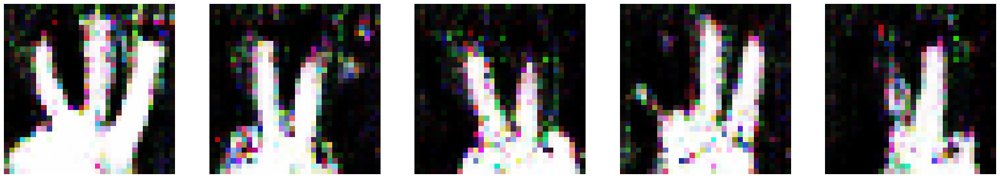

Epoch 76/80 
Duration: 3.03329 
D Loss: 0.14640 
G Loss: 2.97552


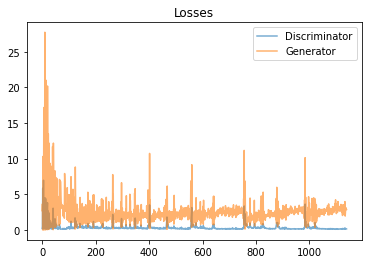

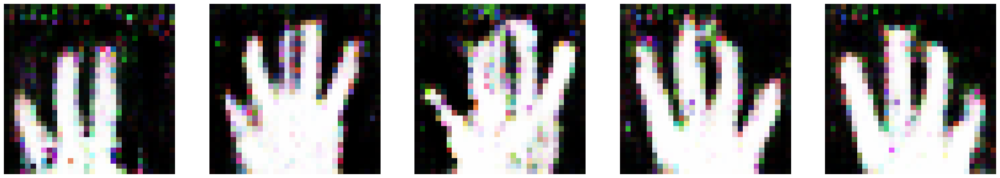

Epoch 77/80 
Duration: 3.04669 
D Loss: 0.14754 
G Loss: 2.96326


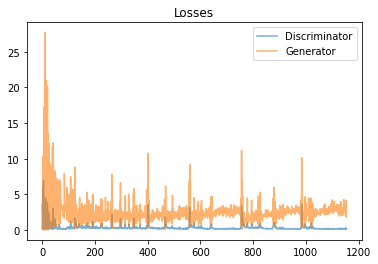

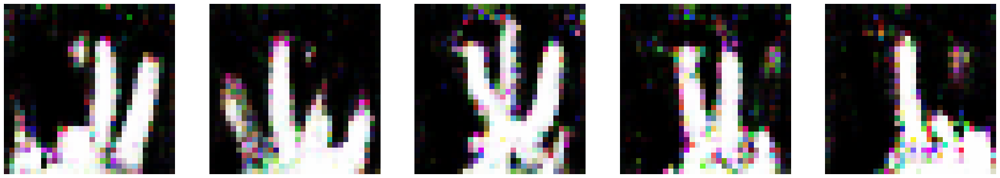

Epoch 78/80 
Duration: 3.03792 
D Loss: 0.14041 
G Loss: 3.25370


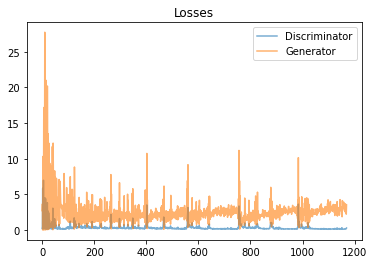

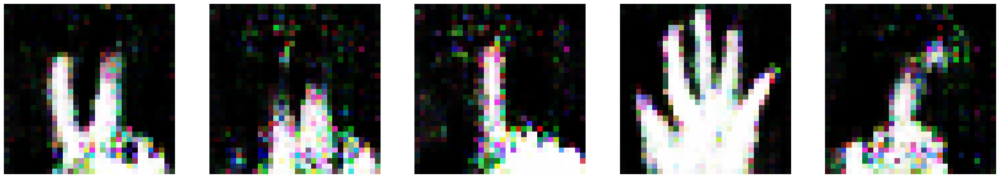

Epoch 79/80 
Duration: 3.03590 
D Loss: 1.04642 
G Loss: 2.54109


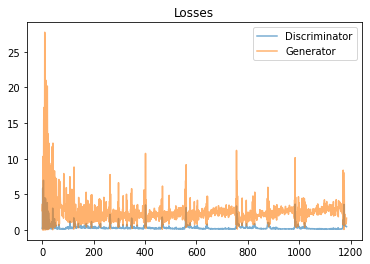

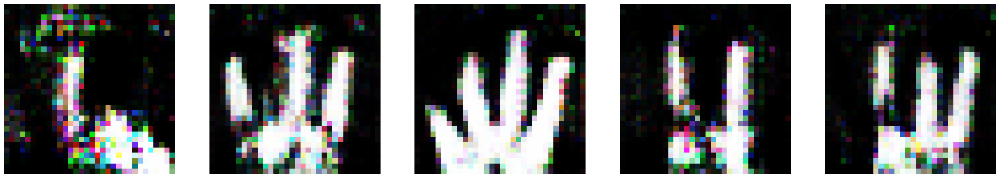

Epoch 80/80 
Duration: 3.04639 
D Loss: 0.38731 
G Loss: 1.70532


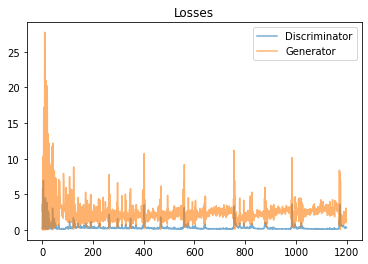

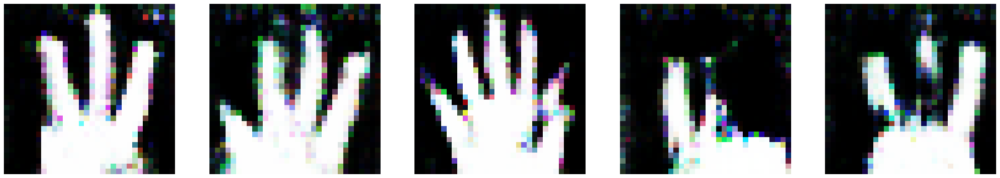

<ipython-input-26-603456c01da7>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(10)):


  0%|          | 0/10 [00:00<?, ?it/s]

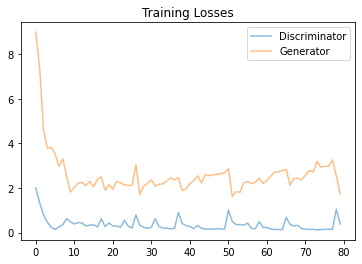

>> train time =  296.27837443351746


In [36]:
start = time.time()

print(">> Start training...")
with tf.Graph().as_default():
    train(get_batches(imagesIn), imagesIn.shape)
    
print(">> train time = ",time.time() - start)

In [37]:
!zip -r /content/images_One_side_label_smoothing.zip /content/images_One_side_label_smoothing

from google.colab import files
files.download('/content/images_One_side_label_smoothing.zip')

  adding: content/images_One_side_label_smoothing/ (stored 0%)
  adding: content/images_One_side_label_smoothing/image8.png (stored 0%)
  adding: content/images_One_side_label_smoothing/image4.png (stored 0%)
  adding: content/images_One_side_label_smoothing/image0.png (stored 0%)
  adding: content/images_One_side_label_smoothing/image5.png (stored 0%)
  adding: content/images_One_side_label_smoothing/image3.png (stored 0%)
  adding: content/images_One_side_label_smoothing/image1.png (stored 0%)
  adding: content/images_One_side_label_smoothing/image7.png (stored 0%)
  adding: content/images_One_side_label_smoothing/image2.png (stored 0%)
  adding: content/images_One_side_label_smoothing/image9.png (stored 0%)
  adding: content/images_One_side_label_smoothing/image6.png (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Add Noise


In [38]:
IMG_DIR = "images_Add_Noise"

In [39]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)

    noisy_input_real = input_real + tf.random_normal(shape=tf.shape(input_real),
                                                     mean=0.0,
                                                     stddev=random.uniform(0.0, 0.1),
                                                     dtype=tf.float32)
    
    d_model_real, d_logits_real = discriminator(noisy_input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                    labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

>> Start training...


<ipython-input-17-b7478f90392c>:4: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  fully_connected = tf.layers.dense(z, 4*4*512)
<ipython-input-17-b7478f90392c>:8: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
<ipython-input-17-b7478f90392c>:15: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
<ipython-input-17-b7478f90392c>:22: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a

  0%|          | 0/80 [00:00<?, ?it/s]

Epoch 1/80 
Duration: 3.52937 
D Loss: 1.96401 
G Loss: 9.19586


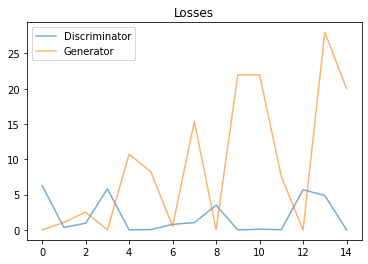

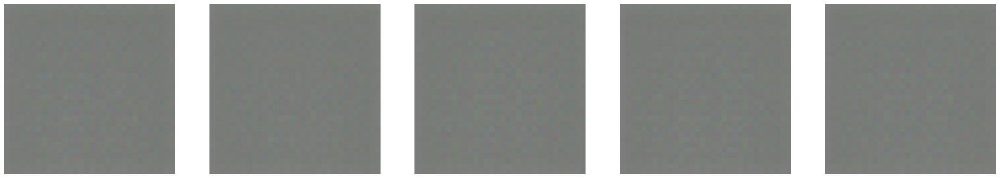

Epoch 2/80 
Duration: 3.01927 
D Loss: 1.54615 
G Loss: 6.68945


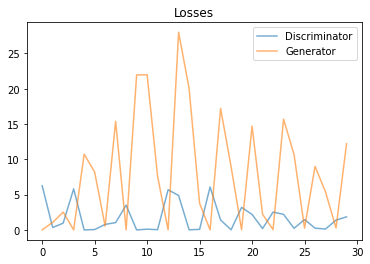

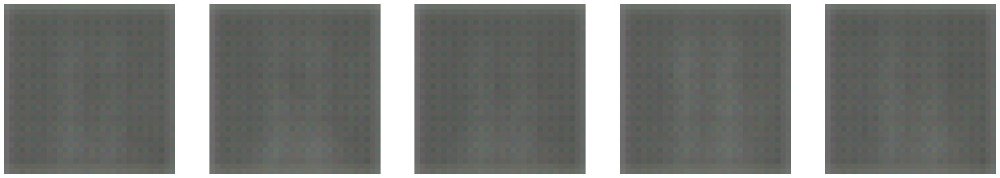

Epoch 3/80 
Duration: 3.03388 
D Loss: 0.61018 
G Loss: 5.72869


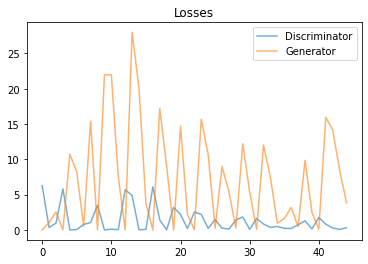

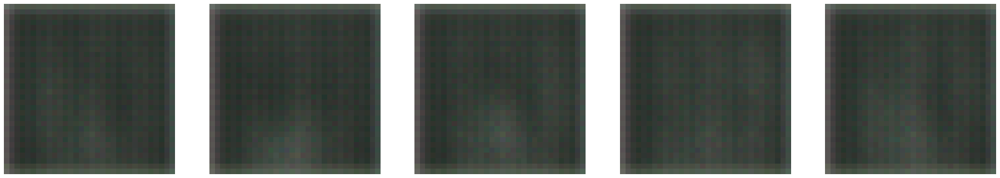

Epoch 4/80 
Duration: 3.05239 
D Loss: 0.35373 
G Loss: 3.04345


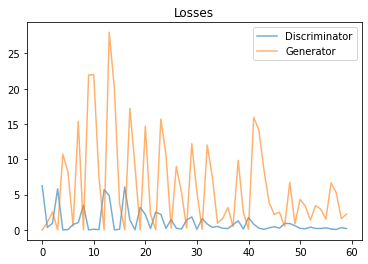

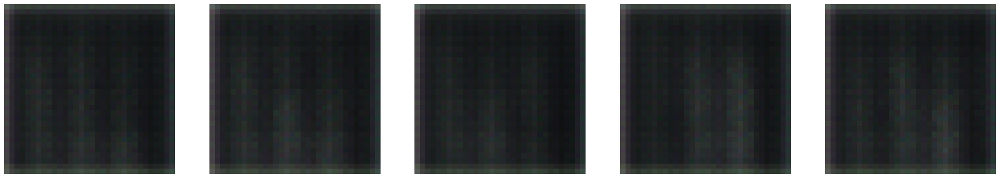

Epoch 5/80 
Duration: 3.04940 
D Loss: 0.09032 
G Loss: 3.44098


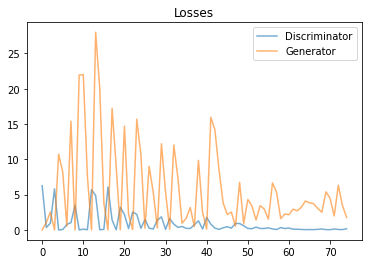

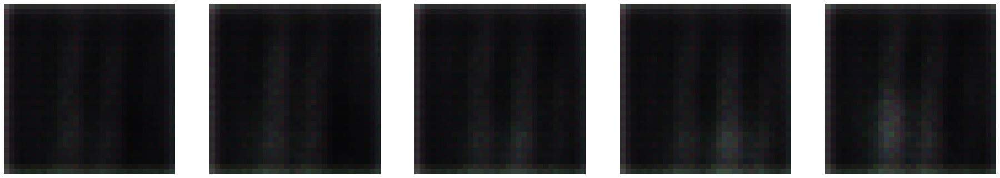

Epoch 6/80 
Duration: 3.06693 
D Loss: 0.21150 
G Loss: 5.81585


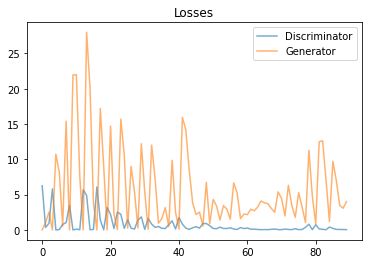

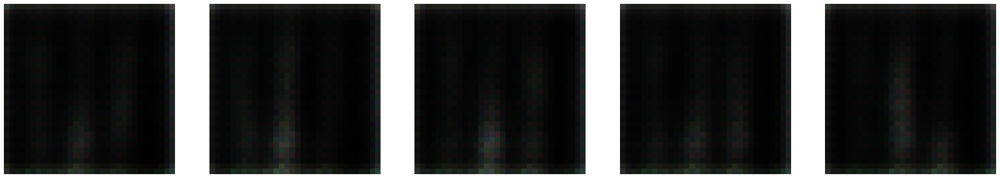

Epoch 7/80 
Duration: 3.08296 
D Loss: 0.06386 
G Loss: 3.53509


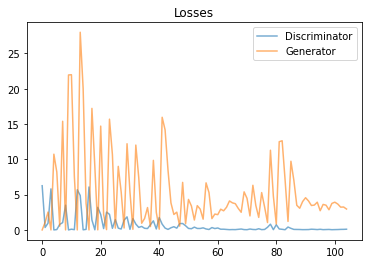

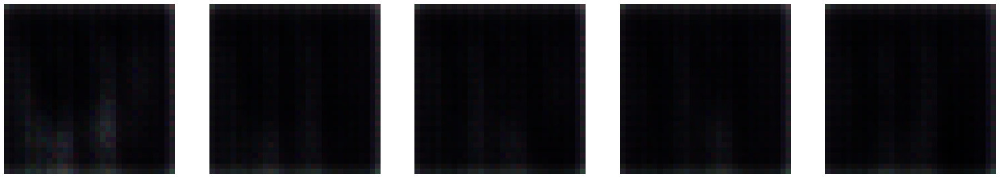

Epoch 8/80 
Duration: 3.08261 
D Loss: 0.21661 
G Loss: 3.27917


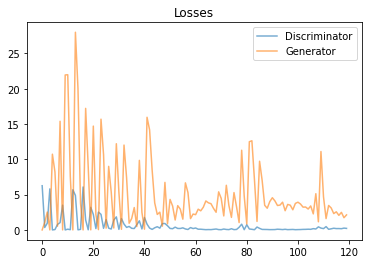

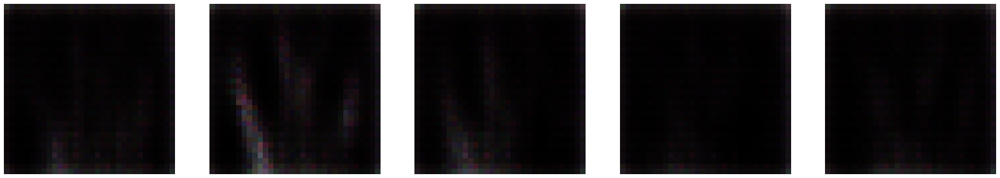

Epoch 9/80 
Duration: 3.06337 
D Loss: 0.57688 
G Loss: 3.02500


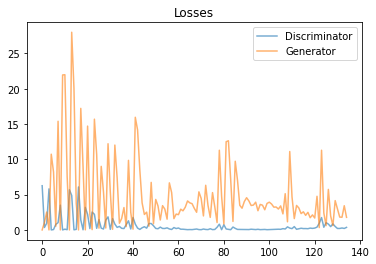

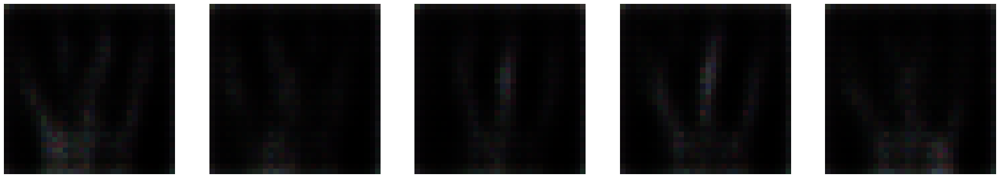

Epoch 10/80 
Duration: 3.05247 
D Loss: 0.47835 
G Loss: 2.25946


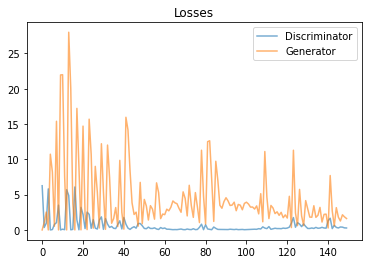

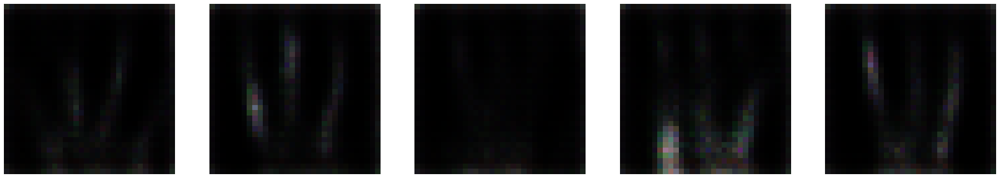

Epoch 11/80 
Duration: 3.04902 
D Loss: 0.36731 
G Loss: 2.30427


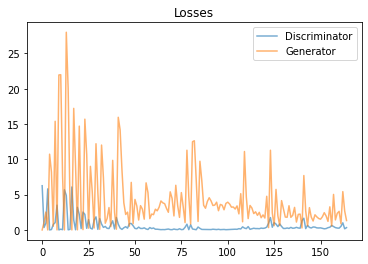

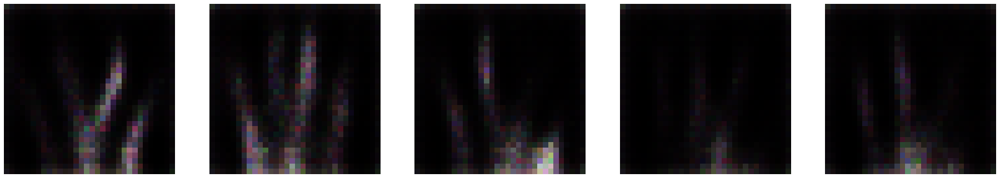

Epoch 12/80 
Duration: 3.04815 
D Loss: 0.41524 
G Loss: 2.16213


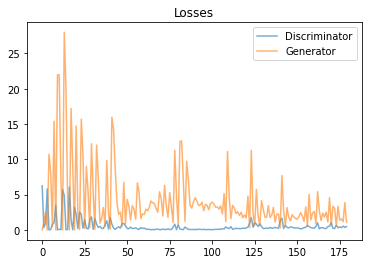

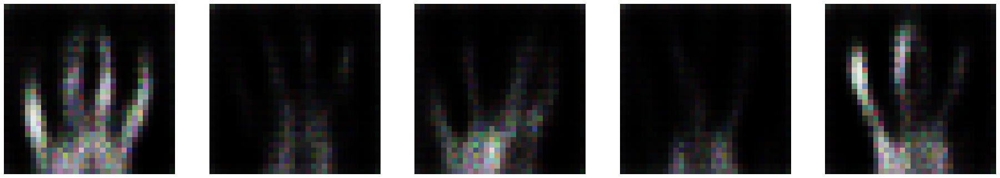

Epoch 13/80 
Duration: 3.03125 
D Loss: 0.41228 
G Loss: 2.29477


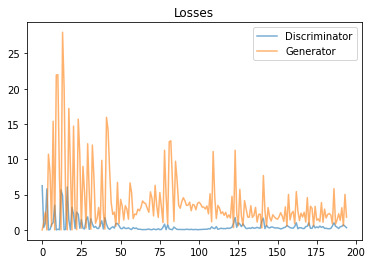

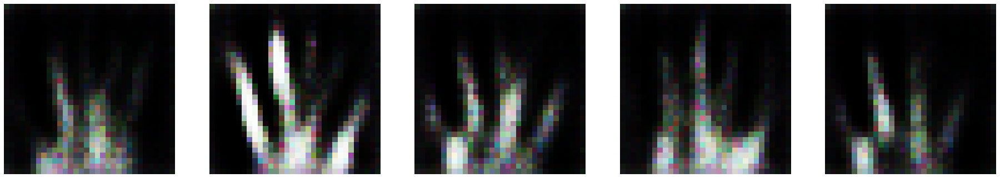

Epoch 14/80 
Duration: 3.03045 
D Loss: 0.33876 
G Loss: 2.23597


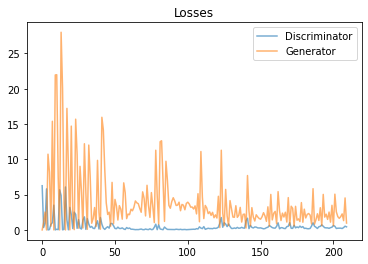

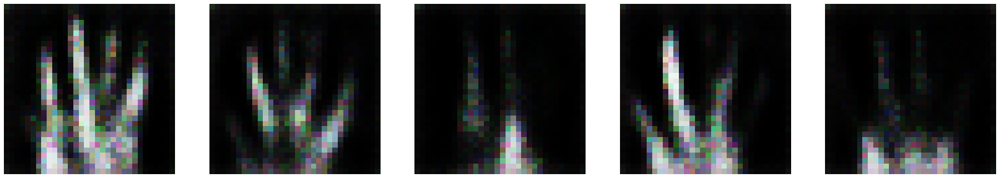

Epoch 15/80 
Duration: 3.03746 
D Loss: 0.24451 
G Loss: 2.36078


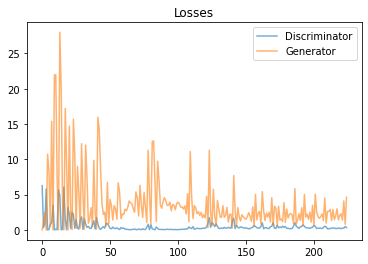

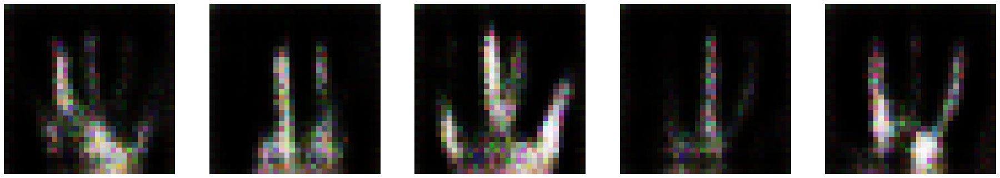

Epoch 16/80 
Duration: 3.02657 
D Loss: 0.45132 
G Loss: 2.29966


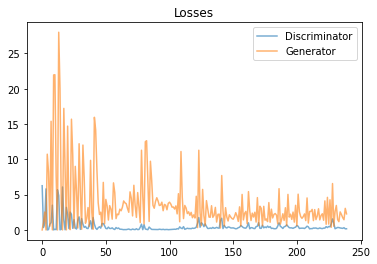

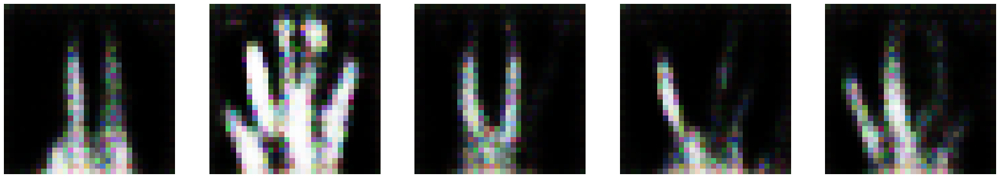

Epoch 17/80 
Duration: 3.03154 
D Loss: 0.23021 
G Loss: 2.06068


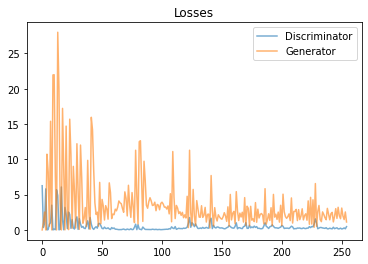

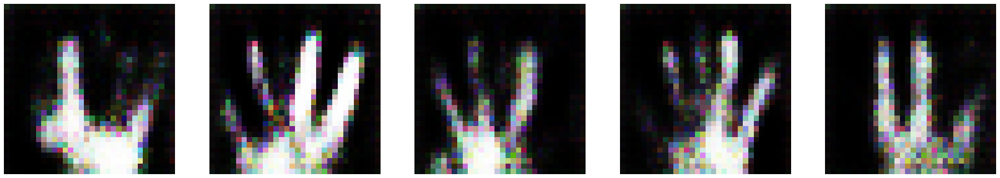

Epoch 18/80 
Duration: 3.03525 
D Loss: 0.27372 
G Loss: 2.43488


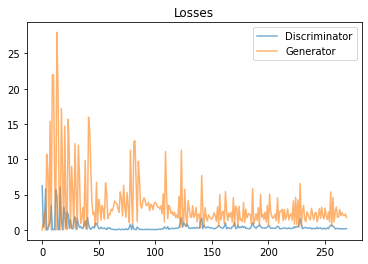

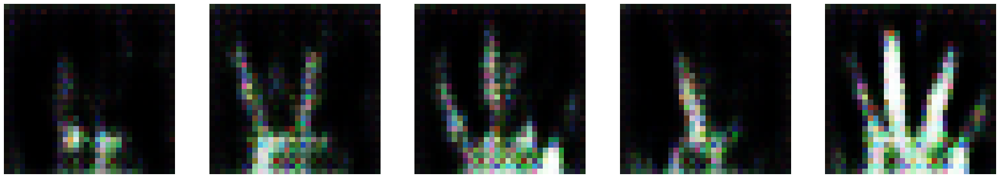

Epoch 19/80 
Duration: 3.01520 
D Loss: 0.23821 
G Loss: 2.35602


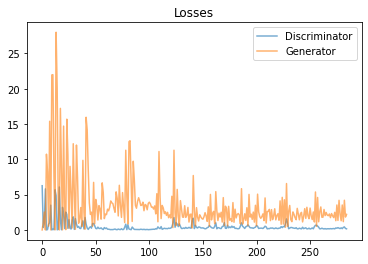

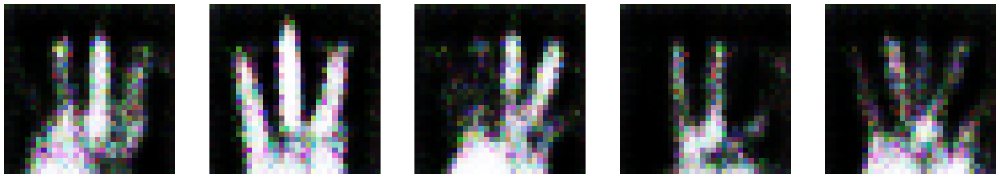

Epoch 20/80 
Duration: 3.02034 
D Loss: 0.31650 
G Loss: 2.35153


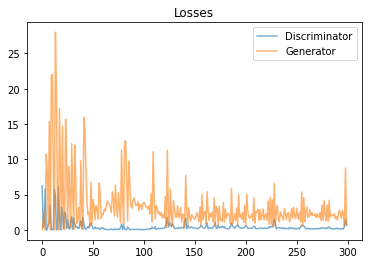

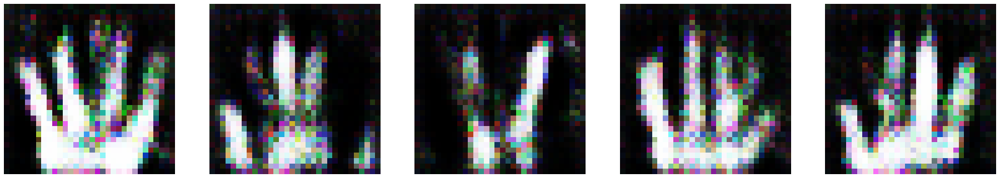

Epoch 21/80 
Duration: 3.01874 
D Loss: 0.42780 
G Loss: 2.28372


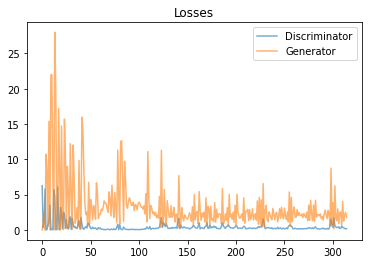

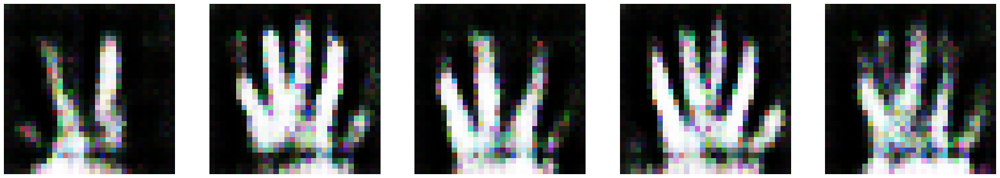

Epoch 22/80 
Duration: 3.01847 
D Loss: 0.45708 
G Loss: 2.46559


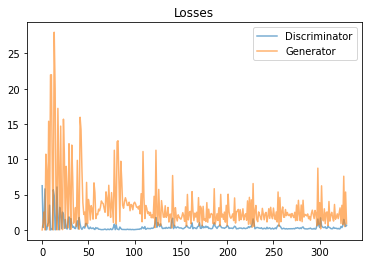

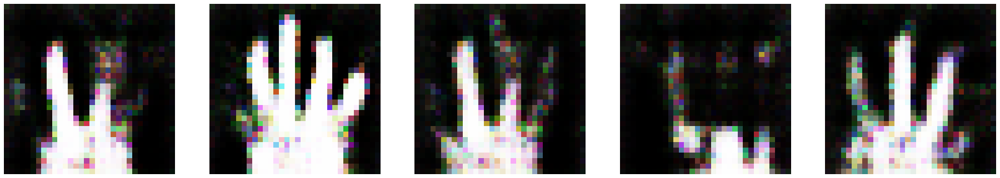

Epoch 23/80 
Duration: 3.03718 
D Loss: 0.22562 
G Loss: 2.29885


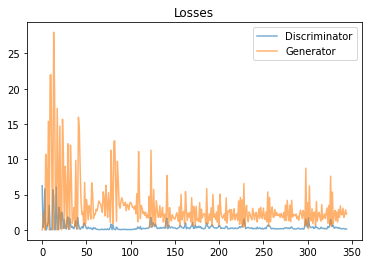

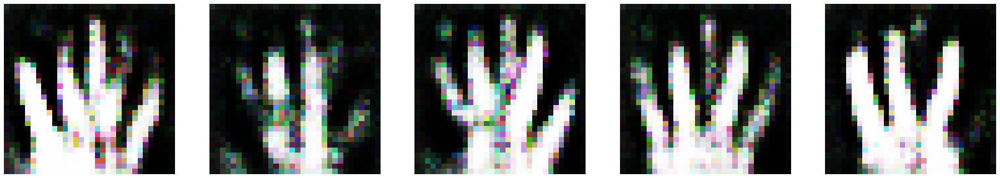

Epoch 24/80 
Duration: 3.03519 
D Loss: 0.18122 
G Loss: 2.32176


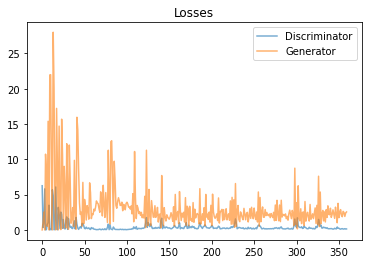

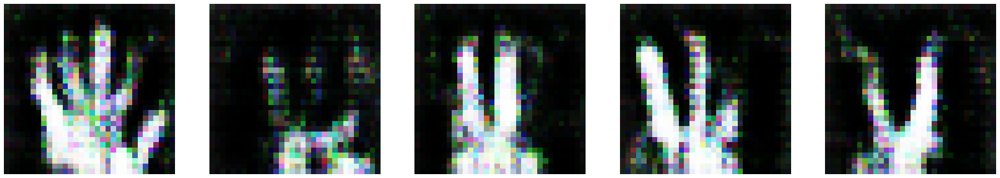

Epoch 25/80 
Duration: 3.04552 
D Loss: 0.16224 
G Loss: 2.18543


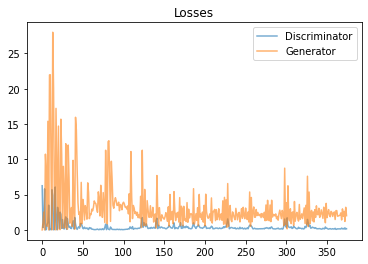

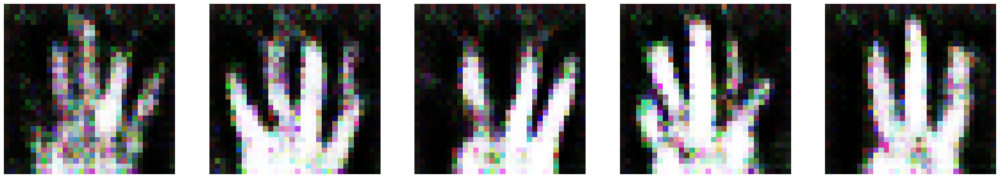

Epoch 26/80 
Duration: 3.04379 
D Loss: 0.18094 
G Loss: 2.20437


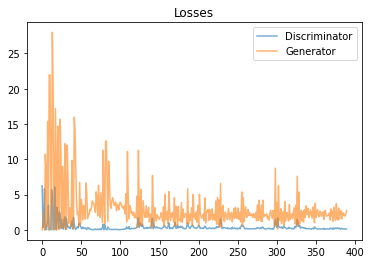

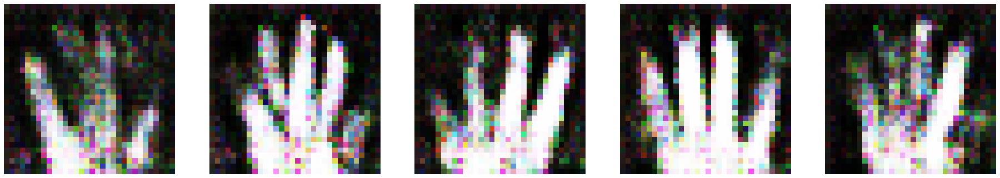

Epoch 27/80 
Duration: 3.04932 
D Loss: 0.19197 
G Loss: 2.21080


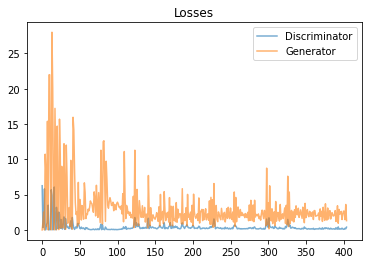

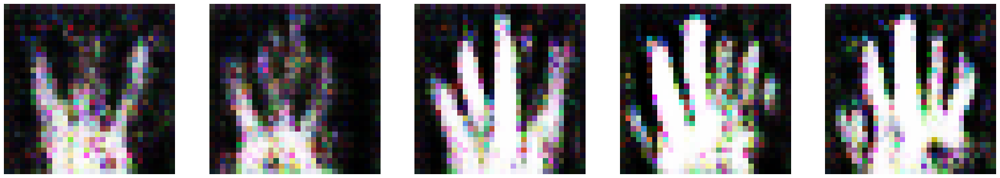

Epoch 28/80 
Duration: 3.06221 
D Loss: 0.16714 
G Loss: 2.40935


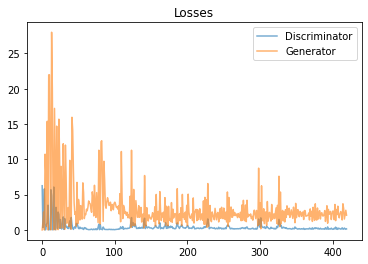

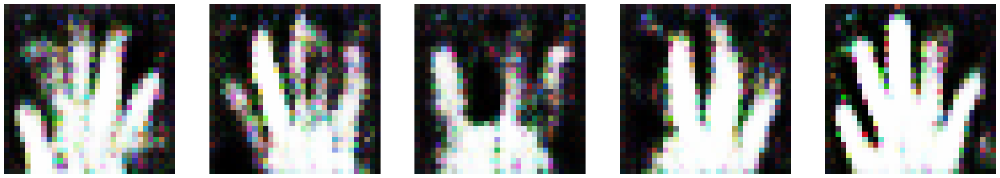

Epoch 29/80 
Duration: 3.05026 
D Loss: 0.89009 
G Loss: 1.96490


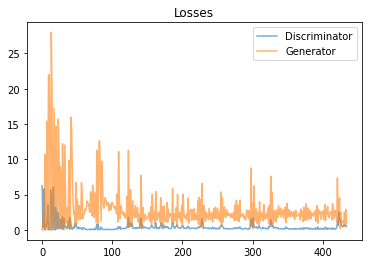

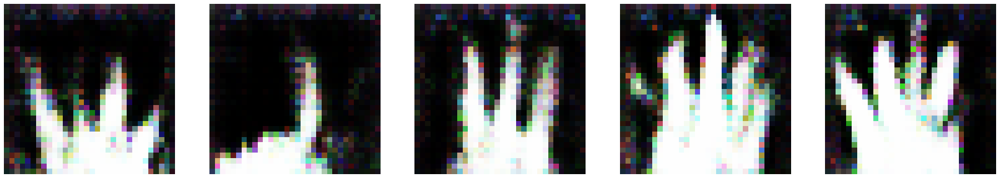

Epoch 30/80 
Duration: 3.04536 
D Loss: 0.39643 
G Loss: 1.81553


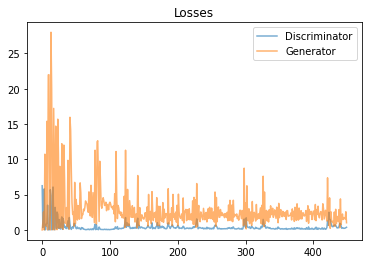

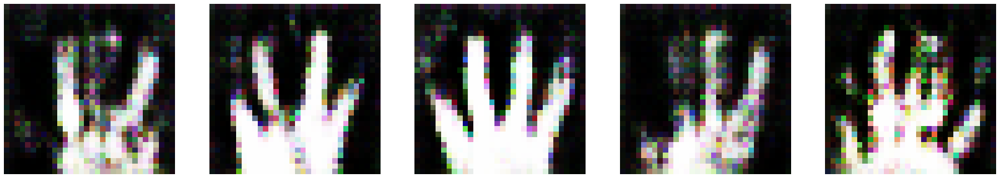

Epoch 31/80 
Duration: 3.04623 
D Loss: 0.30500 
G Loss: 2.11886


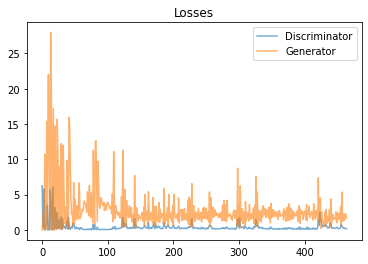

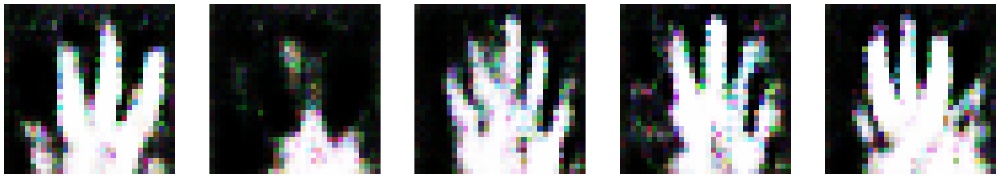

Epoch 32/80 
Duration: 3.03850 
D Loss: 0.23272 
G Loss: 2.30102


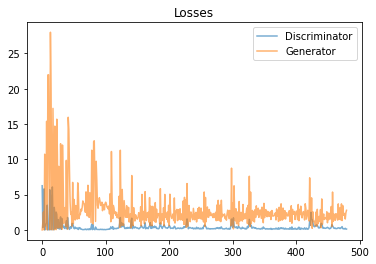

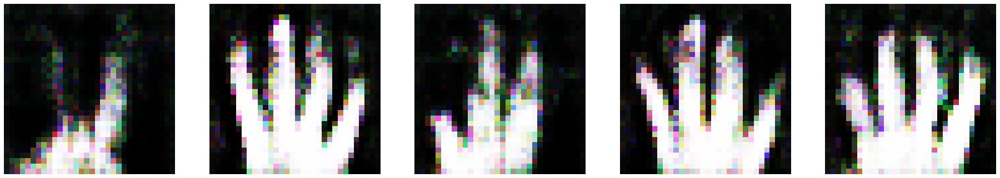

Epoch 33/80 
Duration: 3.04266 
D Loss: 0.62718 
G Loss: 2.38275


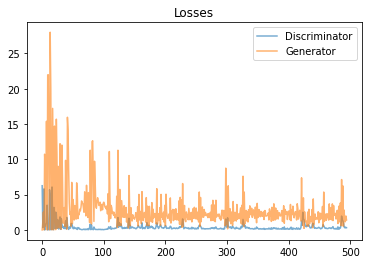

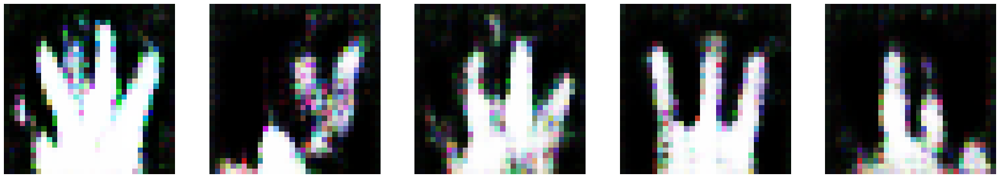

Epoch 34/80 
Duration: 3.04951 
D Loss: 0.41401 
G Loss: 2.07333


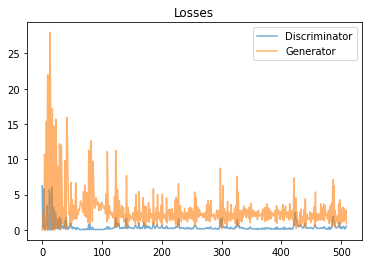

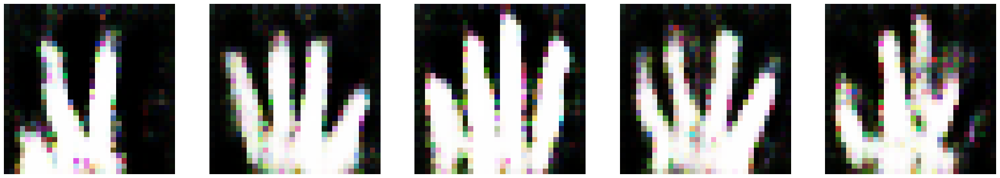

Epoch 35/80 
Duration: 3.04111 
D Loss: 0.16691 
G Loss: 2.07222


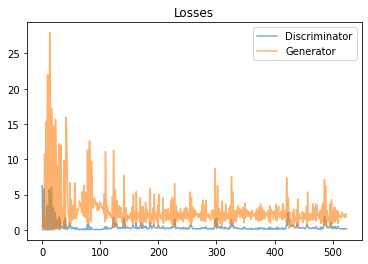

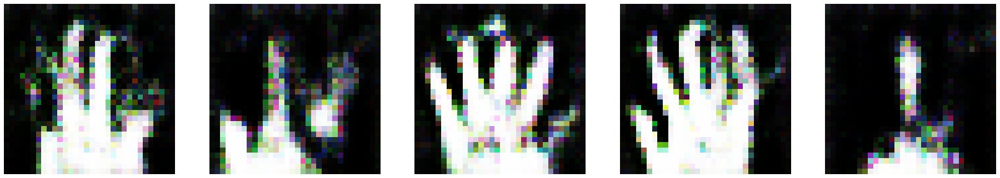

Epoch 36/80 
Duration: 3.02964 
D Loss: 0.17178 
G Loss: 2.18084


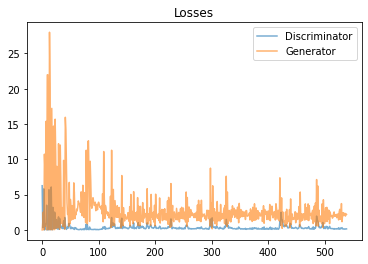

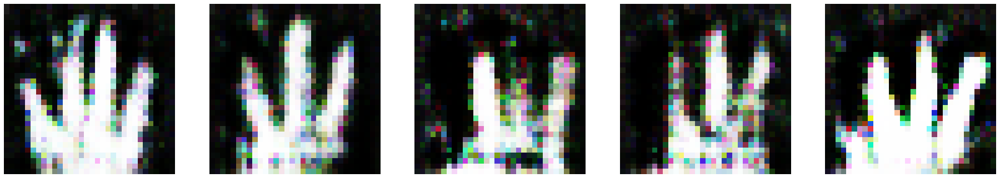

Epoch 37/80 
Duration: 3.04051 
D Loss: 0.14787 
G Loss: 2.20901


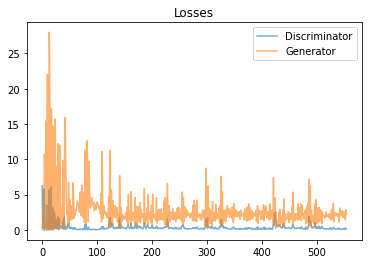

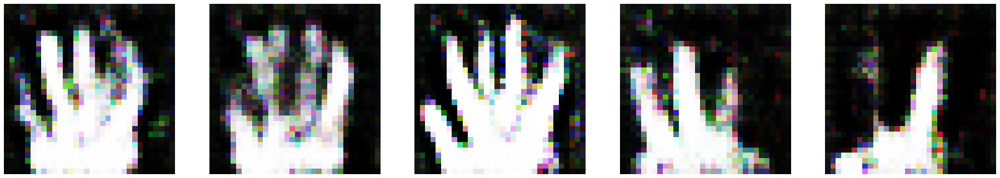

Epoch 38/80 
Duration: 3.02600 
D Loss: 0.13847 
G Loss: 2.29451


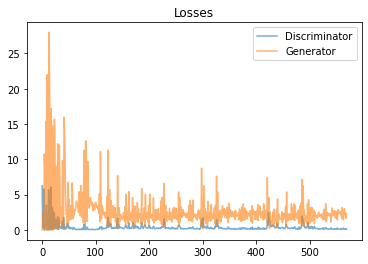

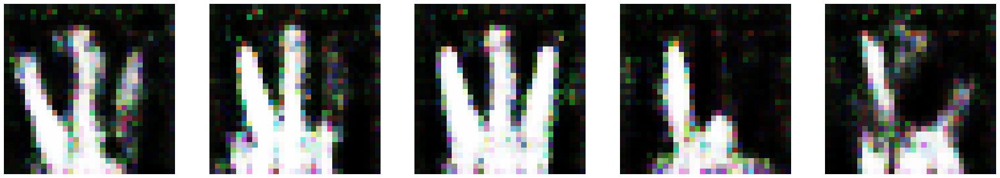

Epoch 39/80 
Duration: 3.02471 
D Loss: 0.19039 
G Loss: 2.08320


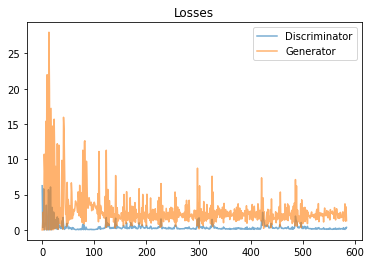

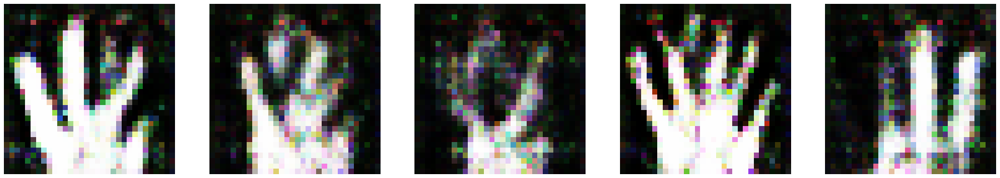

Epoch 40/80 
Duration: 3.02138 
D Loss: 0.89076 
G Loss: 2.85603


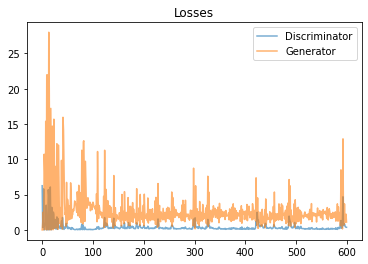

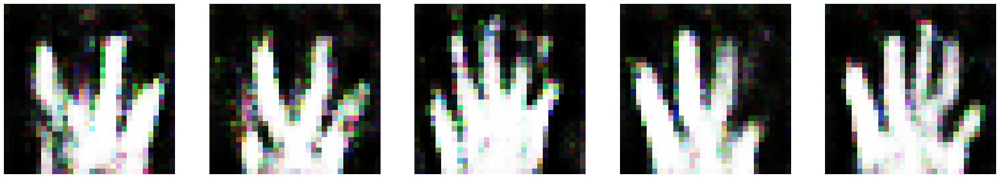

Epoch 41/80 
Duration: 3.02983 
D Loss: 0.29609 
G Loss: 2.16217


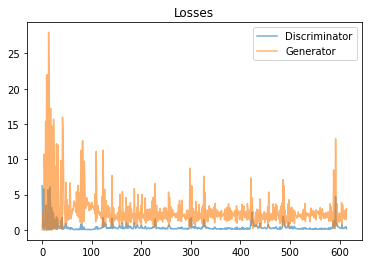

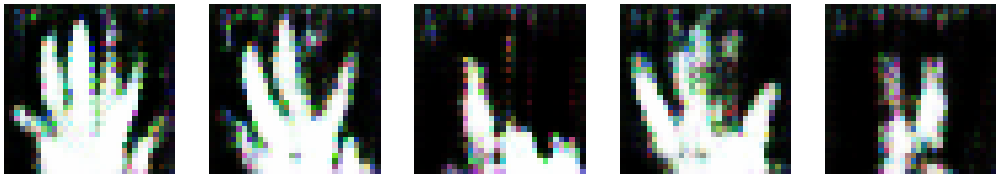

Epoch 42/80 
Duration: 3.02606 
D Loss: 0.20220 
G Loss: 2.04006


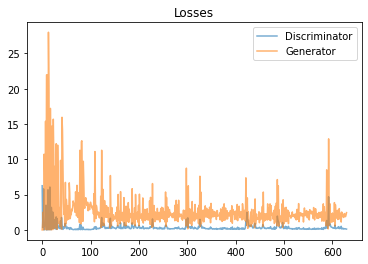

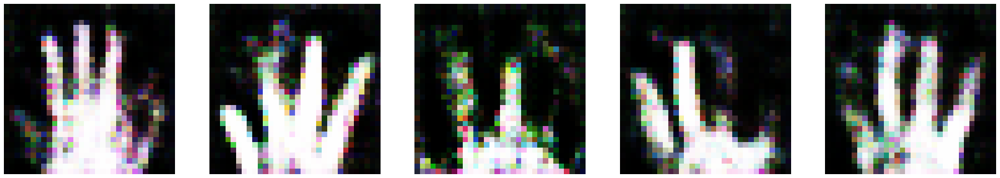

Epoch 43/80 
Duration: 3.03584 
D Loss: 0.17784 
G Loss: 2.10630


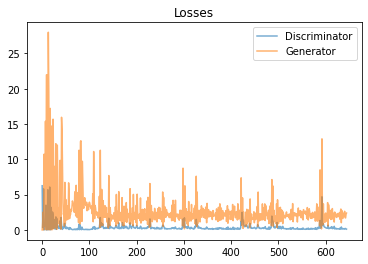

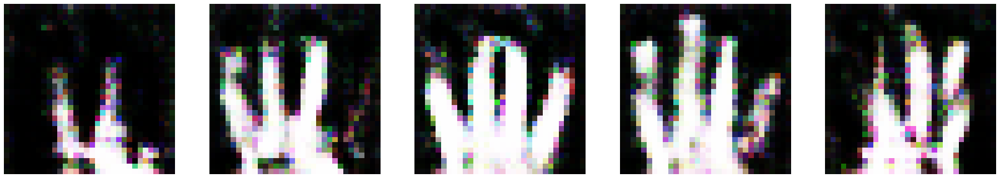

Epoch 44/80 
Duration: 3.03183 
D Loss: 0.15479 
G Loss: 2.03356


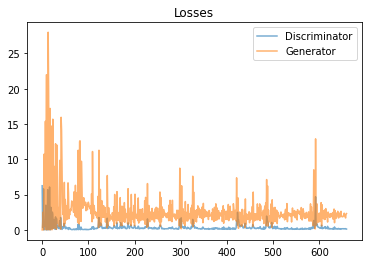

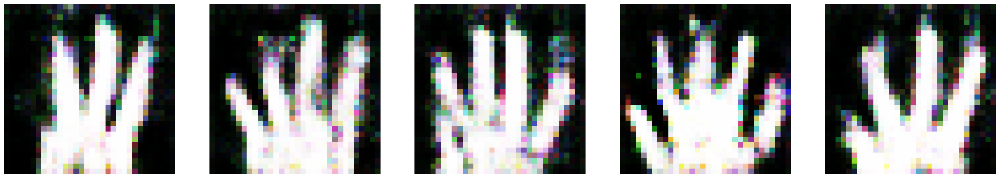

Epoch 45/80 
Duration: 3.02838 
D Loss: 0.18340 
G Loss: 2.14794


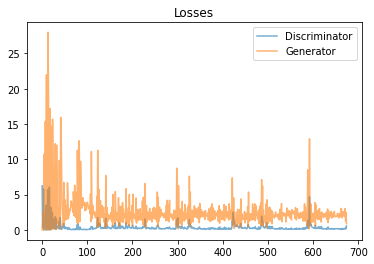

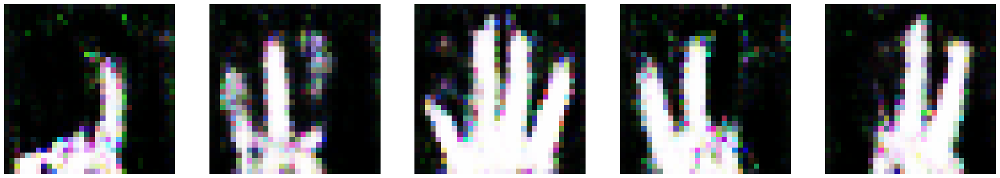

Epoch 46/80 
Duration: 3.03810 
D Loss: 0.77650 
G Loss: 2.31135


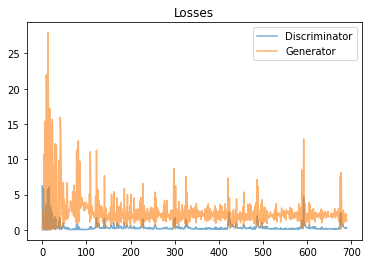

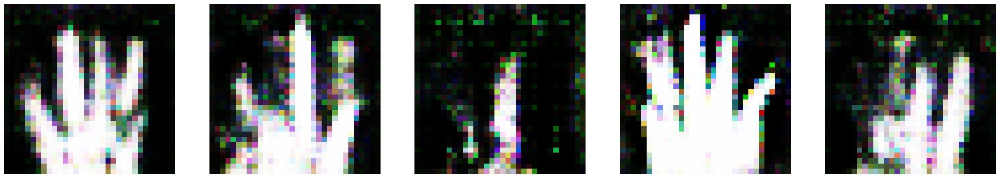

Epoch 47/80 
Duration: 3.04355 
D Loss: 0.24104 
G Loss: 2.04866


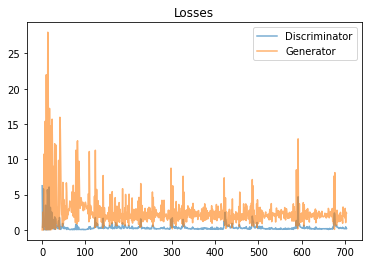

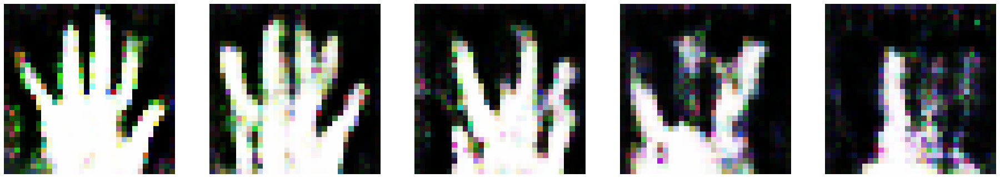

Epoch 48/80 
Duration: 3.03918 
D Loss: 0.18369 
G Loss: 2.03394


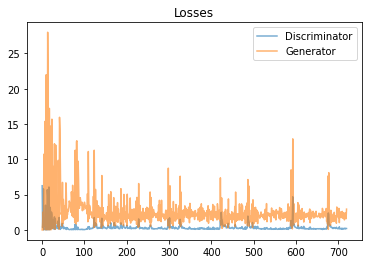

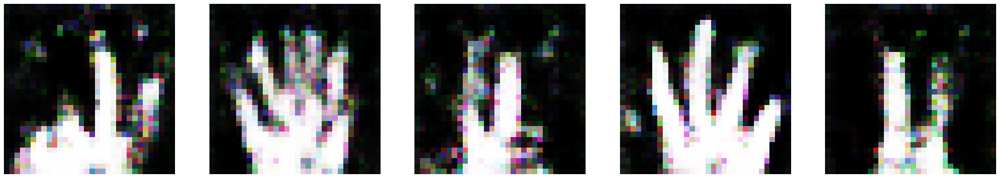

Epoch 49/80 
Duration: 3.02615 
D Loss: 0.15795 
G Loss: 2.15174


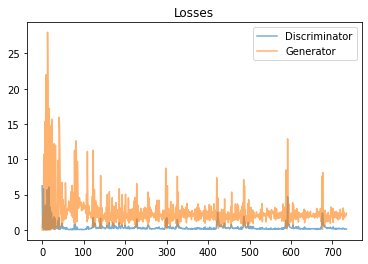

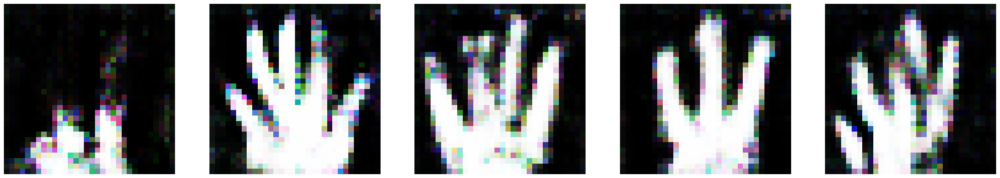

Epoch 50/80 
Duration: 3.03367 
D Loss: 0.14203 
G Loss: 2.18076


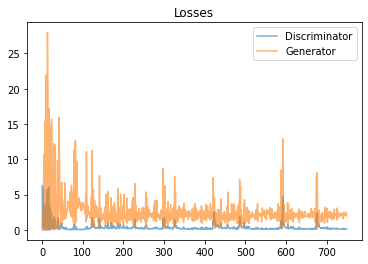

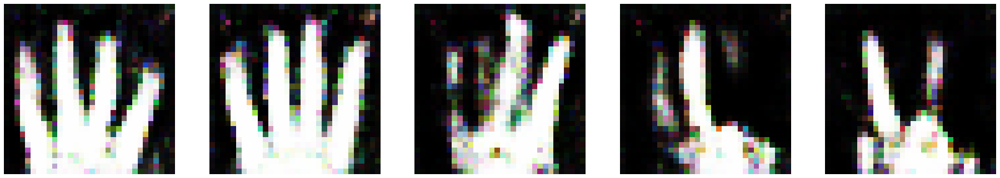

Epoch 51/80 
Duration: 3.05856 
D Loss: 0.14140 
G Loss: 2.17512


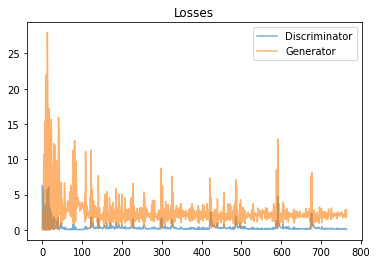

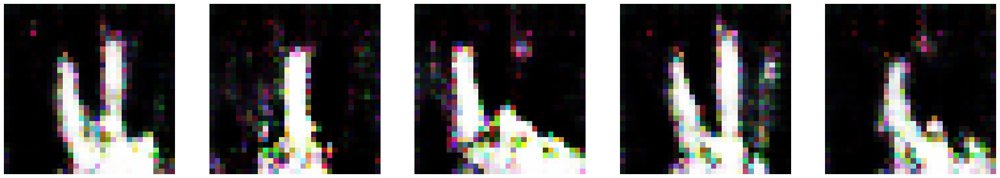

Epoch 52/80 
Duration: 3.05199 
D Loss: 0.52788 
G Loss: 2.94314


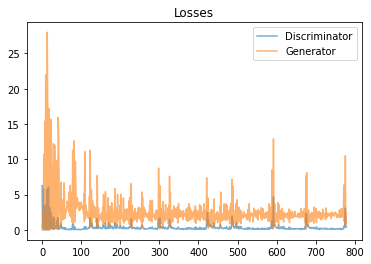

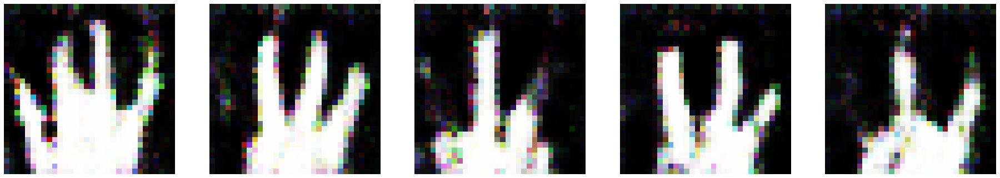

Epoch 53/80 
Duration: 3.03693 
D Loss: 0.40602 
G Loss: 2.13447


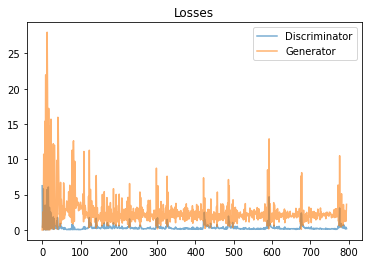

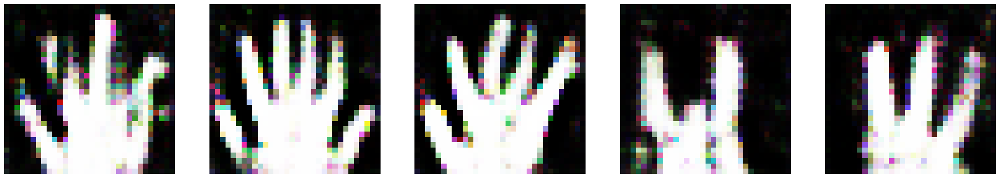

Epoch 54/80 
Duration: 3.03537 
D Loss: 0.17841 
G Loss: 2.17472


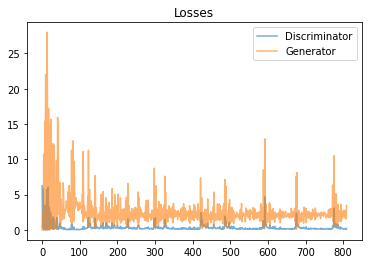

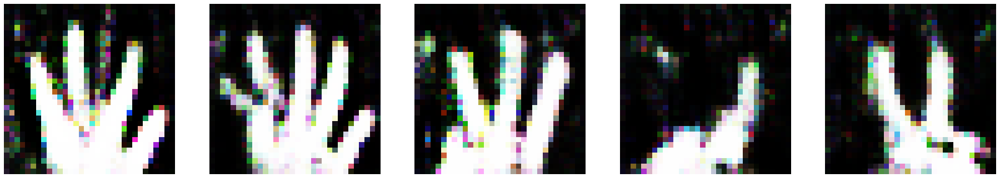

Epoch 55/80 
Duration: 3.05493 
D Loss: 0.14345 
G Loss: 2.21304


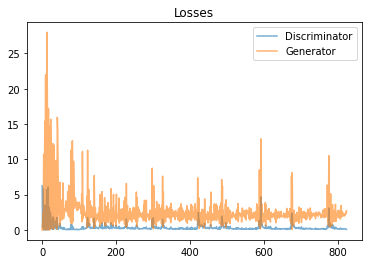

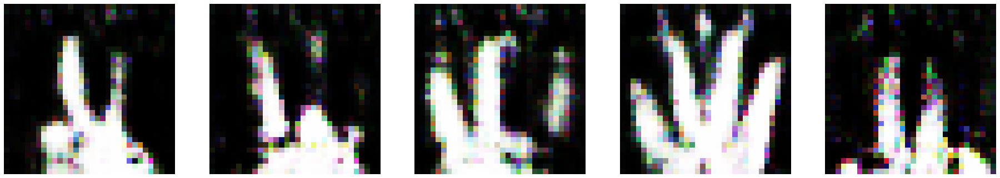

Epoch 56/80 
Duration: 3.02768 
D Loss: 0.14377 
G Loss: 2.34753


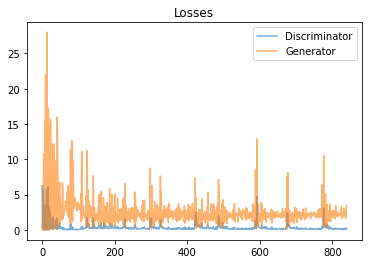

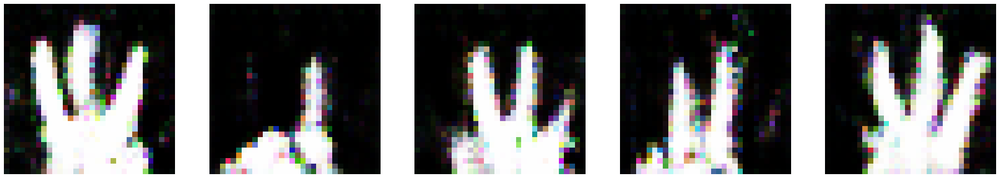

Epoch 57/80 
Duration: 3.04577 
D Loss: 0.58012 
G Loss: 2.47095


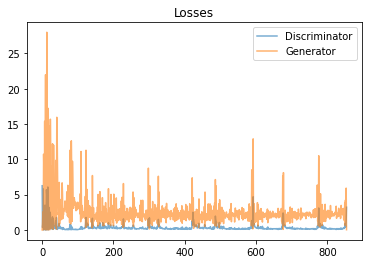

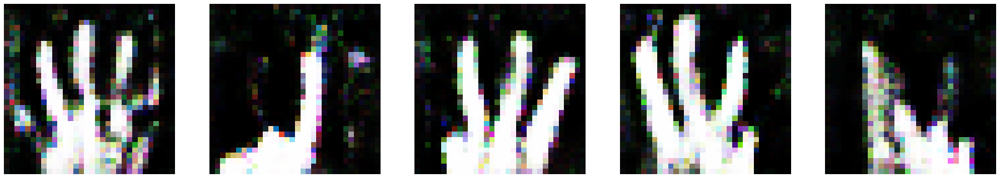

Epoch 58/80 
Duration: 3.03718 
D Loss: 0.66147 
G Loss: 2.18489


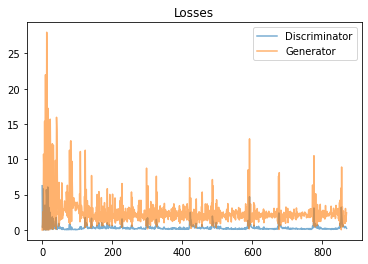

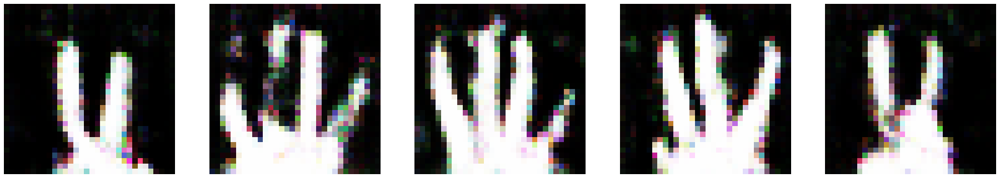

Epoch 59/80 
Duration: 3.04128 
D Loss: 0.19216 
G Loss: 2.00555


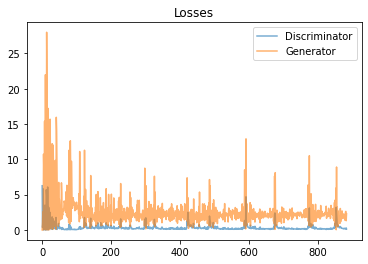

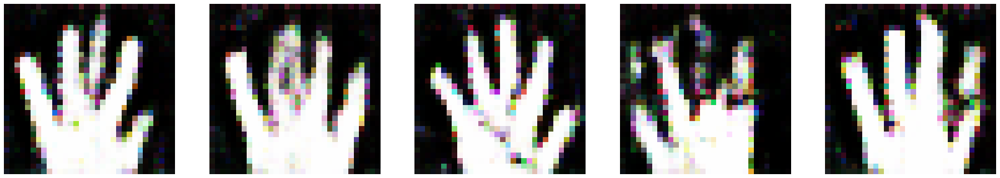

Epoch 60/80 
Duration: 3.04694 
D Loss: 0.20330 
G Loss: 2.08419


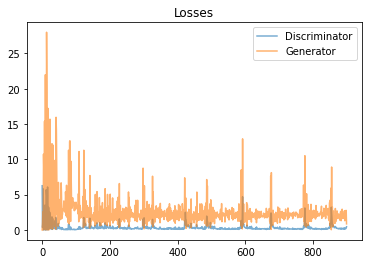

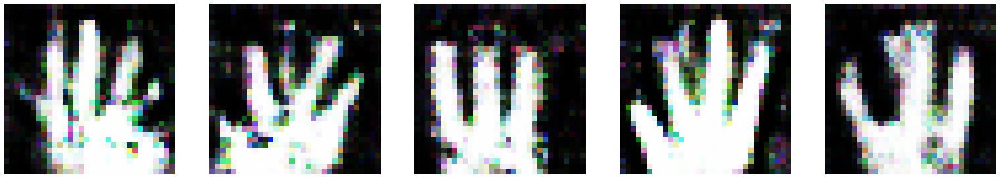

Epoch 61/80 
Duration: 3.05860 
D Loss: 0.54807 
G Loss: 2.28456


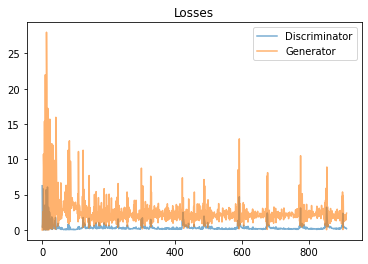

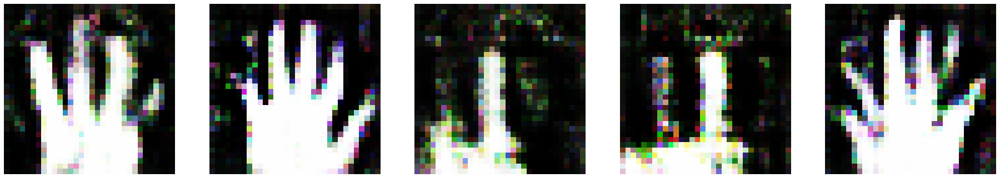

Epoch 62/80 
Duration: 3.04116 
D Loss: 0.16766 
G Loss: 2.10331


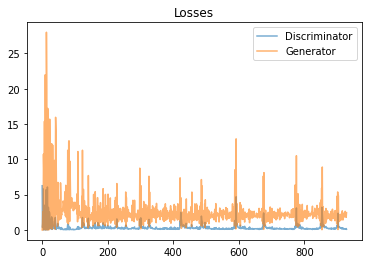

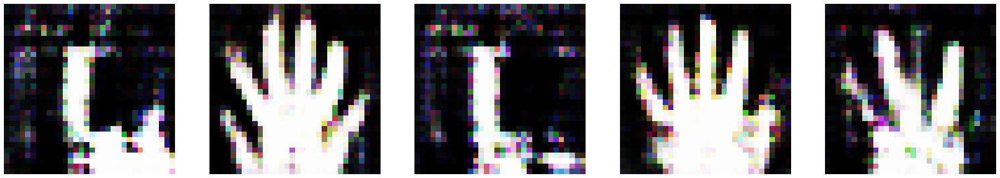

Epoch 63/80 
Duration: 3.03827 
D Loss: 0.12531 
G Loss: 2.28839


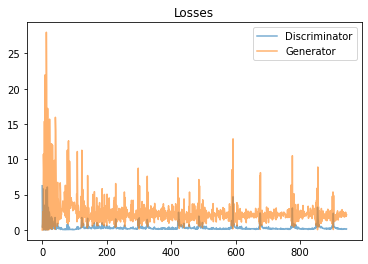

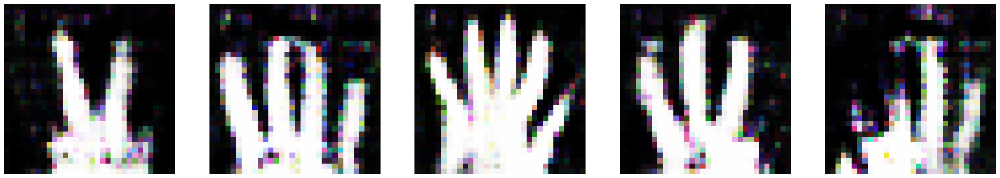

Epoch 64/80 
Duration: 3.04115 
D Loss: 0.12245 
G Loss: 2.38260


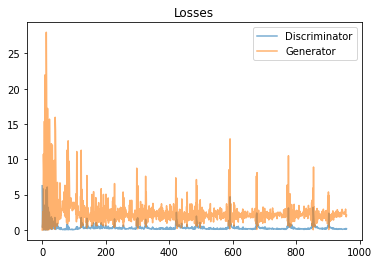

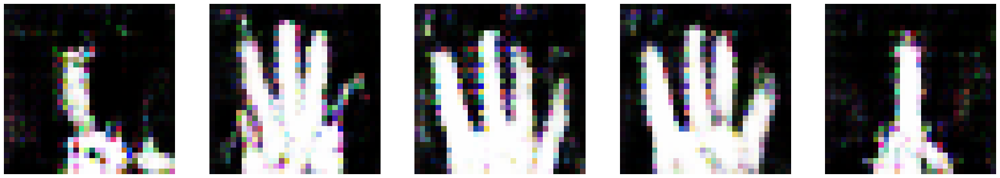

Epoch 65/80 
Duration: 3.03455 
D Loss: 0.11898 
G Loss: 2.49659


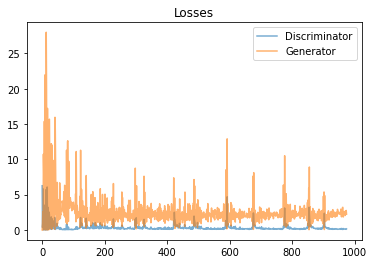

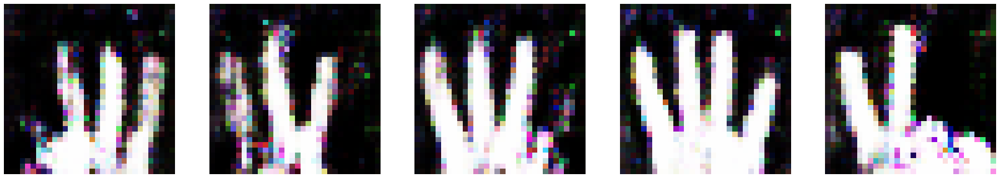

Epoch 66/80 
Duration: 3.03620 
D Loss: 0.11987 
G Loss: 2.48036


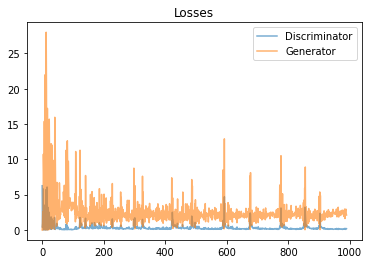

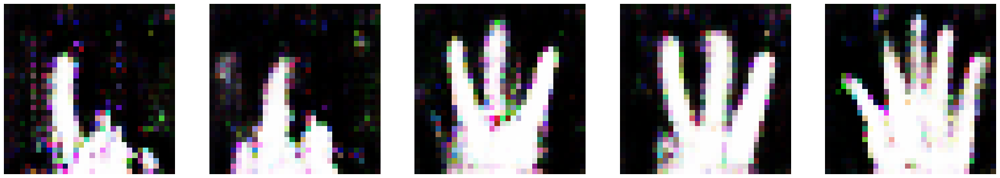

Epoch 67/80 
Duration: 3.05426 
D Loss: 0.11662 
G Loss: 2.64074


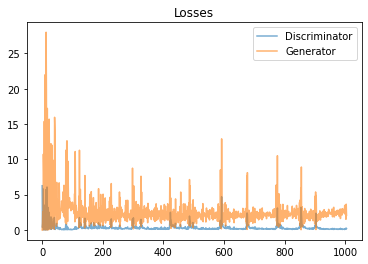

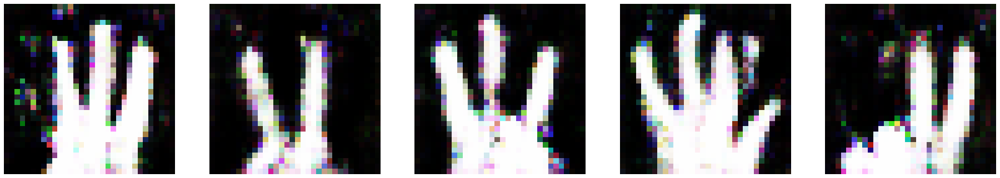

Epoch 68/80 
Duration: 3.04500 
D Loss: 0.11417 
G Loss: 2.74600


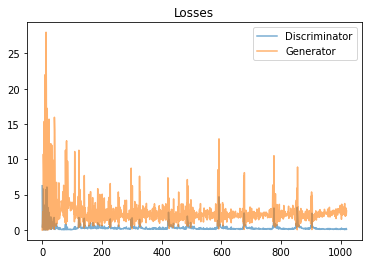

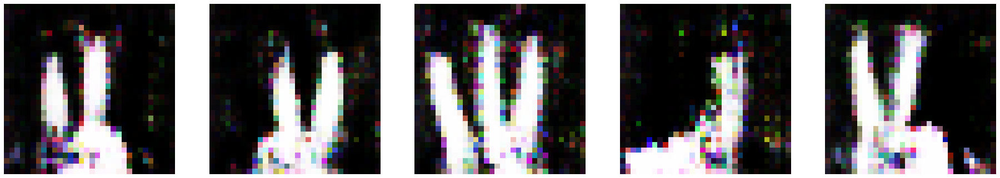

Epoch 69/80 
Duration: 3.03420 
D Loss: 0.09077 
G Loss: 2.82838


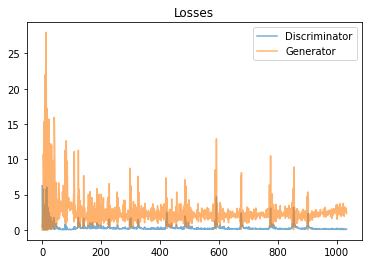

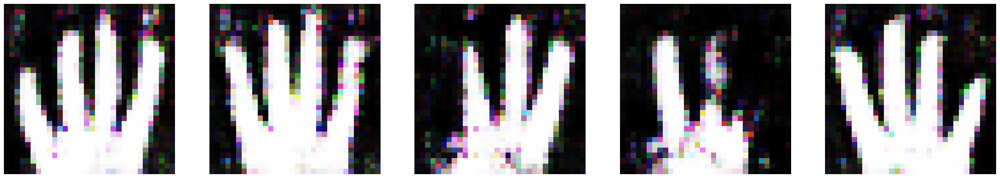

Epoch 70/80 
Duration: 3.03715 
D Loss: 0.09224 
G Loss: 2.79925


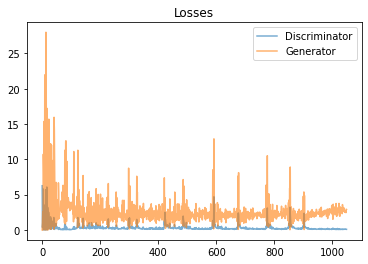

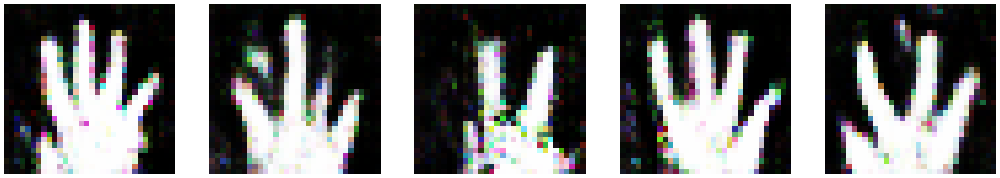

Epoch 71/80 
Duration: 3.03964 
D Loss: 0.08950 
G Loss: 2.90514


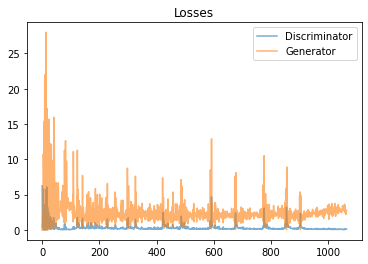

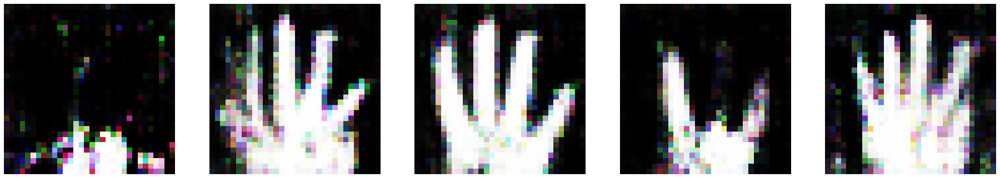

Epoch 72/80 
Duration: 3.03568 
D Loss: 0.11089 
G Loss: 2.80827


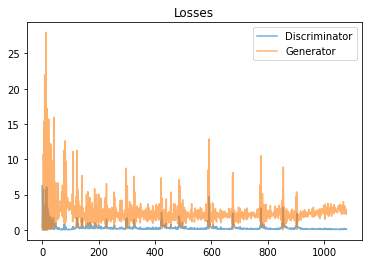

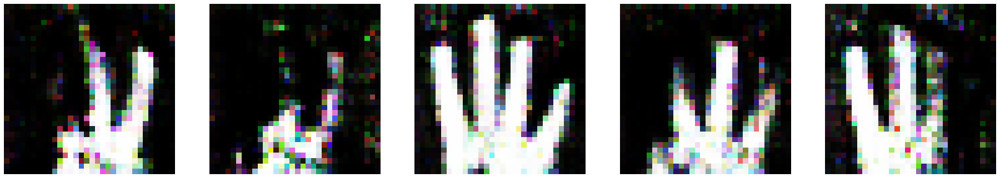

Epoch 73/80 
Duration: 3.03327 
D Loss: 0.09289 
G Loss: 2.98827


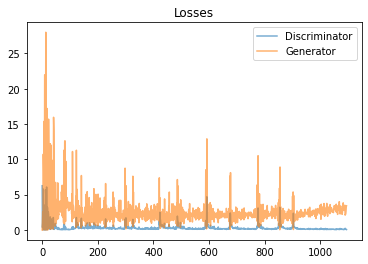

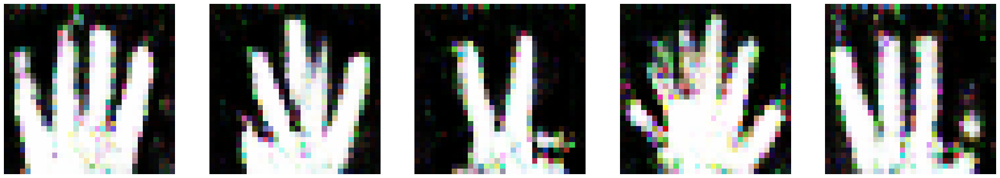

Epoch 74/80 
Duration: 3.04361 
D Loss: 0.07961 
G Loss: 3.17499


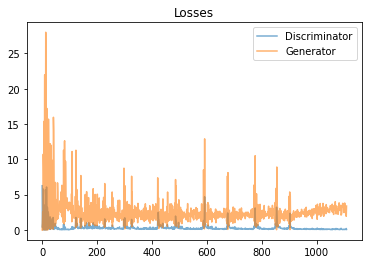

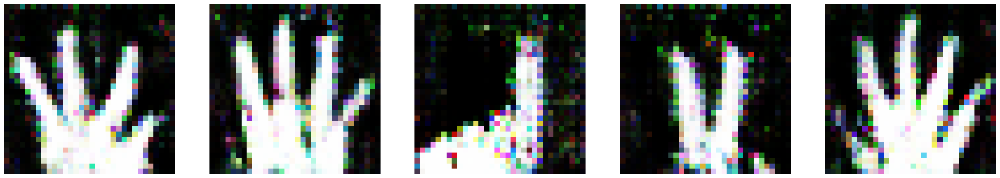

Epoch 75/80 
Duration: 3.05079 
D Loss: 0.62604 
G Loss: 3.76659


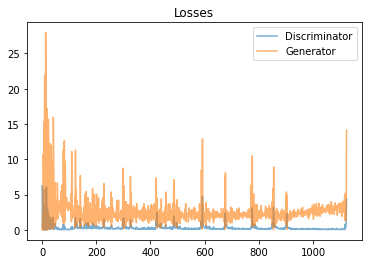

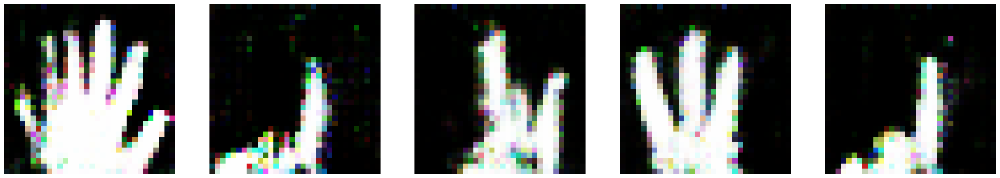

Epoch 76/80 
Duration: 3.02990 
D Loss: 0.65620 
G Loss: 1.90571


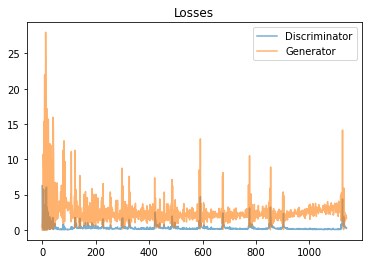

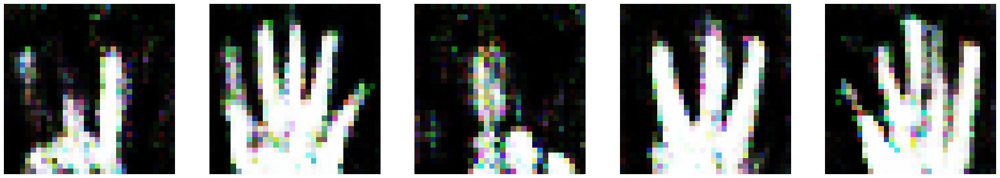

Epoch 77/80 
Duration: 3.03023 
D Loss: 0.23030 
G Loss: 2.07153


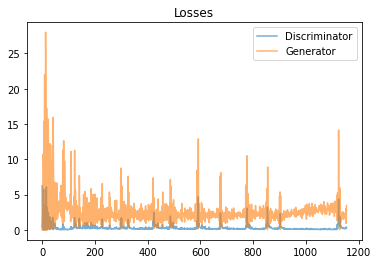

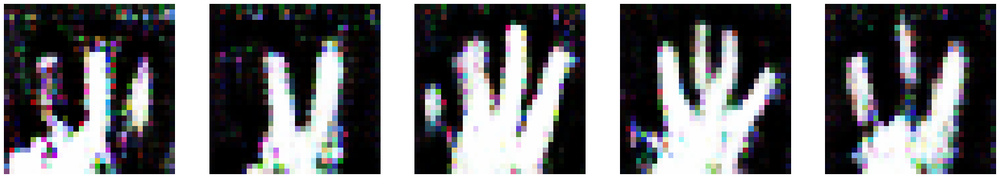

Epoch 78/80 
Duration: 3.02518 
D Loss: 0.40910 
G Loss: 2.48975


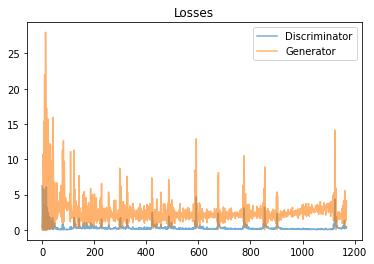

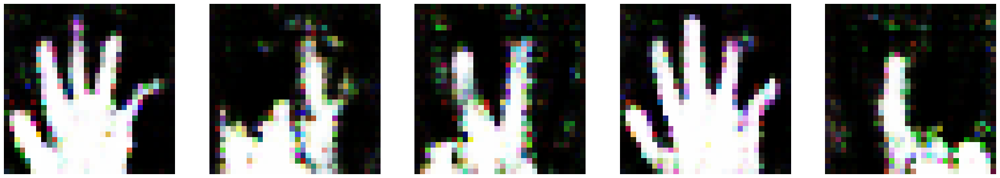

Epoch 79/80 
Duration: 3.04550 
D Loss: 0.35020 
G Loss: 2.37375


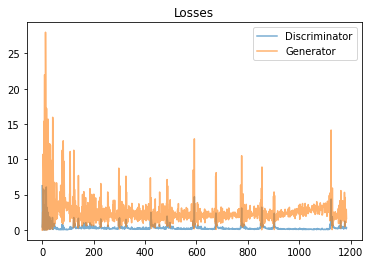

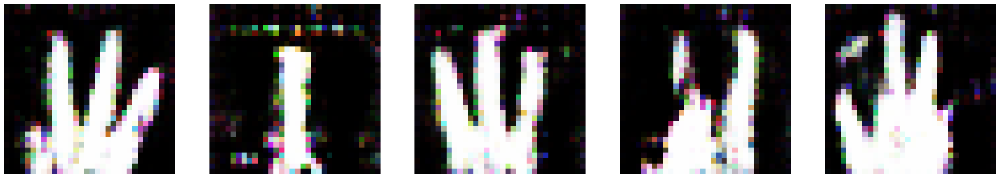

Epoch 80/80 
Duration: 3.05386 
D Loss: 0.20806 
G Loss: 2.45570


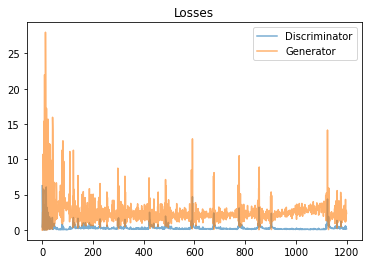

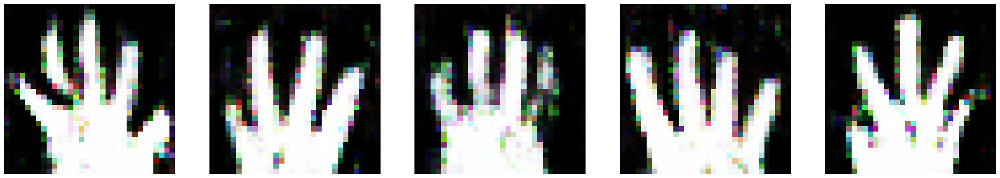

<ipython-input-26-603456c01da7>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(10)):


  0%|          | 0/10 [00:00<?, ?it/s]

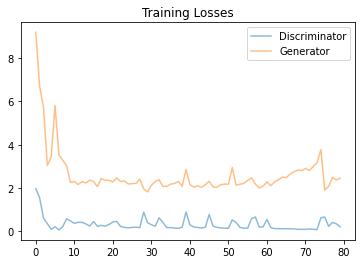

>> train time =  297.46618580818176


In [40]:
start = time.time()

print(">> Start training...")
with tf.Graph().as_default():
    train(get_batches(imagesIn), imagesIn.shape)
    
print(">> train time = ",time.time() - start)

In [41]:
!zip -r /content/images_Add_Noise.zip /content/images_Add_Noise

from google.colab import files
files.download('/content/images_Add_Noise.zip')

  adding: content/images_Add_Noise/ (stored 0%)
  adding: content/images_Add_Noise/image8.png (stored 0%)
  adding: content/images_Add_Noise/image4.png (stored 0%)
  adding: content/images_Add_Noise/image0.png (stored 0%)
  adding: content/images_Add_Noise/image5.png (stored 0%)
  adding: content/images_Add_Noise/image3.png (stored 0%)
  adding: content/images_Add_Noise/image1.png (stored 0%)
  adding: content/images_Add_Noise/image7.png (stored 0%)
  adding: content/images_Add_Noise/image2.png (stored 0%)
  adding: content/images_Add_Noise/image9.png (stored 0%)
  adding: content/images_Add_Noise/image6.png (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>